## 搭建一个简单的问答系统 （Building a Simple QA System）

本次项目的目标是搭建一个基于检索式的简易的问答系统，这是一个最经典的方法也是最有效的方法。  

```不要单独创建一个文件，所有的都在这里面编写，不要试图改已经有的函数名字 （但可以根据需求自己定义新的函数）```

```预估完成时间```： 5-10小时

#### 检索式的问答系统
问答系统所需要的数据已经提供，对于每一个问题都可以找得到相应的答案，所以可以理解为每一个样本数据是 ``<问题、答案>``。 那系统的核心是当用户输入一个问题的时候，首先要找到跟这个问题最相近的已经存储在库里的问题，然后直接返回相应的答案即可（但实际上也可以抽取其中的实体或者关键词)。 举一个简单的例子：

假设我们的库里面已有存在以下几个<问题,答案>：
- <"贪心学院主要做什么方面的业务？”， “他们主要做人工智能方面的教育”>
- <“国内有哪些做人工智能教育的公司？”， “贪心学院”>
- <"人工智能和机器学习的关系什么？", "其实机器学习是人工智能的一个范畴，很多人工智能的应用要基于机器学习的技术">
- <"人工智能最核心的语言是什么？"， ”Python“>
- .....

假设一个用户往系统中输入了问题 “贪心学院是做什么的？”， 那这时候系统先去匹配最相近的“已经存在库里的”问题。 那在这里很显然是 “贪心学院是做什么的”和“贪心学院主要做什么方面的业务？”是最相近的。 所以当我们定位到这个问题之后，直接返回它的答案 “他们主要做人工智能方面的教育”就可以了。 所以这里的核心问题可以归结为计算两个问句（query）之间的相似度。

#### 项目中涉及到的任务描述
问答系统看似简单，但其中涉及到的内容比较多。 在这里先做一个简单的解释，总体来讲，我们即将要搭建的模块包括：

- 文本的读取： 需要从相应的文件里读取```(问题，答案)```
- 文本预处理： 清洗文本很重要，需要涉及到```停用词过滤```等工作
- 文本的表示： 如果表示一个句子是非常核心的问题，这里会涉及到```tf-idf```, ```Glove```以及```BERT Embedding```
- 文本相似度匹配： 在基于检索式系统中一个核心的部分是计算文本之间的```相似度```，从而选择相似度最高的问题然后返回这些问题的答案
- 倒排表： 为了加速搜索速度，我们需要设计```倒排表```来存储每一个词与出现的文本
- 词义匹配：直接使用倒排表会忽略到一些意思上相近但不完全一样的单词，我们需要做这部分的处理。我们需要提前构建好```相似的单词```然后搜索阶段使用
- 拼写纠错：我们不能保证用户输入的准确，所以第一步需要做用户输入检查，如果发现用户拼错了，我们需要及时在后台改正，然后按照修改后的在库里面搜索
- 文档的排序： 最后返回结果的排序根据文档之间```余弦相似度```有关，同时也跟倒排表中匹配的单词有关


#### 项目中需要的数据：
1. ```dev-v2.0.json```: 这个数据包含了问题和答案的pair， 但是以JSON格式存在，需要编写parser来提取出里面的问题和答案。 
2. ```glove.6B```: 这个文件需要从网上下载，下载地址为：https://nlp.stanford.edu/projects/glove/， 请使用d=200的词向量
3. ```spell-errors.txt``` 这个文件主要用来编写拼写纠错模块。 文件中第一列为正确的单词，之后列出来的单词都是常见的错误写法。 但这里需要注意的一点是我们没有给出他们之间的概率，也就是p(错误|正确），所以我们可以认为每一种类型的错误都是```同等概率```
4. ```vocab.txt``` 这里列了几万个英文常见的单词，可以用这个词库来验证是否有些单词被拼错
5. ```testdata.txt``` 这里搜集了一些测试数据，可以用来测试自己的spell corrector。这个文件只是用来测试自己的程序。

在本次项目中，你将会用到以下几个工具：
- ```sklearn```。具体安装请见：http://scikit-learn.org/stable/install.html  sklearn包含了各类机器学习算法和数据处理工具，包括本项目需要使用的词袋模型，均可以在sklearn工具包中找得到。 
- ```jieba```，用来做分词。具体使用方法请见 https://github.com/fxsjy/jieba
- ```bert embedding```: https://github.com/imgarylai/bert-embedding
- ```nltk```：https://www.nltk.org/index.html

### 第一部分：对于训练数据的处理：读取文件和预处理

- ```文本的读取```： 需要从文本中读取数据，此处需要读取的文件是```dev-v2.0.json```，并把读取的文件存入一个列表里（list）
- ```文本预处理```： 对于问题本身需要做一些停用词过滤等文本方面的处理
- ```可视化分析```： 对于给定的样本数据，做一些可视化分析来更好地理解数据

#### 1.1节： 文本的读取
把给定的文本数据读入到```qlist```和```alist```当中，这两个分别是列表，其中```qlist```是问题的列表，```alist```是对应的答案列表

In [133]:
import json
import re  # 正则
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
import queue
import threading
import time
from sklearn.metrics.pairwise import cosine_similarity
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import stopwords
from queue import PriorityQueue

In [104]:
def read_corpus():
    """
    读取给定的语料库，并把问题列表和答案列表分别写入到 qlist, alist 里面。 在此过程中，不用对字符换做任何的处理（这部分需要在 Part 2.3里处理）
    qlist = ["问题1"， “问题2”， “问题3” ....]
    alist = ["答案1", "答案2", "答案3" ....]
    务必要让每一个问题和答案对应起来（下标位置一致）
    """
    # TODO 需要完成的代码部分 ...
    qlist = [];
    alist = [];
    tmp_list = [];
    with open('./train-v2.0.json','r',encoding='utf8')as fp:
        json_data = json.load(fp)    
#         print(type(json_data['data']))
        list = json_data['data']
        for dict in list:
            for paragraph in dict['paragraphs']:
                for qas_dict in paragraph['qas']:
                    qlist.append(qas_dict['question'])
#                     print(type(qas_dict['answers']))
#                     print(qas_dict['answers'])
#                     break
                    if(qas_dict['answers']==[]):
                        alist.append(qas_dict['plausible_answers'][0]['text'])    
                    else:
                        alist.append(qas_dict['answers'][0]['text'])                        
#                     tmp_list = qas_dict['answers']
#                     print(tmp_list[0]['text'])
#                     alist.append(tmp_list[0]['text'])
#                     print(qas_dict['answers'][0]['text'])
#                     alist.append(qas_dict['answers'][0]['text'])
#                     alist.append(qas_dict['answers'][0]['text'])
    assert len(qlist) == len(alist)  # 确保长度一样
    return qlist, alist

In [105]:
qlist , alist = read_corpus()

#### 1.2 理解数据（可视化分析/统计信息）
对数据的理解是任何AI工作的第一步， 需要对数据有个比较直观的认识。在这里，简单地统计一下：

- 在```qlist```出现的总单词个数
- 按照词频画一个```histogram``` plot

In [106]:
def clean_symbols(text):
    """
    对特殊符号做一些处理，此部分已写好。如果不满意也可以自行改写，不记录分数。
    """
    #text = re.sub('[!！]+', "!", text)
    #text = re.sub('[?？]+', "?", text)
    #text = re.sub('[~~ ]+', "~", text)
    
    text = re.sub('[#]+', " ", text)
    text = re.sub('[?？]+', " ", text)
    text = re.sub('[""]+', " ", text)
    text = re.sub('[~~ ]+', " ", text)
    text = re.sub('[～～ ]+', " ", text)
    text = re.sub("[#$%&\'()*+,-./:;：<=>@，。★、…【】《》“”‘’[\\]^_`{|}]+"," ", text)
    text = re.sub('[0-9]+', "#number", text)    
    return re.sub("\s+", " ", text)

In [107]:
# TODO: 统计一下在qlist中总共出现了多少个单词？ 总共出现了多少个不同的单词(unique word)？
#       这里需要做简单的分词，对于英文我们根据空格来分词即可，其他过滤暂不考虑（只需分词）
word_dic = {}
for line in qlist:
    word_split = clean_symbols(line.strip().lower()).replace('?','').split(' ')
    for word in word_split:
        if word not in word_dic.keys():
            word_dic[word] = 1
        else:
            word_dic[word] = word_dic[word] + 1
word_total = len(word_dic.keys())
print (word_total)

41612


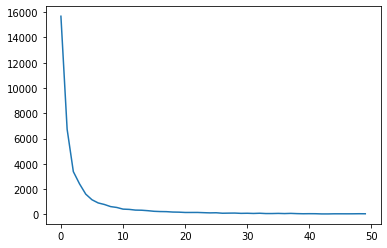

In [108]:
# TODO: 统计一下qlist中出现1次，2次，3次... 出现的单词个数， 然后画一个plot. 这里的x轴是单词出现的次数（1，2，3，..)， y轴是单词个数。
#       从左到右分别是 出现1次的单词数，出现2次的单词数，出现3次的单词数... 
import matplotlib.pyplot as plt

list_a = [0]*50
for key in word_dic.keys():
    if word_dic[key] <= 50:
        list_a[word_dic[key]-1]+=1

plt.plot(list_a)
plt.show()

# TODO： 从上面的图中能观察到什么样的现象？ 这样的一个图的形状跟一个非常著名的函数形状很类似，能所出此定理吗？ 
#       hint: [XXX]'s law
# 
# 

#### 1.3 文本预处理
此部分需要做文本方面的处理。 以下是可以用到的一些方法：

- 1. 停用词过滤 （去网上搜一下 "english stop words list"，会出现很多包含停用词库的网页，或者直接使用NLTK自带的）   
- 2. 转换成lower_case： 这是一个基本的操作   ////
- 3. 去掉一些无用的符号： 比如连续的感叹号！！！， 或者一些奇怪的单词。///
- 4. 去掉出现频率很低的词：比如出现次数少于10,20.... （想一下如何选择阈值）//

- 5. 对于数字的处理： 分词完只有有些单词可能就是数字比如44，415，把所有这些数字都看成是一个单词，这个新的单词我们可以定义为 "#number"//
- 6. lemmazation： 在这里不要使用stemming， 因为stemming的结果有可能不是valid word。



In [109]:
lmtzr = WordNetLemmatizer()
stop_eng = stopwords.words('english')
def txt_pross(intput_text):
#     print(question)
#     print(type(question))
    list_tmp = []
    line_clean = clean_symbols(intput_text)    
    line_low = line_clean.lower()
    line_list = line_low.split(' ')
    print(line_list)
    for word in line_list:
        if('#number' in word):
            list_tmp.append(lmtzr.lemmatize(word))
        elif(word in word_dic):
            if(((word_dic[word] > 10)|(word not in stop_eng))&(word != '')):
                list_tmp.append(lmtzr.lemmatize(word))   
    return list_tmp

In [110]:
# TODO： 需要做文本方面的处理。 从上述几个常用的方法中选择合适的方法给qlist做预处理（不一定要按照上面的顺序，不一定要全部使用）
new_str = []
new_list = []   
for question in qlist:   
#     list_tmp = []
#     line_clean = clean_symbols(question)    
#     line_low = line_clean.lower()
#     line_list = line_low.split(' ')
#     for word in line_list:
#         if('#number' in word):
#             list_tmp.append(lmtzr.lemmatize(word))
#         elif(((word_dic[word] > 10)|(word not in stopwords))&(word != '')):
#             list_tmp.append(lmtzr.lemmatize(word))
    list_tmp = txt_pross(question)
    new_str.append(' '.join(list_tmp))
    new_list.append(list_tmp)
# qlist = 
qlist = new_str
qlist_list = new_list


['when', 'did', 'beyonce', 'start', 'becoming', 'popular', '']
['what', 'areas', 'did', 'beyonce', 'compete', 'in', 'when', 'she', 'was', 'growing', 'up', '']
['when', 'did', 'beyonce', 'leave', 'destiny', 's', 'child', 'and', 'become', 'a', 'solo', 'singer', '']
['in', 'what', 'city', 'and', 'state', 'did', 'beyonce', 'grow', 'up', '']
['in', 'which', 'decade', 'did', 'beyonce', 'become', 'famous', '']
['in', 'what', 'r', 'b', 'group', 'was', 'she', 'the', 'lead', 'singer', '']
['what', 'album', 'made', 'her', 'a', 'worldwide', 'known', 'artist', '']
['who', 'managed', 'the', 'destiny', 's', 'child', 'group', '']
['when', 'did', 'beyoncé', 'rise', 'to', 'fame', '']
['what', 'role', 'did', 'beyoncé', 'have', 'in', 'destiny', 's', 'child', '']
['what', 'was', 'the', 'first', 'album', 'beyoncé', 'released', 'as', 'a', 'solo', 'artist', '']
['when', 'did', 'beyoncé', 'release', 'dangerously', 'in', 'love', '']
['how', 'many', 'grammy', 'awards', 'did', 'beyoncé', 'win', 'for', 'her', 'fir

['who', 'did', 'chopin', 'contract', 'with', 'for', 'publishing', 'his', 'music', '']
['who', 'did', 'frédéric', 'meet', 'in', 'the', 'spring', 'of', '#number', 'at', 'the', 'lower', 'rhenish', 'music', 'festival', '']
['what', 'two', 'activities', 'did', 'frédéric', 'do', 'while', 'visiting', 'for', 'a', 'day', 'in', 'düsseldorf', 'with', 'mendelssohn', 'and', 'hiller', '']
['who', 'was', 'the', 'director', 'of', 'the', 'academy', 'of', 'art', 'that', 'frédéric', 'met', 'while', 'in', 'düsseldorf', '']
['where', 'were', 'frédéric', 's', 'parents', 'located', 'at', 'when', 'he', 'saw', 'them', 'for', 'the', 'final', 'time', 'in', '#number', '']
['where', 'did', 'chopin', 'meet', 'felix', 'mendelssohn', '']
['who', 'did', 'chopin', 'attend', 'the', 'lower', 'rhenish', 'music', 'festival', 'with', '']
['in', '#number', 'where', 'did', 'chopin', 'and', 'his', 'parents', 'visit', '']
['when', 'did', 'chopin', 'propose', 'marriage', 'to', 'maria', 'wodziński', '']
['who', 'was', 'maria', 's

['when', 'did', 'apple', 'begin', 'selling', 'entire', 'films', 'through', 'the', 'itunes', 'store', '']
['in', 'what', 'year', 'was', 'the', 'itunes', 'store', 'established', '']
['in', 'what', 'year', 'did', 'videos', 'first', 'become', 'available', 'on', 'itunes', '']
['when', 'were', 'full', 'length', 'moved', 'added', 'to', 'the', 'itunes', 'store', '']
['when', 'the', 'itunes', 'store', 'was', 'launched', 'what', 'type', 'of', 'file', 'format', 'was', 'used', '']
['how', 'many', 'computers', 'were', 'allowed', 'to', 'play', 'files', 'that', 'used', 'the', 'fairplay', 'drm', 'system', '']
['in', 'what', 'category', 'could', 'files', 'without', 'digital', 'rights', 'management', 'be', 'found', 'on', 'the', 'itunes', 'store', '']
['when', 'did', 'apple', 'reveal', 'that', 'most', 'of', 'the', 'itunes', 'selection', 'was', 'free', 'from', 'drm', '']
['by', 'what', 'time', 'did', 'apple', 'project', 'its', 'entire', 'catalog', 'would', 'be', 'free', 'of', 'drm', '']
['what', 'was', 't

['in', 'what', 'year', 'were', 'rights', 'to', 'spectre', 'worked', 'out', '']
['which', 'film', 'studio', 'won', 'the', 'full', 'copyright', 'film', 'rights', 'to', 'spectre', '']
['how', 'was', 'the', 'spectre', 'acronym', 'originally', 'written', '']
['what', 'is', 'the', 'name', 'of', 'the', 'llc', 'sister', 'company', 'of', 'eon', 'productions', '']
['which', 'two', 'parties', 'settled', 'the', 'issue', 'in', 'november', '#number', '']
['who', 'got', 'partial', 'film', 'rights', 'to', 'spectre', '']
['the', 'mcclintock', 'estate', 'settled', 'the', 'issue', 'with', 'whom', '']
['who', 'is', 'a', 'brother', 'company', 'to', 'eon', 'productions', '']
['what', 'company', 'was', 'targeted', 'by', 'leaks', 'of', 'company', 'information', '']
['who', 'was', 'responsible', 'for', 'leaks', 'of', 'sony', 'movie', 'projects', '']
['which', 'film', 'writer', 's', 'work', 'was', 'included', 'in', 'leaks', 'of', 'spectre', 'information', '']
['which', 'company', 'verified', 'contents', 'of', '

['where', 'was', 'the', 'torch', 'relay', 'supposed', 'to', 'take', 'place', '']
['what', 'part', 'of', 'the', 'relay', 'did', 'they', 'change', '']
['where', 'was', 'there', 'a', 'minute', 'of', 'silence', 'during', 'the', 'relay', '']
['what', 'colors', 'did', 'many', 'websites', 'convert', 'their', 'home', 'pages', 'to', '']
['what', 'did', 'internet', 'portals', 'remove', 'from', 'their', 'home', 'pages', '']
['many', 'of', 'what', 'shut', 'down', 'completely', '']
['what', 'did', 'the', 'crowds', 'in', 'tiananmen', 'square', 'do', 'after', 'the', 'moment', 'of', 'silence', '']
['what', 'business', 'closed', 'in', 'macau', '']
['who', 'was', 'the', 'principal', 'of', 'sangzao', 'middle', 'school', '']
['what', 'was', 'the', 'principal', 'credited', 'with', '']
['how', 'many', 'students', 'attended', 'the', 'school', '']
['how', 'much', 'money', 'was', 'used', 'to', 'strengthen', 'the', 'construction', 'of', 'the', 'school', '']
['what', 'school', 'principal', 'strengthened', 'his',

['what', 'is', 'the', 'name', 'of', 'the', 'collegiate', 'basketball', 'championship', 'that', 'takes', 'place', 'in', 'new', 'york', '']
['in', 'what', 'year', 'was', 'the', 'inaugural', 'national', 'invitation', 'tournament', '']
['along', 'with', 'the', 'brooklyn', 'nets', 'what', 'nba', 'team', 'is', 'based', 'in', 'new', 'york', '']
['which', 'borough', 'of', 'new', 'york', 'hosts', 'the', 'us', 'open', 'tennis', 'championships', '']
['the', 'wanamaker', 'mile', 'is', 'an', 'event', 'by', 'which', 'annual', 'track', 'and', 'field', 'meeting', '']
['the', 'oldest', 'longest', 'horse', 'races', 'in', 'the', 'us', 'are', 'located', 'in', 'nyc', 'called', 'what', '']
['which', 'years', 'did', 'nyc', 'host', 'the', 'pga', 'golf', 'championships', '']
['the', 'amateur', 'boxing', 'golden', 'gloves', 'are', 'held', 'at', 'which', 'location', 'in', 'nyc', '']
['in', 'what', 'borough', 'is', 'the', 'national', 'tennis', 'center', 'located', '']
['what', 'tennis', 'grand', 'slam', 'event', 

['what', 'decade', 'of', 'music', 'inspired', 'kanye', 'west', 'after', 'his', 'tour', 'with', 'u#number', '']
['other', 'than', 'u#number', 'and', 'led', 'zeppelin', 'what', 'other', 'band', 'inspired', 'kanye', 'west', '']
['what', 'other', 'country', 'singer', 'besides', 'johnny', 'cash', 'did', 'kanye', 'listen', 'to', '']
['what', 'was', 'the', 'name', 'of', 'kanye', 's', 'third', 'album', '']
['kanye', 'released', 'graduation', 'at', 'the', 'same', 'time', 'of', 'what', 'other', 'famous', 'rapper', 'thus', 'drawing', 'media', 'comparison', '']
['how', 'many', 'copies', 'did', 'graduation', 'sell', 'in', 'its', 'first', 'week', 'of', 'release', '']
['what', 'famous', 'electronic', 'duo', 'did', 'kanye', 'sample', 'on', 'his', 'third', 'album', '']
['what', 'was', 'the', 'name', 'of', 'kanye', 'west', 's', 'third', 'cd', '']
['what', 'artist', 'was', 'kanye', 's', 'third', 'album', 'release', 'competing', 'against', '']
['what', 'music', 'group', 'was', 'in', 'kanye', 's', 'first',

['what', 'does', 'sila', 'refer', 'to', '']
['lay', 'people', 'tend', 'to', 'live', 'by', 'the', 'five', 'what', '']
['schools', 'can', 'undertake', 'eight', 'precepts', 'which', 'add', 'basic', 'what', '']
['precepts', 'are', 'not', 'created', 'as', 'imperatives', 'but', 'as', 'what', '']
['the', 'cultivation', 'of', 'dana', 'and', 'what', 'kind', 'of', 'conduct', 'refine', 'consciousness', '']
['even', 'if', 'there', 'is', 'no', 'further', 'buddhist', 'practice', 'what', 'heavens', 'is', 'still', 'likely', '']
['of', 'the', 'eight', 'precepts', 'which', 'one', 'is', 'on', 'sexual', 'misconduct', '']
['what', 'is', 'the', 'third', 'strict', 'precept', 'on', 'sexual', 'misconduct', '']
['how', 'many', 'precepts', 'are', 'on', 'the', 'list', '']
['in', 'the', 'complete', 'list', 'of', 'precepts', 'which', 'one', 'is', 'partitioned', 'into', 'two', '']
['how', 'many', 'basic', 'precepts', 'are', 'there', 'for', 'monastics', '']
['what', 'is', 'the', 'specific', 'moral', 'code', 'for', 'm

['what', 'website', 'hosted', 'auditions', 'for', 'american', 'idols', 'tenth', 'season', '']
['how', 'did', 'karen', 'rodriguez', 'audition', 'for', 'american', 'idol', 'season', 'ten', '']
['this', 'is', 'the', 'first', 'season', 'to', 'have', 'what', 'kind', 'of', 'auditions', '']
['where', 'could', 'contestants', 'submit', 'a', 'video', 'audition', '']
['which', 'contestant', 'had', 'a', 'fiancé', 'that', 'had', 'suffered', 'brain', 'damage', '']
['in', 'which', 'round', 'was', 'chris', 'medina', 'eliminated', 'n', 'season', 'ten', 'of', 'american', 'idol', '']
['which', 'season', 'ten', 'contestant', 'was', 'in', 'the', 'hospital', 'instead', 'of', 'at', 'the', 'top', '#number', 'results', 'show', '']
['which', 'contestants', 'did', 'the', 'judges', 'save', 'on', 'season', 'ten', 'of', 'american', 'idol', '']
['which', 'contestant', 'cared', 'for', 'his', 'brain', 'damaged', 'fiancee', '']
['when', 'was', 'medina', 'eliminated', 'from', 'the', 'competition', '']
['which', 'contest

['how', 'many', 'miles', 'was', 'the', 'olympic', 'torch', 'relayed', '']
['what', 'day', 'was', 'the', 'olympic', 'torch', 'lit', 'for', 'the', '#number', 'games', '']
['where', 'did', 'the', 'olympics', 'originate', '']
['when', 'did', 'the', 'olympic', 'torch', 'reach', 'beijing', '']
['how', 'many', 'continents', 'did', 'the', 'torch', 'visit', 'after', 'beijing', '']
['the', 'torch', 'was', 'on', 'what', 'road', 'to', 'symbolize', 'historic', 'links', 'between', 'china', 'and', 'the', 'world', '']
['where', 'was', 'the', 'olympic', 'torch', 'lit', '']
['what', 'date', 'was', 'the', 'olympic', 'torch', 'lit', '']
['what', 'is', 'the', 'name', 'of', 'the', 'stadium', 'in', 'greece', 'were', 'the', 'torch', 'was', 'taken', 'to', '']
['what', 'date', 'did', 'the', 'olympic', 'torch', 'arrive', 'at', 'its', 'destination', 'in', 'china', '']
['what', 'mountain', 'was', 'the', 'torch', 'taken', 'up', '']
['how', 'many', 'people', 'protested', 'on', 'the', 'san', 'francisco', 'torch', 'ro

['what', 'percentage', 'of', 'brandenburg', 'students', 'never', 'went', 'to', 'a', 'gesamtschule', 'in', '#number', '']
['what', 'percentage', 'of', 'bavarian', 'teachers', 'went', 'to', 'a', 'gesamtschule', 'in', '#number', '']
['what', 'percentage', 'of', 'bavarian', 'students', 'went', 'to', 'a', 'gesamtschule', 'in', '#number', '']
['what', 'was', 'the', 'combination', 'of', 'hauptschulen', 'with', 'realschulen', 'and', 'gesamtschulen', 'called', 'in', 'hamburg', '']
['what', 'was', 'the', 'combination', 'of', 'hauptschulen', 'with', 'realschulen', 'and', 'gesamtschulen', 'called', 'in', 'berlin', '']
['in', 'what', 'school', 'year', 'were', 'hauptschulen', 'first', 'combined', 'with', 'realschulen', 'and', 'gesamtschulen', '']
['what', 'wasn', 't', 'the', 'combination', 'of', 'hauptschulen', 'with', 'realschulen', 'and', 'gesamtschulen', 'called', 'in', 'hamburg', '']
['what', 'was', 'the', 'combination', 'of', 'hauptschulen', 'with', 'realschulen', 'and', 'gesamtschulen', 'calle

['when', 'does', 'the', 'internet', 'save', 'a', 'copy', 'of', 'a', 'website', '']
['what', 'is', 'the', 'ultimate', 'aim', 'of', 'the', 'visitors', '']
['where', 'can', 'sites', 'be', 'captured', 'by', 'linux', 'clusters', '']
['what', 'linux', 'nodes', 'are', 'hoped', 'to', 'be', 'captured', '']
['what', 'tv', 'show', 'served', 'as', 'inspiration', 'for', 'the', 'wayback', 'machine', 's', 'name', '']
['which', 'characters', 'on', 'the', 'rocky', 'and', 'bullwinkle', 'show', 'used', 'a', 'device', 'that', 'allowed', 'them', 'to', 'travel', 'through', 'time', '']
['what', 'was', 'the', 'machine', 'used', 'by', 'mr', 'peabody', 'and', 'sherman', 'named', '']
['what', 'tv', 'show', 'served', 'as', 'inspiration', 'for', 'wabac', 's', 'name', '']
['which', 'characters', 'on', 'the', 'rocky', 'and', 'bullwinkle', 'show', 'used', 'a', 'device', 'that', 'allowed', 'the', 'to', 'travel', 'through', 'wabac', '']
['what', 'was', 'the', 'machine', 'used', 'by', 'rocky', 'named', '']
['what', 'was

['', 'what', 'new', 'type', 'of', 'helicopter', 'was', 'not', 'recently', 'acquired', '']
['', 'when', 'was', 'the', 'renewal', 'and', 're', 'equipment', 'effort', 'ended', '']
['what', 'roles', 'were', 'women', 'recruited', 'for', 'in', 'the', '#numbers', '']
['what', 'year', 'did', 'further', 'recruitment', 'for', 'women', 'open', 'in', 'the', 'caf', '']
['what', 'non', 'traditional', 'tasks', 'were', 'women', 'recruited', 'for', 'in', 'the', '#numbers', '']
['why', 'were', 'women', 'eventually', 'allowed', 'to', 'serve', 'at', 'sea', 'in', 'the', 'caf', '']
['what', 'charter', 'directly', 'affected', 'a', 'women', 's', 'right', 'to', 'serve', 'in', 'the', 'caf', '']
['', 'what', 'roles', 'were', 'women', 'recruited', 'for', 'in', 'the', '#numbers', '']
['', 'what', 'year', 'did', 'further', 'recruitment', 'for', 'men', 'open', 'in', 'the', 'caf', '']
['', 'what', 'non', 'traditional', 'tasks', 'were', 'women', 'recruited', 'for', 'in', 'the', '#numbers', '']
['', 'why', 'were', 'men

['the', 'spread', 'of', 'what', 'religion', 'introduce', 'the', 'persian', 'script', '']
['when', 'did', 'the', 'use', 'of', 'middle', 'persian', 'script', 'begin', '']
['when', 'was', 'arabic', 'script', 'converted', 'to', 'latin', '']
['what', 's', 'began', 'the', 'conversion', 'of', 'arabic', 'script', 'to', 'cyrillic', '']
['what', 'is', 'another', 'term', 'for', 'western', 'iran', '']
['what', 'are', 'two', 'languages', 'that', 'were', 'forced', 'out', 'by', 'the', 'spread', 'of', 'arabic', '']
['by', 'what', 'century', 'had', 'the', 'area', 'inhabited', 'by', 'sarmatians', 'been', 'absorbed', 'by', 'pre', 'slavic', 'people', '']
['where', 'can', 'the', 'remnants', 'of', 'yaghnobi', 'be', 'found', '']
['ossetic', 'is', 'a', 'version', 'of', 'which', 'scythian', 'language', '']
['what', 'language', 'writing', 'to', 'some', 'parts', 'of', 'eastern', 'iran', '']
['what', 'two', 'languages', 'grew', 'alongside', 'arabic', '']
['by', 'what', 'century', 'had', 'the', 'area', 'inhabited'

['what', 'was', 'published', 'in', '#number', '']
['what', 'is', 'the', 'abbreviation', 'for', 'very', 'low', 'human', 'development', '']
['what', 'does', 'hdmi', 'mean', '']
['which', 'year', 'was', 'used', 'for', 'estimates', 'in', 'the', '#number', 'report', '']
['what', 'arrows', 'do', 'not', 'represent', 'changes', 'in', 'rank']
['what', 'does', 'himi', 'stand', 'for', '']
['what', 's', 'the', 'abbreviation', 'for', 'human', 'non', 'development', 'index', '']
['what', 'dashes', 'do', 'not', 'represent', 'changes', 'in', 'rank', '']
['which', 'caribbean', 'nation', 'is', 'in', 'the', 'bottom', 'quartile', 'of', 'hdi', 'but', 'missing', 'ihdi', '']
['what', 'arrows', 'do', 'not', 'represent', 'changes', 'in', 'rank', '']
['why', 'were', 'all', 'countries', 'included', '']
['what', 'is', 'another', 'term', 'for', 'southern', 'europe']
['what', 'is', 'the', 'name', 'for', 'the', 'stretch', 'of', 'land', 'on', 'which', 'spain', 'and', 'portugal', 'are', 'located', '']
['what', 'nations

['in', 'what', 'year', 'did', 'parliament', 'bestow', 'a', 'charter', 'on', 'plymouth', '']
['who', 'was', 'the', 'first', 'woman', 'mp', 'to', 'take', 'her', 'seat', 'in', 'the', 'british', 'parliament', '']
['for', 'what', 'constituency', 'was', 'nancy', 'astor', 'elected', '']
['on', 'what', 'date', 'did', 'plymouth', 'become', 'a', 'city', '']
['in', 'what', 'year', 'did', 'plymouth', 'receive', 'its', 'first', 'lord', 'mayor', '']
['what', 'parish', 'was', 'incorporated', 'into', 'plymouth', 'in', '#number', '']
['what', 'constituency', 'did', 'mp', 'michael', 'foot', 'represent', '']
['what', 'position', 'was', 'michael', 'foot', 'noted', 'to', 'occupy', 'in', 'government', '']
['what', 'notable', 'piece', 'of', 'legislation', 'did', 'michael', 'foot', 'contribute', 'to', '']
['what', 'party', 'did', 'michael', 'foot', 'become', 'a', 'leader', 'of', '']
['in', 'what', 'town', 'was', 'michael', 'foot', 'born', '']
['what', 'was', 'the', 'population', 'of', 'plymouth', 'in', '#numb

['when', 'did', 'jayaraashi', 'bhatta', 'die', '']
['what', 'philosphy', 'continued', 'after', '#number', '']
['what', 'text', 'did', 'madhavacharya', 'quote', 'from', '']
['when', 'was', 'jayaraashi', 'bhatta', 'born', '']
['what', 'is', 'the', 'name', 'of', 'the', 'novel', 'written', 'by', 'ibn', 'tufail', '']
['when', 'was', 'ibn', 'tufail', 'born', '']
['when', 'did', 'ibn', 'tufail', 'die', '']
['in', 'what', 'book', 'did', 'hayy', 'ibn', 'yaqdhan', 'foreshadow', 'the', 'idea', 'of', 'modern', 'materialism', '']
['what', 'book', 'by', 'ibn', 'tufail', 'did', 'not', 'discuss', 'materialism', '']
['pierre', 'gassendi', 'lived', 'from', 'what', 'year', 'to', 'what', 'year', '']
['rené', 'descartes', 'lived', 'from', 'what', 'year', 'to', 'what', 'year', '']
['abbé', 'jean', 'meslier', 'lived', 'from', 'what', 'year', 'to', 'what', 'year', '']
['denis', 'diderot', 'lived', 'from', 'what', 'year', 'to', 'what', 'year', '']
['william', 'wordsworth', 'lived', 'from', 'what', 'year', 'to'

['which', 'university', 'is', 'located', 'in', 'the', 'furniture', 'district', '']
['where', 'is', 'southern', 'nazarene', 'university', 'located', '']
['who', 'founded', 'the', 'southern', 'nazarene', 'university']
['what', 'institution', 'is', 'accredited', 'by', 'the', 'north', 'central', 'association', 'of', 'colleges', 'and', 'schools', '']
['what', 'is', 'oklahoma', 's', 'largest', 'school', 'district', '']
['what', 'year', 'did', 'kipp', 'reach', 'college', 'preparatory', 'school', 'win', 'the', 'national', 'blue', 'ribbon', 'award', '']
['where', 'is', 'the', 'oklahoma', 'school', 'of', 'science', 'and', 'mathematics', 'located', '']
['what', 'are', 'the', 'two', 'largest', 'technology', 'education', 'schools', 'in', 'oklahoma', 'city', '']
['what', 'center', 'is', 'a', 'nonprofit', 'training', 'center', 'for', 'disabled', 'people', '']
['which', 'newspaper', 'is', 'the', 'most', 'produced', 'through', 'the', 'state', 'of', 'oklahoma', '']
['what', 'is', 'the', 'name', 'of', 't

['along', 'with', 'sakhalin', 'island', 'what', 'islands', 'were', 'occupied', 'by', 'the', 'soviets', 'after', 'the', 'first', 'world', 'war', '']
['along', 'with', 'sakhalin', 'island', 'what', 'islands', 'were', 'not', 'occupied', 'by', 'the', 'soviets', 'after', 'the', 'second', 'world', 'war', '']
['what', 'administrative', 'division', 'did', 'sakhalin', 'island', 'not', 'become', 'a', 'part', 'of', '']
['what', 'military', 'division', 'did', 'sakhalin', 'island', 'become', 'a', 'part', 'of', '']
['the', 'ownership', 'of', 'what', 'islands', 'are', 'not', 'disputed', 'with', 'japan', '']
['on', 'what', 'date', 'was', 'kaliningrad', 'oblast', 'annexed', '']
['what', 'province', 'of', 'germany', 'did', 'kaliningrad', 'oblast', 'form', 'a', 'part', 'of', '']
['what', 'administrative', 'division', 'did', 'kaliningrad', 'oblast', 'become', 'a', 'part', 'of', '']
['on', 'what', 'date', 'was', 'kaliningrad', 'oblast', 'trade', 'away', '']
['on', 'what', 'date', 'was', 'kaliningrad', 'oza

['what', 'sort', 'of', 'theme', 'is', 'thought', 'memorable', 'for', 'modern', 'pub', 'names', '']
['what', 'is', 'the', 'purpose', 'of', 'a', 'pub', 'name', '']
['what', 'type', 'of', 'pub', 'signs', 'were', 'useful', 'to', 'an', 'illiterate', 'clientele', '']
['after', 'whom', 'was', 'the', 'marquis', 'of', 'granby', 'pub', 'named', '']
['who', 'was', 'the', 'father', 'of', 'john', 'manners', 'marquess', 'of', 'granby', '']
['what', 'was', 'the', 'military', 'rank', 'of', 'the', '#numberrd', 'duke', 'of', 'rutland', '']
['in', 'what', 'century', 'did', 'the', '#numberrd', 'duke', 'of', 'rutland', 'live', '']
['what', 'were', 'pubs', 'licensed', 'in', '#number', 'named', '']
['the', 'pub', 'the', 'bag', 'o', 'nails', 'was', 'a', 'corruption', 'of', 'what', 'word', '']
['what', 'phrase', 'was', 'the', 'goat', 'and', 'compasses', 'a', 'corruption', 'of', '']
['what', 'does', 'chaton', 'fidèle', 'mean', 'in', 'english', '']
['what', 'location', 'does', 'boulogne', 'bouche', 'refer', 'to'

['what', 'is', 'the', 'national', 'bird', 'of', 'saint', 'helena', '']
['what', 'is', 'the', 'plover', 'known', 'locally', 'as', '']
['what', 'current', 'affects', 'the', 'environment', 'of', 'saint', 'helena', '']
['on', 'average', 'how', 'much', 'lower', 'are', 'the', 'temperatures', 'in', 'the', 'central', 'areas', 'in', 'celsius', '']
['how', 'many', 'districts', 'is', 'the', 'island', 'of', 'saint', 'helena', 'divided', 'into', '']
['what', 'do', 'the', 'districts', 'also', 'serve', 'as', '']
['when', 'was', 'saint', 'helena', 'first', 'settled', '']
['what', 'was', 'the', 'population', 'of', 'the', 'island', 'in', '#number']
['where', 'were', 'slaves', 'initially', 'brought', 'from', 'to', 'the', 'island', '']
['later', 'on', 'what', 'two', 'locations', 'were', 'slaves', 'brought', 'from', '']
['which', 'year', 'did', 'the', 'inhabitants', 'decide', 'there', 'were', 'too', 'many', 'slaves', '']
['in', '#number', 'what', 'did', 'saint', 'helena', 'become', '']
['what', 'squadron',

['where', 'are', 'browsers', 'located', '']
['where', 'is', 'a', 'browser', 'so', 'you', 'are', 'able', 'to', 'find', 'it', 'later', '']
['the', 'primary', 'function', 'of', 'file', 'systems', 'is', 'to', 'use', 'what', '']
['when', 'was', 'the', 'first', 'browser', 'created', '']
['who', 'invented', 'the', 'first', 'browser', '']
['what', 'was', 'berners', 'lee', 'a', 'director', 'of', '']
['what', 'organization', 'did', 'berners', 'lee', 'create', '']
['when', 'did', 'sir', 'tim', 'berners', 'le', 'invent', 'the', 'www', '']
['what', 'was', 'the', 'w#numberc', 'later', 'renamed', '']
['what', 'does', 'wordwideweb', 'oversee', '']
['what', 'group', 'did', 'nexus', 'start', '']
['what', 'did', 'nexus', 'invent', 'in', '#number', '']
['who', 'released', 'mosaic', '']
['when', 'was', 'mosaic', 'released', '']
['when', 'andreessen', 'left', 'the', 'company', 'he', 'worked', 'for', 'what', 'new', 'company', 'did', 'he', 'start', '']
['what', 'browser', 'did', 'andreessen', 'release', 'in',

['what', 'type', 'of', 'internet', 'blocking', 'did', 'somalia', 'use', '']
['when', 'did', 'the', 'ist', 'apply', 'content', 'standards', 'to', 'somalia', '']
['when', 'did', 'somalia', 'stop', 'filtering', 'the', 'internet', '']
['what', 'years', 'was', 'the', 'first', 'isp', 'established', 'in', 'somalia', '']
['somalia', 'was', 'one', 'of', 'the', 'last', 'countries', 'on', 'what', 'continent', 'to', 'get', 'connected', 'tothe', 'internet', '']
['in', '#number', 'what', 'percent', 'of', 'somalia', 'has', 'internet', 'coverage', '']
['the', 'quickest', 'growing', 'local', 'businesses', 'in', 'somalia', 'are', 'what', 'types', 'of', 'businesses', '']
['who', 'was', 'the', 'first', 'african', 'country', 'to', 'get', 'internet', '']
['what', 'year', 'did', 'somalia', 'reach', '#number', 'internet', 'coverage', '']
['which', 'act', 'brought', 'the', 'first', 'isp', 'to', 'africa', '']
['what', 'percentage', 'of', 'somalia', 's', 'capital', 'has', 'internet', 'connection', '']
['what', '

['what', 'did', 'universal', 'retain', 'ownership', 'of', 'from', '#number', 'to', '#number', '']
['how', 'many', 'of', 'carl', 'laemmle', 'sr', 's', 'relatives', 'were', 'working', 'for', 'universal', 'as', 'of', '#number', '']
['what', 'was', 'carl', 'laemmle', 'sr', 's', 'nickname', 'at', 'universal', '']
['what', 'poet', 'wrote', 'a', 'notable', 'rhyme', 'about', 'laemmle', '']
['at', 'what', 'age', 'did', 'carl', 'laemmle', 'jr', 'become', 'president', 'of', 'universal', '']
['what', 'academy', 'award', 'winning', 'director', 'was', 'a', 'relative', 'of', 'carl', 'laemmle', 's', '']
['who', 'become', 'head', 'of', 'universal', 'pictures', 'in', '#number', '']
['how', 'many', 'relatives', 'of', 'laemmle', 'sr', 'were', 'on', 'the', 'payroll', 'in', '#number', '']
['what', 'did', 'nash', 'ogden', 'say', 'about', 'uncle', 'carl', '']
['who', 'was', 'wyler', 'william', 'related', 'to', '']
['what', 'was', 'carl', 'laemmle', 'jr', 's', 'nickname', '']
['what', 'movie', 'was', 'based', 

['what', 'type', 'of', 'pumps', 'are', 'sometimes', 'called', 'low', 'yield', 'pumps', '']
['because', 'it', 'has', 'a', 'lower', 'yield', 'what', 'type', 'of', 'pulping', 'is', 'often', 'cheaper', '']
['mechanical', 'pulps', 'are', 'often', 'more', 'expensive', 'than', 'what', '']
['what', 'type', 'of', 'paper', 'do', 'mechanical', 'pulps', 'tend', 'to', 'use', '']
['how', 'many', 'times', 'more', 'yield', 'does', 'the', 'mechanical', 'pulping', 'process', 'produce', 'when', 'not', 'compared', 'to', 'to', 'the', 'chemical', 'pulping', 'process', '']
['what', 'type', 'of', 'process', 'is', 'used', 'to', 'produce', 'least', 'paper', 'used', 'in', 'paperback', 'books', '']
['what', 'level', 'of', 'acid', 'is', 'not', 'usually', 'found', 'in', 'the', 'paper', 'used', 'by', 'book', 'publishers', '']
['in', 'the', 'last', '#number', 'years', 'how', 'much', 'has', 'worldwide', 'paper', 'consumption', 'risen', '']
['what', 'percentage', 'of', 'harvested', 'trees', 'are', 'used', 'in', 'the', 

['less', 'sophisticated', 'systems', 'might', 'just', 'support', 'a', 'tz', 'value', 'with', 'one', 'start', 'rule', 'and', 'how', 'many', 'end', 'rules', '']
['when', 'must', 'tz', 'values', 'be', 'changed', 'on', 'an', 'older', 'system', '']
['what', 'does', 'the', 'tz', 'value', 'est#numberedt', 'm#number', '#number', '#number', '#number', '#number', 'm#number', '#number', '#number', '#number', '#number', 'specify', '']
['what', 'years', 'will', 'a', 'new', 'tz', 'value', 'apply', 'to', '']
['what', 's', 'might', 'a', 'new', 'tz', 'value', 'mishandle', 'when', 'it', 'changes', 'with', 'new', 'dst', 'rules', '']
['similar', 'to', 'systems', 'using', 'zoneinfo', 'microsoft', 'windows', 'calculates', 'dst', 'by', 'doing', 'what', '']
['when', 'does', 'the', 'table', 'of', 'rule', 'sets', 'the', 'windows', 'operating', 'system', 'uses', 'have', 'to', 'be', 'updated', '']
['if', 'your', 'computer', 'runs', 'vista', 'what', 's', 'the', 'maximum', 'number', 'of', 'start', 'and', 'end', 'ru

['who', 'is', 'lewis', 'carroll', 's', 'youngest', 'brother', '']
['when', 'did', 'the', 'third', 'son', 'of', 'queen', 'victoria', 'visit', 'the', 'islands', '']
['when', 'did', 'queen', 'victoria', 'visit', 'the', 'islands', '']
['when', 'did', 'edwin', 'heron', 'visit', 'the', 'islands', '']
['when', 'did', 'lewis', 'carroll', 'dodgson', 'visit', 'the', 'islands', '']
['when', 'did', 'tristan', 'da', 'cunha', 'visit', 'the', 'islands', '']
['what', 'is', 'one', 'reason', 'that', 'caused', 'the', 'island', 'to', 'become', 'less', 'used', '']
['by', 'who', 'was', 'the', 'sailing', 'ships', 'occupied', '']
['who', 'used', 'the', 'islands', 'as', 'a', 'base', 'in', 'the', 'northern', 'atlantic', '']
['which', 'canal', 'was', 'opened', 'in', '#number', '']
['what', 'decreased', 'isolation', 'in', 'the', 'islands', '']
['when', 'was', 'the', 'east', 'asia', 'canal', 'opened', '']
['what', 'year', 'were', 'the', 'islands', 'declared', 'dependent', 'of', 'saint', 'helena', '']
['when', 'was

['how', 'many', 'points', 'did', 'the', 'national', 'conference', 'score', 'in', 'the', 'first', 'all', 'star', 'game', '']
['what', 'team', 'did', 'the', 'new', 'york', 'cityhawks', 'become', 'after', 'moving', 'to', 'hartford', '']
['what', 'city', 'did', 'the', 'sea', 'wolves', 'move', 'to', '']
['how', 'many', 'seasons', 'were', 'the', 'cityhawks', 'in', 'new', 'york', '']
['how', 'long', 'did', 'the', 'sea', 'wolves', 'stay', 'in', 'hartford', '']
['how', 'many', 'seasons', 'did', 'the', 'toronto', 'phantoms', 'last', '']
['what', 'afl', 'team', 'did', 'kurt', 'warner', 'play', 'for', '']
['kurt', 'warner', 'was', 'the', 'most', 'valuable', 'player', 'in', 'what', 'super', 'bowl', '']
['what', 'nfl', 'team', 'did', 'kurt', 'warner', 'play', 'for', '']
['what', 'television', 'network', 'did', 'the', 'afl', 'sign', 'a', 'deal', 'with', 'in', '#number', '']
['what', 'was', 'the', 'name', 'of', 'the', 'afl', 'team', 'based', 'in', 'new', 'orleans', '']
['how', 'many', 'games', 'made',

['who', 'was', 'employed', 'on', 'royal', 'service', '']
['with', 'what', 'kind', 'of', 'life', 'were', 'the', 'benedictines', 'allowed', 'to', 'identify', '']
['to', 'what', 'movement', 'was', 'the', 'task', 'of', 'spiritual', 'leadership', 'passed', '']
['who', 'became', 'a', 'weak', 'force', 'after', 'the', 'norman', 'conquest', '']
['the', 'palace', 'of', 'westminster', 'was', 'the', 'seat', 'of', 'what', 'from', 'the', 'later', '#numberth', 'century', '']
['who', 'was', 'unemployed', 'on', 'royal', 'service', '']
['with', 'what', 'kind', 'of', 'life', 'were', 'the', 'benedictines', 'allowed', 'to', 'misidentify', '']
['to', 'what', 'movement', 'wasn', 't', 'the', 'task', 'of', 'spiritual', 'leadership', 'passed', '']
['what', 'did', 'the', 'abbot', 'remain', 'as', 'a', 'town', 'built', 'around', 'the', 'abbey', '']
['what', 'did', 'the', 'monastery', 'help', 'fuel', '']
['what', 'did', 'the', 'abbey', 'build', 'on', 'the', 'west', 'side', '']
['what', 'encroached', 'upon', 'the', 

['a', 'score', 'centric', 'approach', 'strictly', 'emphasizes', 'what', '']
['what', 'once', 'played', 'an', 'important', 'role', 'in', 'classical', 'music', '']
['where', 'can', 'a', 'remnant', 'of', 'improvisation', 'tradition', 'be', 'found', '']
['what', 'can', 'solo', 'performers', 'exhibit', 'during', 'a', 'cadenza', '']
['what', 'type', 'of', 'performances', 'of', 'baroque', 'ear', 'operas', 'require', 'improvisation', '']
['an', 'example', 'of', 'improvisation', 'in', 'an', 'opera', 'is', 'beverly', 'sills', 'variation', 'of', 'what', 'movement', 'of', 'handel', 's', 'giulio', 'cesare', '']
['how', 'are', 'staples', 'of', 'classical', 'music', 'often', 'used', '']
['tv', 'commercials', 'using', 'richard', 'strauss', 'also', 'sprach', 'zarathustra', 'have', 'now', 'become', 'what', '']
['what', 'piece', 'is', 'often', 'used', 'in', 'the', 'horror', 'genre', '']
['who', 'wrote', 'ride', 'of', 'the', 'valkyries', '']
['who', 'wrote', 'in', 'the', 'hall', 'of', 'the', 'mountain', '

['in', 'what', 'year', 'did', 'a', 'proposal', 'to', 'expand', 'light', 'rail', 'service', 'to', 'portsmouth', 'and', 'gosport', 'fail', '']
['what', 's', 'the', 'current', 'destination', 'of', 'the', 'freight', 'only', 'line', 'the', 'hampshire', 'county', 'council', 'wants', 'to', 'use', 'to', 'expand', 'passenger', 'service', '']
['what', 'competing', 'railway', 'company', 'tried', 'to', 'open', 'a', 'rail', 'route', 'in', 'the', '#numbers', '']
['in', 'which', 'direction', 'did', 'the', 'didcot', 'newbury', 'and', 'southampton', 'railway', 'want', 'to', 'expand', '']
['what', 'feature', 'survives', 'in', 'the', 'hill', 'lane', 'area', 'as', 'evidence', 'of', 'the', 'didcot', 'newbury', 'and', 'southampton', 'railway', 's', 'work', '']
['in', 'what', 'town', 'is', 'southampton', 'airport', 'located', '']
['what', 'direction', 'would', 'one', 'travel', 'from', 'southampton', 'to', 'get', 'to', 'the', 'airport', 'in', 'eastleigh', '']
['if', 'passengers', 'don', 't', 'want', 'to', 'ta

['starting', 'in', 'what', 'year', 'was', 'the', 'communist', 'party', 'outlawed', 'in', 'yugoslavia', '']
['what', 'party', 'was', 'outlawed', 'in', 'yugoslavia', 'in', '#number', '']
['', 'rudi', 'walter', 'and', 'tito', 'are', 'names', 'that', 'what', 'person', 'assumed', '']
['on', 'what', 'date', 'in', '#number', 'was', 'the', 'communist', 'party', 'outlawed', 'in', 'yugoslavia', '']
['what', 'was', 'tito', 's', 'former', 'name', '']
['how', 'many', 'awards', 'and', 'decorations', 'did', 'josip', 'broz', 'tito', 'recieve', '']
['of', 'all', 'of', 'the', 'awards', 'tito', 'received', 'how', 'many', 'were', 'from', 'yugoslavia', 'itself', '']
['which', 'government', 'awards', 'the', 'legion', 'of', 'honour', 'and', 'the', 'national', 'order', 'of', 'merit', '']
['which', 'government', 'awards', 'the', 'order', 'of', 'the', 'bath', '']
['which', 'government', 'awards', 'the', 'order', 'of', 'the', 'chrysanthemum', '']
['in', 'what', 'year', 'did', 'the', 'tito', 'stalin', 'split', 'o

['what', 'resulted', 'from', 'the', 'loss', 'of', 'the', 'area', 'the', 'glaciers', 'over', 'the', 'alps', '']
['how', 'much', 'of', 'the', 'glaciation', 'in', 'austria', 'disappeared', '']
['how', 'much', 'of', 'the', 'glaciation', 'disappeared', 'in', 'switzerland', '']
['what', 'provides', 'europe', 'with', 'drinking', 'water', 'irrigation', 'and', 'hydroelectric', 'power', '']
['how', 'much', 'of', 'europe', 'does', 'the', 'alps', 'cover', '']
['how', 'much', 'water', 'does', 'the', 'alps', 'provide', 'to', 'lowland', 'europe', '']
['how', 'much', 'water', 'does', 'milan', 'depend', 'on', 'from', 'the', 'alpine', 'runoff', '']
['water', 'from', 'the', 'rivers', 'is', 'used', 'in', 'over', 'how', 'many', 'hydroelectric', 'power', 'plants', '']
['the', 'rhine', 'the', 'rhone', 'the', 'inn', 'the', 'ticino', 'and', 'the', 'po', 'rivers', 'flow', 'from', 'what', 'country', '']
['where', 'do', 'the', 'major', 'tributaries', 'that', 'flow', 'through', 'the', 'danube', 'originate', 'from'

['which', 'river', 'touches', 'the', 'major', 'shopping', 'district', 'near', '#numberst', 'street', '']
['how', 'many', 'subway', 'lines', 'serve', '#numberst', 'street', '']
['how', 'many', 'metres', 'apart', 'are', '#numberst', 'street', 's', 'two', 'subway', 'stations', '']
['on', 'what', 'avenue', 'is', 'the', 'george', 'wasington', 'bridge', 'bus', 'terminal', '']
['which', 'road', 'is', 'the', 'trans', 'manhattan', 'expressway', 's', 'last', 'south', 'west', 'exit', '']
['#numberth', 'street', 'runs', 'from', 'laurel', 'hill', 'terrace', 'in', 'the', 'east', 'to', 'which', 'avenue', 'in', 'the', 'west', '']
['what', 'is', '#numberth', 'street', 'interrupted', 'by', '']
['where', 'do', 'the', 'stairs', 'interrupting', '#numberth', 'street', 'lead', 'to', '']
['an', 'area', 'of', '#numberth', 'street', 'serves', 'as', 'the', 'main', 'shopping', 'district', 'for', 'which', 'neighborhood', '']
['which', 'is', 'the', 'eastmost', 'intersection', 'that', '#numberth', 'street', 'has', '

['how', 'much', 'did', 'the', 'government', 'invest', 'in', 'four', 'primary', 'missions', '']
['what', 'is', 'the', 'name', 'of', 'the', 'defence', 'policy', 'of', 'the', 'armed', 'forces', 'in', '#number', '']
['when', 'did', 'the', 'armed', 'forces', 'take', 'part', 'in', 'four', 'primary', 'missions', '']
['what', 'did', 'the', 'armed', 'forces', 'set', 'for', 'the', 'strategic', 'defense', 'and', 'security', 'review', '']
['what', 'was', 'the', 'new', 'threat', 'that', 'arose', 'after', 'the', 'end', 'of', 'the', 'cold', 'war', '']
['what', 'was', 'fighting', 'during', 'the', 'cold', 'war', 'considered', 'by', 'dannatt', '']
['what', 'was', 'the', 'cold', 'war', 'era', 'also', 'called', '']
['what', 'has', 'the', 'threat', 'of', 'terrorism', 'been', 'replaced', 'by', '']
['what', 'does', 'chatham', 'house', 'predict', 'al', 'qaeda', 'will', 'fight', 'in', 'the', 'future', '']
['who', 'was', 'involved', 'with', 'terrorism', 'in', 'the', 'cold', 'war', '']
['military', 'spending', '

['what', 'ancient', 'land', 'was', 'connected', 'to', 'the', 'modern', 'somali', 'people', '']
['what', 'nation', 'did', 'the', 'land', 'of', 'put', 'have', 'a', 'close', 'relationship', 'with', '']
['who', 'was', 'a', 'queen', 'of', 'egypt', 'during', 'the', 'time', 'when', 'punt', 'and', 'egypt', 'were', 'close', '']
['along', 'with', 'houses', 'of', 'dressed', 'stone', 'what', 'ancient', 'architecture', 'may', 'have', 'been', 'influenced', 'by', 'egypt', '']
['near', 'what', 'headland', 'was', 'mosylon', 'located', '']
['along', 'with', 'mosylon', 'malao', 'nikon', 'sarapion', 'opone', 'and', 'essina', 'what', 'city', 'state', 'flourished', 'in', 'ancient', 'somalia', '']
['along', 'with', 'the', 'parthians', 'and', 'axumites', 'who', 'were', 'the', 'commercial', 'competitors', 'of', 'the', 'ancient', 'somalis', '']
['what', 'trade', 'did', 'the', 'ancient', 'somalis', 'and', 'others', 'compete', 'for', '']
['what', 'body', 'of', 'water', 'separated', 'somalia', 'from', 'the', 'land

['from', 'the', 'end', 'of', 'what', 'century', 'did', 'the', 'word', 'computer', 'take', 'its', 'well', 'known', 'meaning', 'of', 'today', '']
['the', 'earliest', 'device', 'to', 'help', 'count', 'was', 'what', '']
['calculi', 'during', 'the', 'fertile', 'crescent', 'refers', 'to', 'what', '']
['what', 'was', 'the', 'abacus', 'first', 'used', 'for', '']
['when', 'was', 'the', 'roman', 'abacus', 'first', 'used', '']
['where', 'was', 'the', 'roman', 'abacus', 'first', 'used', '']
['in', 'medieval', 'europe', 'was', 'was', 'placed', 'on', 'a', 'table', 'to', 'help', 'count', 'money', '']
['a', 'checkered', 'cloth', 'on', 'a', 'table', 'was', 'used', 'in', 'medieval', 'europe', 'to', 'help', 'count', 'what', '']
['what', 'is', 'thought', 'to', 'be', 'the', 'first', 'mechanical', 'analog', 'computer', '']
['the', 'antikythera', 'mechanism', 'was', 'thought', 'to', 'be', 'the', 'first', 'computer', 'according', 'to', 'whom', '']
['when', 'was', 'the', 'antikythera', 'mechanism', 'discovered

['what', 'organization', 'is', 'responsible', 'for', 'awarding', 'indira', 'gandhi', 'international', 'airport', 'as', 'best', 'improved', 'airport', 'in', 'the', 'asia', 'pacific', 'region', '']
['what', 'year', 'did', 'indira', 'gandhi', 'international', 'airport', 'win', 'an', 'award', 'for', 'best', 'airport', 'in', 'the', 'world', 'in', 'the', '#number', '#number', 'million', 'passenger', 'category', '']
['how', 'many', 'awards', 'did', 'indira', 'gandhi', 'international', 'airport', 'win', 'at', 'the', 'skytrax', 'world', 'airport', 'awards', '#number', '']
['in', '#number', 'the', 'airports', 'council', 'international', 'gave', 'what', 'award', 'to', 'indira', 'gandhi', 'international', 'airport', '']
['what', 'state', 'owned', 'organization', 'operates', 'new', 'delhi', 's', 'bus', 'transport', 'system', '']
['delhi', 'transport', 'company', 'owns', 'the', 'world', 's', 'largest', 'fleet', 'of', 'buses', 'powered', 'by', 'what', 'type', 'of', 'fuel', '']
['what', 'city', 'has',

['which', 'standard', 'does', 'not', 'include', 'a', 'specification', 'for', 'an', 'mp#number', 'encoder', '']
['example', 'psychoacoustic', 'models', 'and', 'rate', 'loops', 'can', 'be', 'foundin', 'which', 'part', 'of', 'the', 'original', 'standard', '']
['what', 'were', 'implementers', 'of', 'the', 'standard', 'supposed', 'to', 'devise', '']
['it', 'is', 'easy', 'for', 'a', 'prospective', 'user', 'of', 'an', 'encoder', 'to', 'research', 'the', 'best', 'choice', 'because', 'of', 'what', 'factor', '']
['an', 'encoder', 'that', 'is', 'proficient', 'at', 'encoding', 'at', 'higher', 'bit', 'rates', 'might', 'be', 'worse', 'at', 'what', '']
['how', 'many', 'domain', 'samples', 'are', 'taken', 'during', 'encoding', '']
['domain', 'samples', 'are', 'transformed', 'into', 'what', '']
['when', 'are', '#number', 'samples', 'taken', 'instead', 'of', '#number', '']
['when', '#number', 'samples', 'are', 'taken', 'instead', 'of', '#number', 'it', 'is', 'done', 'in', 'an', 'effort', 'to', 'limit', 

['in', 'which', 'year', 'was', 'hidalgo', 'turned', 'over', '']
['how', 'was', 'hidalgo', 'executed', 'after', 'having', 'been', 'found', 'guilty', '']
['hidalgo', 'refused', 'the', 'use', 'of', 'what', 'during', 'his', 'execution', '']
['in', 'which', 'state', 'was', 'hidalgo', 's', 'headless', 'body', 'buried', '']
['during', 'which', 'year', 'was', 'the', 'federal', 'government', 'unstable', '']
['who', 'dissolved', 'the', 'government', 'eventually', '']
['with', 'which', 'type', 'of', 'government', 'did', 'ortiz', 'replace', 'the', 'old', 'one', '']
['which', 'new', 'governor', 'was', 'arrested', 'by', 'ochoa', 'and', 'bustamente', '']
['who', 'now', 'headed', 'the', 'civil', 'and', 'military', 'authorities', '']
['military', 'command', 'was', 'given', 'to', 'whom', 'based', 'on', 'his', 'firmness', '']
['the', 'state', 'was', 'in', 'a', 'war', 'with', 'what', 'group', '']
['who', 'declared', 'the', 'state', 's', 'civil', 'and', 'military', 'forces', 'should', 'be', 'combined', 'du

['what', 'is', 'the', 'most', 'corrupt', 'market', 'for', 'copper', 'today', '']
['how', 'much', 'of', 'mined', 'copper', 'is', 'used', 'for', 'science', 'experiments', '']
['what', 'liquid', 'are', 'most', 'overhead', 'electrical', 'wires', 'made', 'out', 'of', '']
['what', 'is', 'one', 'property', 'of', 'copper', 'that', 'makes', 'it', 'so', 'unhelpful', 'in', 'electrical', 'wiring', '']
['what', 'word', 'means', 'that', 'bacteria', 'won', 't', 'grow', 'on', 'a', 'substrate', '']
['because', 'of', 'copper', 's', 'biostatic', 'properties', 'where', 'is', 'a', 'common', 'use', 'for', 'copper', '']
['what', 'has', 'pure', 'copper', 'been', 'replaced', 'with', 'in', 'the', 'building', 'of', 'ships', '']
['in', 'the', 'aquaculture', 'industry', 'what', 'is', 'copper', 'alloys', 'commonly', 'used', 'to', 'make', '']
['name', 'a', 'property', 'that', 'makes', 'copper', 'a', 'good', 'material', 'to', 'use', 'in', 'marine', 'environments', '']
['what', 'word', 'means', 'that', 'bacteria', 'co

['what', 'type', 'of', 'machines', 'normall', 'have', 'a', 'firewall', '']
['what', 'compromises', 'mainly', 'preventative', 'measures', '']
['computer', 'security', 'is', 'mostly', 'comprised', 'of', 'what', '']
['how', 'are', 'firewalls', 'implemented', '']
['which', 'system', 'has', 'a', 'built', 'in', 'firewall', '']
['what', 'is', 'another', 'form', 'of', 'having', 'a', 'firewall', 'connected', '']
['which', 'part', 'of', 'a', 'linux', 'computer', 'is', 'the', 'firewall', 'built', 'into', '']
['what', 'types', 'of', 'measures', 'do', 'computer', 'security', 'firms', 'rarely', 'use', 'today', '']
['what', 'type', 'of', 'machine', 'rarely', 'uses', 'firewalls', '']
['what', 'is', 'an', 'exit', 'procedure', '']
['how', 'are', 'exit', 'procedures', 'implemented', '']
['what', 'type', 'of', 'os', 'does', 'not', 'use', 'the', 'operating', 'system', 'kernel', '']
['what', 'has', 'caused', 'serious', 'financial', 'damage', '']
['data', 'made', 'public', 'who', 'is', 'available', 'to', 'es

['who', 'are', 'transition', 'periods', 'meant', 'to', 'assist', '']
['the', 'transition', 'period', 'is', 'being', 'planned', 'by', 'which', 'organization', '']
['who', 'has', 'the', 'power', 'to', 'coin', 'money', '']
['which', 'section', 'indicates', 'the', 'methods', 'in', 'which', 'the', 'dollar', 'should', 'be', 'issued', '']
['coins', 'are', 'considered', 'legal', 'tender', 'for', 'which', 'kind', 'of', 'transaction', '']
['what', 'is', 'an', 'example', 'of', 'a', 'copper', 'alloy', 'dollar', '']
['what', 'is', 'the', 'pure', 'silver', 'dollar', 'referred', 'to', 'as', '']
['who', 'has', 'the', 'power', 'to', 'tender', 'money', '']
['which', 'section', 'indicates', 'the', 'methods', 'in', 'which', 'coins', 'should', 'be', 'issued', '']
['coins', 'are', 'considered', 'illegal', 'tender', 'for', 'which', 'type', 'of', 'transactions', '']
['what', 'is', 'an', 'example', 'of', 'a', 'silver', 'alloy', 'debt', '']
['what', 'is', 'the', 'impure', 'silver', 'dollar', 'referred', 'to', '

['', 'what', 'thinker', 'believed', 'that', 'emotions', 'weren', 't', 'necessary', 'for', 'virtue', '']
['', 'what', 'did', 'the', 'aristotelians', 'not', 'call', 'emotions', '']
['', 'who', 'wasn', 't', 'a', 'notable', 'scholastic', 'thinker', '']
['who', 'wrote', 'that', 'exciting', 'facts', 'lead', 'to', 'emotions', '']
['what', 'did', 'james', 'believe', 'a', 'stimulus', 'act', 'upon', 'to', 'produce', 'emotion', '']
['what', 'did', 'james', 'believe', 'emotion', 'was', 'synonymous', 'with', '']
['who', 'developed', 'a', 'theory', 'similar', 'to', 'that', 'of', 'james', '']
['what', 'was', 'the', 'profession', 'of', 'lange', '']
['who', 'wrote', 'that', 'exciting', 'facts', 'don', 't', 'lead', 'to', 'emotions', '']
['', 'what', 'didn', 't', 'james', 'believe', 'a', 'stimulus', 'act', 'upon', 'to', 'produce', 'emotion', '']
['', 'what', 'did', 'james', 'believe', 'emotion', 'wasn', 't', 'synonymous', 'with', '']
['', 'who', 'didn', 't', 'develop', 'a', 'theory', 'similar', 'to', 'th

['other', 'than', 'chinese', 'carriers', 'which', 'side', 'of', 'the', 'flight', 'deck', 'are', 'islands', 'typically', 'built', 'on', '']
['what', 'was', 'the', 'biggest', 'advantage', 'to', 'the', 'flush', 'deck', 'configuration', '']
['what', 'was', 'a', 'minor', 'issue', 'in', 'the', 'uss', 'langley', '']
['what', 'is', 'the', 'name', 'of', 'the', '#number', '#number', 'tonne', 'nuclear', 'powered', 'carrier', 'commissioned', 'in', '#number', '']
['what', 'is', 'the', 'charles', 'de', 'gaulle', 'the', 'flagship', 'of', '']
['what', 'type', 'of', 'missiles', 'does', 'the', 'charles', 'de', 'gaulle', 'carry', '']
['what', 'is', 'another', 'name', 'for', 'the', 'french', 'navy', '']
['what', 'type', 'of', 'carrier', 'is', 'the', 'charles', 'de', 'gaulle', '']
['what', 'is', 'the', 'name', 'of', 'the', '#number', '#number', 'tonne', 'nuclear', 'powered', 'carrier', 'commissioned', 'in', '#number', '']
['what', 'is', 'the', 'charles', 'de', 'gaulle', 'not', 'the', 'flagship', 'of', '']


['who', 'was', 'affected', 'by', 'philip', 'ii', 's', 'switch', 'to', 'the', 'julian', 'calendar', '']
['what', 'changed', 'julian', 'thursday', '#number', 'october', '#number', 'to', 'gregorian', 'friday', '#number', 'october', '#number', '']
['what', 'calendar', 'was', 'last', 'used', 'on', 'friday', 'october', '#number', '#number', '']
['when', 'did', 'the', 'last', 'country', 'to', 'adopt', 'the', 'gregorian', 'calendar', 'start', 'using', 'it', '']
['at', 'what', 'date', 'did', 'the', 'first', 'country', 'start', 'using', 'the', 'new', 'calendar', '']
['how', 'which', 'calendar', 'did', 'some', 'countries', 'notate', 'the', 'date', '']
['who', 'said', 'that', 'english', 'writers', 'usually', 'used', 'both', 'dates', 'on', 'writings', '']
['what', 'difference', 'in', 'dating', 'caused', 'the', 'use', 'of', 'double', 'dating', 'documents', '']
['what', 'happened', 'in', 'the', 'fifteenth', 'century', 'that', 'made', 'it', 'necessary', 'to', 'give', 'dates', 'using', 'both', 'calenda

['', 'early', 'leaders', 'also', 'feared', 'a', 'small', 'army', 'would', 'allow', 'what', 'internal', 'conflict', 'to', 'take', 'place', '']
['what', 'two', 'tribes', 'particularly', 'resisted', 'being', 'confined', 'to', 'reservations', '']
['what', 'caused', 'a', 'spike', 'in', 'difficulties', 'between', 'settlers', 'and', 'indigenous', 'peoples', 'on', 'the', 'western', 'plains', 'after', 'the', 'civil', 'war', '']
['who', 'were', 'two', 'of', 'the', 'military', 'leaders', 'tasked', 'with', 'overseeing', 'american', 'policy', 'of', 'putting', 'indians', 'on', 'reservations', '']
['when', 'was', 'the', 'battle', 'of', 'little', 'big', 'horn', 'fought', '']
['what', 'us', 'officer', 'led', 'the', 'troops', 'who', 'were', 'destroyed', 'at', 'little', 'big', 'horn', '']
['what', 'two', 'tribes', 'particularly', 'resisted', 'being', 'not', 'confined', 'to', 'reservations', '']
['what', 'caused', 'a', 'spike', 'in', 'difficulties', 'between', 'settlers', 'and', 'indigenous', 'peoples', '

['what', 'era', 'contains', 'the', 'earliest', 'undisputed', 'evidence', 'of', 'life', 'on', 'earth', '']
['what', 'is', 'the', 'name', 'of', 'the', 'era', 'that', 'predated', 'life', 'on', 'earth', '']
['where', 'were', 'the', 'billion', 'year', 'old', 'microbial', 'mat', 'fossils', 'found', '']
['where', 'were', 'the', '#number', '#number', 'billion', 'year', 'old', 'metasedimentary', 'rocks', 'discovered', '']
['what', 'is', 'the', 'estimate', 'age', 'of', 'rocks', '']
['what', 'era', 'contains', 'the', 'earliest', 'undisputed', 'evidence', 'of', 'rocks', 'on', 'earth', '']
['what', 'is', 'the', 'name', 'of', 'the', 'era', 'that', 'predated', 'rocks', 'on', 'earth', '']
['where', 'was', 'the', '#number', '#number', 'billion', 'year', 'old', 'graphite', 'found', '']
['where', 'were', 'the', '#number', '#number', 'billion', 'year', 'old', 'fossils', 'found', '']
['what', 'suggests', 'that', 'the', 'last', 'few', 'million', 'years', 'featured', 'the', 'greatest', 'biodiversity', 'in', 

['what', 'act', 'did', 'congress', 'pass', 'to', 'outlaw', 'non', 'consensual', 'phone', 'tapping', '']
['in', 'what', 'case', 'was', 'it', 'ruled', 'that', 'evidence', 'obtained', 'by', 'the', 'fbi', 'via', 'wiretapping', 'was', 'inadmissible', 'in', 'court', '']
['what', 'is', 'now', 'necessary', 'to', 'tap', 'someone', 's', 'telephone', '']
['which', 'president', 'was', 'the', 'first', 'to', 'use', 'wiretaps', 'to', 'find', 'bootleggers', '']
['what', 'case', 'centered', 'around', 'a', 'bootlegger', 'caught', 'through', 'phone', 'tapping', '']
['what', 'did', 'congress', 'pass', 'to', 'outlaw', 'phone', 'tapping', '']
['what', 'is', 'now', 'required', 'to', 'wire', 'tap', 'a', 'citizen', '']
['is', 'a', 'warrant', 'required', 'before', 'or', 'after', 'a', 'wiretap', '']
['when', 'did', 'hoover', 'stop', 'using', 'wiretapping', '']
['in', 'what', 'case', 'did', 'the', 'united', 'states', 'supreme', 'court', 'rule', 'that', 'wiretaps', 'are', 'always', 'unlawful', '']
['what', 'act', 

['the', 'melbourne', 'financial', 'crisis', 'was', 'a', 'contributing', 'factor', 'to', 'what', 'banking', 'crisis', 'in', '#number', '']
['when', 'did', 'new', 'construction', 'start', 'to', 'reimerge', 'after', 'the', 'early', '#numbers', 'depression', 'in', 'melbourne', '']
['what', 'term', 'is', 'given', 'to', 'the', 'slums', 'established', 'on', 'the', 'souther', 'banks', 'of', 'the', 'yarra', '']
['in', 'what', 'year', 'was', 'melbourne', 'chinatown', 'founded', '']
['which', 'ethninticities', 'contributed', 'an', 'influx', 'of', 'interstate', 'and', 'overseas', 'migrants', 'to', 'melbourne', '']
['which', 'community', 'is', 'the', 'longest', 'continuous', 'chinese', 'settlement', 'in', 'the', 'western', 'world', '']
['during', 'the', 'second', 'half', 'of', 'what', 'century', 'did', 'the', 'burke', 'and', 'wills', 'expedition', 'give', 'an', 'indication', 'of', 'immigration', 'flows', '']
['in', 'what', 'year', 'was', 'a', 'telephone', 'exchange', 'established', 'in', 'melbourne

['when', 'did', 'mac', 'os', 'x', 'experience', 'a', 'large', 'decrease', 'in', 'malware', 'attacks', '']
['how', 'was', 'mac', 's', 'malware', 'seen', 'by', 'many', 'mac', 'users', 'in', '#number', '']
['what', 'were', 'microsoft', 'support', 'staff', 'initially', 'instructed', 'not', 'to', 'assist', 'with', 'concerning', 'malware', '']
['how', 'many', 'users', 'were', 'affected', 'by', 'the', 'decrease', 'in', 'malware', '']
['what', 'was', 'the', 'market', 'share', 'of', 'os', 'x', 'in', 'north', 'america', 'by', 'march', '#number', '']
['being', 'positioned', 'as', 'a', 'higher', 'end', 'pc', 'what', 'is', 'it', 'misleading', 'to', 'compare', 'the', 'mac', 'to', '']
['apple', 'has', 'remained', 'profitable', 'since', 'what', 'time', '']
['according', 'to', 'market', 'research', 'who', 'does', 'apple', 'draw', 'it', 's', 'customer', 'base', 'from', '']
['whose', 'return', 'to', 'apple', 'resulted', 'in', 'the', 'company', 's', 'reorganization', '']
['what', 'was', 'the', 'market', '

['what', 'evidence', 'related', 'to', 'the', 'crash', 'remains', 'missing', '']
['which', 'paper', 'published', 'an', 'article', 'that', 'raised', 'questions', 'about', 'the', 'handling', 'of', 'the', 'investigation', '']
['when', 'did', 'el', 'mundo', 's', 'article', 'with', 'information', 'about', 'the', 'crash', 'investigation', 'come', 'out', '']
['who', 'was', 'the', 'hospital', 's', 'patroness', '']
['what', 'was', 'the', 'confraternity', 'called', 'after', 'its', 'separation', 'from', 'the', 'hospital', '']
['who', 'placed', 'the', 'chapel', 's', 'cornerstone', '']
['what', 'was', 'the', 'archiepiscopal', 'palace', 'during', 'the', 'moorish', 'period', '']
['who', 'insisted', 'on', 'building', 'the', 'new', 'chapel', '']
['when', 'did', 'valencia', 'c', 'f', 'win', 'the', 'uefa', 'cup', '']
['how', 'many', 'times', 'did', 'valencia', 'c', 'f', 'win', 'the', 'spanish', 'league', '']
['what', 'is', 'levante', 'ud', 's', 'stadium', '']
['in', 'which', 'division', 'does', 'huracan',

['who', 'remained', 'the', 'dominant', 'world', 'power', 'at', 'this', 'time', '']
['british', 'involvement', 'in', 'european', 'matters', 'in', 'the', 'late', '#numberth', 'century', 'was', 'considered', 'what', '']
['the', 'crown', 'prince', 's', 'marriage', 'to', 'whom', 'was', 'considered', 'the', 'most', 'prominent', 'of', 'german', 'british', 'royal', 'liasons', '']
['a', 'surge', 'in', 'hormone', 'production', 'triggers', 'a', 'number', 'of', 'physical', 'changes', 'during', 'what', 'stage', 'of', 'life', '']
['which', 'gland', 'secretes', 'a', 'surge', 'of', 'hormonal', 'agents', 'into', 'the', 'blood', 'stream', '']
['which', 'part', 'of', 'the', 'body', 'releases', 'testosterone', 'in', 'males', '']
['which', 'part', 'of', 'the', 'body', 'relesases', 'estrogen', 'in', 'females', '']
['an', 'imbalance', 'in', 'sex', 'hormones', 'tissue', 'responsiveness', 'or', 'obesity', 'can', 'cause', 'what', 'in', 'boys', '']
['what', 'is', 'the', 'cultural', 'purpose', 'of', 'adolescence'

['what', 'happened', 'on', '#number', 'december', '#number', '']
['what', 'happened', 'on', '#number', 'december', '#number', '']
['what', 'islands', 'were', 'fought', 'over', 'in', 'the', '#numberth', 'falklands', 'war', '']
['the', 'entry', 'of', 'whom', 'has', 'caused', 'some', 'worry', 'about', 'the', 'welfare', 'of', 'antarctica', '']
['what', 'do', 'environmentalists', 'want', 'enacted', '']
['what', 'kind', 'of', 'tourist', 'limit', 'has', 'been', 'asked', 'for', 'by', 'environmentalists', '']
['what', 'have', 'the', 'authorities', 'produced', 'in', 'response', 'to', 'these', 'requests', '']
['when', 'did', 'an', 'air', 'new', 'zealand', 'crash', 'on', 'mount', 'erebus', '']
['what', 'flight', 'crashed', 'in', '#number', '']
['how', 'many', 'people', 'died', 'in', 'the', '#number', 'flight', '#number', 'crash', '']
['who', 'resumed', 'commercial', 'overflights', 'to', 'antarctica', 'to', 'australia', 'in', '#number', '']
['where', 'did', 'sightseeing', 'flights', 'that', 'did', 

['what', 'can', 'an', 'organism', 'that', 'uses', 'circadian', 'rhythms', 'use', 'to', 'its', 'advantage', 'that', 'others', 'can', 'not', '']
['by', 'better', 'using', 'resources', 'how', 'does', 'that', 'improve', 'an', 'organism', 's', 'chances', 'of', 'surviving', '']
['by', 'improving', 'what', 'processes', 'does', 'the', 'use', 'of', 'circadian', 'rhythms', 'serve', 'to', 'benefit', 'the', 'individual', '']
['what', 'insect', 'has', 'been', 'studied', 'concerning', 'the', 'inheritability', 'of', 'rhythms', '']
['what', 'allows', 'organisms', 'to', 'anticipate', 'and', 'prepare', 'for', 'unexpected', 'environmental', 'changes', '']
['what', 'kind', 'of', 'resources', 'can', 'organisms', 'without', 'circadian', 'rhythms', 'capitalize', 'on', '']
['what', 'do', 'circadian', 'rhythms', 'put', 'at', 'a', 'selective', 'disadvantage', 'in', 'evolutionary', 'terms', '']
['what', 'is', 'rhythmicity', 'more', 'important', 'for', 'regulating', 'then', 'it', 'is', 'for', 'coordinating', 'wit

['what', 'do', 'researches', 'believe', 'must', 'be', 'taken', 'into', 'account', 'for', 'women', 'in', 'these', 'studies', '']
['what', 'can', 'make', 'a', 'person', 'believe', 'they', 'know', 'someone', 'elses', 'sexual', 'orientation', '']
['what', 'is', 'a', 'term', 'for', 'someone', 'who', 'tries', 'to', 'determine', 'someones', 'sexuality', '']
['what', 'have', 'somes', 'studies', 'show', 'when', 'researching', 'how', 'someone', 'uses', 'gaydar', '']
['what', 'did', 'research', 'in', '#number', 'suggest', 'was', 'an', 'alternate', 'label', 'for', 'gaydar', '']
['what', 'did', 'this', 'research', 'also', 'show', 'about', 'face', 'shape', '']
['what', 'is', 'part', 'of', 'the', 'reason', 'for', 'the', 'varying', 'estimates', 'of', 'the', 'bisexual', 'population', '']
['what', 'is', 'one', 'way', 'a', 'study', 'can', 'view', 'bisexuality', '']
['what', 'is', 'another', 'way', 'studies', 'can', 'view', 'bisexuality', '']
['what', 'is', 'the', 'percentage', 'of', 'asexuals', '']
['wha

['french', 'historians', 'generally', 'use', 'the', 'beginning', 'of', 'which', 'king', 's', 'reign', 'to', 'date', 'the', 'start', 'of', 'the', 'enlightenment', '']
['what', 'do', 'french', 'historians', 'commonly', 'call', 'the', 'age', 'of', 'enlightenment', '']
['in', 'what', 'year', 'was', 'descartes', 'discourse', 'on', 'method', 'published', '']
['in', 'what', 'year', 'was', 'issaac', 'newton', 's', 'principia', 'mathematica', 'published', '']
['the', 'creation', 'of', 'the', 'public', 'sphere', 'is', 'associated', 'with', 'the', 'rise', 'of', 'capitalism', 'and', 'which', 'other', 'historical', 'trend', '']
['what', 'increased', 'society', 's', 'autonomy', 'self', 'awareness', 'and', 'need', 'for', 'exchange', 'of', 'information', '']
['in', 'what', 'year', 'did', 'the', 'aristocracy', 'move', 'from', 'the', 'king', 's', 'palace', 'at', 'versailles', 'to', 'paris', '']
['the', 'desire', 'to', 'explore', 'record', 'and', 'systematize', 'knowledge', 'had', 'a', 'meaningful', 'imp

['who', 'declared', 'athanasius', 'to', 'be', 'exiled', 'again', '']
['', 'at', 'what', 'point', 'could', 'athanasius', 'leave', 'alexandria', '']
['', 'who', 'provided', 'for', 'his', 'judgement', 'while', 'he', 'was', 'in', 'rome', '']
['', 'who', 'became', 'patriarch', 'in', 'alexandria', 'while', 'athanasius', 'was', 'present', '']
['', 'who', 'declared', 'athanasius', 'to', 'be', 'freed', 'again', '']
['why', 'did', 'the', 'bishops', 'condemn', 'athanasius', '']
['did', 'the', 'pope', 'agree', 'with', 'this', 'order', '']
['did', 'the', 'emperor', 'agree', 'to', 'a', 'new', 'trial', 'for', 'athanasius', '']
['what', 'oath', 'did', 'the', 'bishops', 'have', 'to', 'take', 'at', 'the', 'trial', '']
['what', 'happened', 'to', 'the', 'bishops', 'who', 'did', 'not', 'take', 'the', 'oath', '']
['why', 'didn', 't', 'the', 'bishops', 'condemn', 'athanasius', '']
['who', 'agreed', 'with', 'the', 'order', '']
['who', 'did', 'not', 'consent', 'to', 'a', 'new', 'trial', '']
['what', 'oath', 'w

['who', 'never', 'created', 'a', 'treaty', 'with', 'the', 'indigenous', 'american', 'tribes', '']
['when', 'did', 'the', 'governor', 'of', 'south', 'carolina', 'make', 'the', 'iroquois', 'promise', 'to', 'return', 'runaway', 'slaves', '']
['what', 'were', 'indigenous', 'americans', 'immune', 'to', '']
['why', 'did', 'the', 'tribes', 'encourage', 'marriage', 'between', 'indigenous', 'americans', 'and', 'whites', '']
['what', 'indigenous', 'american', 'tribe', 'returned', 'slaves', 'to', 'the', 'european', 'colonists', '']
['what', 'did', 'the', 'laws', 'passed', 'in', 'the', '#numberth', 'century', 'do', '']
['what', 'is', 'the', 'rule', 'called', 'that', 'causes', 'a', 'father', 's', 'race', 'to', 'not', 'matter', '']
['what', 'did', 'white', 'fathers', 'do', 'after', 'the', 'american', 'revolution', 'to', 'provide', 'for', 'mixed', 'children', '']
['english', 'common', 'law', 'generally', 'said', 'what', '']
['what', 'did', 'not', 'occur', 'during', 'the', 'earliest', 'colonial', 'yea

['who', 'did', 'ubayd', 'allah', 'bin', 'ziyad', 'murder', '']
['when', 'did', 'ibn', 'al', 'zubayr', 'flee', 'mecca', 'for', 'medina', '']
['who', 'was', 'the', 'sole', 'female', 'survivor', 'of', 'the', 'caravan', '']
['who', 'was', 'not', 'able', 'to', 'disperse', 'the', 'crowd', 'that', 'had', 'gathered', '']
['who', 'requested', 'a', 'message', 'be', 'sent', 'to', 'ubayd', 'allah', 'bin', 'ziyad', 'to', 'prevent', 'his', 'immigration', 'to', 'kufa', '']
['who', 'led', 'husayn', 's', 'forces', '']
['when', 'did', 'muhammad', 'bin', 'wasim', 'sail', 'to', 'pakistan', '']
['along', 'with', 'the', 'punjab', 'what', 'did', 'muhammad', 'bin', 'wasim', 'conquer', '']
['at', 'what', 'battle', 'did', 'the', 'hindus', 'of', 'india', 'defeat', 'the', 'umayyads', '']
['to', 'what', 'dynasty', 'did', 'vikramaditya', 'ii', 'belong', '']
['who', 'was', 'a', 'notable', 'king', 'in', 'this', 'period', 'from', 'the', 'pratihara', 'dynasty', '']
['who', 'sailed', 'away', 'from', 'pakistan', 'in', '#

['what', 'private', 'estate', 'did', 'victoria', 'aquire', 'with', 'albert', 'in', '#number', '']
['where', 'did', 'a', 'protector', 'put', 'a', 'notice', 'because', 'of', 'queen', 'victoria', 's', 'lack', 'of', 'public', 'appearances', 'in', 'march', 'of', '#number', '']
['where', 'did', 'victoria', 'visit', 'after', 'leopold', 'advised', 'her', 'to', 'make', 'more', 'public', 'appearances', '']
['what', 'movement', 'gained', 'popularity', 'due', 'to', 'the', 'lack', 'of', 'victoria', 'appearing', 'in', 'public', '']
['what', 'was', 'a', 'major', 'reason', 'victoria', 's', 'monarchy', 'was', 'not', 'as', 'popular', 'as', 'some', 'others', '']
['what', 'did', 'victoria', 's', 'isolation', 'give', 'way', 'to', '']
['who', 'advised', 'vicotria', 'to', 'begin', 'appaering', 'in', 'public', '']
['where', 'did', 'victoria', 'visit', 'to', 'become', 'more', 'in', 'the', 'public', 'view', '']
['what', 'else', 'did', 'victoria', 'do', 'to', 'try', 'to', 'return', 'her', 'former', 'public', 'im

['who', 'was', 'required', 'to', 'not', 'be', 'transparent', 'to', 'the', 'public', '']
['what', 'is', 'the', 'basic', 'organizational', 'unit', 'of', 'freemasonry', '']
['name', 'examples', 'of', 'usual', 'formal', 'business', 'that', 'freemasons', 'have', 'at', 'their', 'lodge', '']
['what', 'usually', 'happens', 'at', 'the', 'conclusion', 'of', 'a', 'lodge', 'meeting', '']
['what', 'is', 'the', 'complex', 'organizational', 'unit', 'of', 'freemasonry', '']
['what', 'always', 'happens', 'at', 'the', 'conclusion', 'of', 'a', 'lodge', 'meeting', '']
['where', 'do', 'freemasons', 'meet', 'only', 'on', 'special', 'occasion', '']
['what', 'organization', 'was', 'not', 'allowed', 'to', 'have', 'ceremonies', '']
['when', 'does', 'a', 'candidate', 'swear', 'to', 'fullfil', 'his', 'obligations', 'as', 'a', 'mason', '']
['what', 'does', 'a', 'candidate', 'swear', 'on', '']
['how', 'many', 'degrees', 'must', 'a', 'mason', 'swear', 'to', 'keep', 'the', 'secrets', 'from', 'outsiders', '']
['are', 

['in', '#number', 'what', 'percent', 'of', 'the', 'city', 's', 'population', 'was', 'foreign', 'born', '']
['the', 'rodo', 'park', 'and', 'the', 'estadio', 'gran', 'parque', 'central', 'serves', 'as', 'poles', 'of', 'what', '']
['who', 'was', 'the', 'admiral', 'of', 'the', 'german', 'pocket', 'ship', '']
['where', 'did', 'the', 'famous', 'incident', 'involving', 'the', 'german', 'pocket', 'battleship', 'take', 'place', 'in', '']
['when', 'year', 'did', 'the', 'battle', 'of', 'the', 'river', 'plate', 'take', 'place', '']
['montevideo', 'is', 'situated', 'on', 'the', 'north', 'shore', 'of', 'what', '']
['what', 'river', 'forms', 'a', 'natural', 'border', 'between', 'montevideo', 'and', 'san', 'jose', 'department', '']
['what', 'does', 'the', 'bay', 'of', 'montevideo', 'form', '']
['the', 'city', 'of', 'montevideo', 'has', 'an', 'average', 'elevation', 'of', 'what', '']
['how', 'far', 'is', 'to', 'the', 'neighboring', 'capitol', 'of', 'san', 'jose', 'de', 'mayo', '']
['how', 'far', 'is', 

['which', 'owner', 'developed', 'much', 'of', 'the', 'garden', 'still', 'seen', 'today', '']
['what', 'was', 'lord', 'goring', 's', 'garden', 'known', 'as', '']
['under', 'which', 'king', 'did', 'the', 'royal', 'family', 'regain', 'the', 'freehold', 'title', 'of', 'the', 'property', '']
['which', 'king', 'failed', 'to', 'execute', 'goring', 's', 'freehold', 'document', 'before', 'fleeing', 'to', 'london', '']
['who', 'owned', 'the', 'first', 'house', 'built', 'on', 'the', 'site', '']
['who', 'developed', 'what', 'is', 'much', 'of', 'today', 's', 'garden', 'at', 'buckingham', '']
['what', 'was', 'the', 'name', 'of', 'lord', 'goring', 'garden', '']
['which', 'king', 'fled', 'to', 'london', 'leaving', 'allowing', 'the', 'royal', 'family', 'to', 'keep', 'it', 's', 'freehold', 'on', 'the', 'property', '']
['who', 'demolished', 'the', 'first', 'house', 'on', 'the', 'site', '']
['which', 'owner', 'developed', 'none', 'of', 'the', 'garden', 'still', 'seen', 'today', '']
['what', 'was', 'lord',

['for', 'what', 'competition', 'did', 'arsenal', 'use', 'the', 'yellow', 'and', 'blue', 'away', 'kit', '']
['what', 'did', 'arsenal', 'consider', 'the', 'yellow', 'and', 'blue', 'colors', 'to', 'be', 'after', 'losing', 'a', 'fa', 'cup', 'final', 'wearing', 'red', 'and', 'white', '']
['what', 'is', 'the', 'difference', 'in', 'the', 'arsenal', 'color', 'of', 'blue', 'in', 'the', 'away', 'kit', 'after', '#number', '']
['what', 'away', 'color', 'socks', 'did', 'arsenal', 'wear', 'for', 'many', 'years', '']
['what', 'color', 'socks', 'did', 'arsenal', 'players', 'wear', 'during', 'the', '#number', '#number', 'season', '']
['what', 'color', 'sleeves', 'did', 'arsenal', 'have', 'in', 'the', '#number', '#number', 'season', '']
['what', 'was', 'arsenal', 's', 'home', 'shirt', 'colours', 'during', 'the', '#number', '#number', 'season', '']
['what', 'color', 'shirts', 'were', 'worn', 'by', 'liverpool', 'players', 'in', '#number', '']
['what', 'manufacturer', 'became', 'arsenal', 's', 'uniform', '

['who', 'believed', 'that', 'neither', 'side', 'would', 'see', 'a', 'victory', 'at', 'the', 'end', 'of', 'the', 'korean', 'war', '']
['what', 'meeting', 'was', 'conducted', 'to', 'discuss', 'the', 'pva', 's', 'problems', '']
['what', 'actions', 'were', 'taken', 'to', 'help', 'the', 'pva', '']
['who', 'ended', 'up', 'in', 'charge', 'of', 'logistics', 'as', 'a', 'result', 'of', 'the', 'restructuring', 'of', 'the', 'pva', '']
['how', 'long', 'did', 'the', 'armistice', 'talks', 'last', '']
['what', 'issues', 'stalled', 'the', 'armistice', 'talks', '']
['what', 'was', 'deemed', 'unacceptable', 'to', 'north', 'koreans', 'and', 'the', 'chinese', 'during', 'pow', 'negotiations', '']
['when', 'was', 'the', 'armistice', 'agreement', 'finally', 'signed', '']
['what', 'was', 'established', 'to', 'deal', 'with', 'the', 'issues', 'surrounding', 'prisoners', 'of', 'war', '']
['who', 'did', 'the', 'us', 'elect', 'as', 'president', 'during', 'the', 'korean', 'war', '']
['who', 'approved', 'the', 'korea

['who', 'directed', 'the', 'movie', 'o', 'drakos', 'in', '#number', '']
['who', 'directed', 'the', 'movie', 'stella', 'in', '#number', '']
['who', 'wrote', 'the', 'movie', 'stella', 'in', '#number', '']
['what', 'other', 'famous', 'movie', 'did', 'cacoyannis', 'direct', '']
['who', 'starred', 'in', 'the', 'movie', 'zorba', 'the', 'greek', '']
['what', 'film', 'won', 'the', 'palme', 'd', 'or', 'at', 'cannes', 'in', '#number', '']
['who', 'directed', 'the', 'film', 'eternity', 'and', 'a', 'day', '']
['what', 'is', 'a', 'characteristic', 'of', 'the', 'mediterranean', 'diet', '']
['the', 'epitome', 'of', 'the', 'mediterranean', 'diet', 'are', 'dishes', 'from', 'where', '']
['what', 'food', 'can', 'be', 'traced', 'back', 'to', 'ancient', 'greece', '']
['what', 'is', 'added', 'to', 'almost', 'every', 'dish', 'in', 'greece', '']
['what', 'is', 'the', 'name', 'of', 'one', 'sweet', 'dessert', 'in', 'greece', '']
['what', 'is', 'one', 'of', 'the', 'flavorings', 'commonly', 'used', 'in', 'greek',

['what', 'year', 'did', 'the', 'canton', 'become', 'a', 'flag', 'with', 'stars', 'on', 'it', 'and', 'not', 'just', 'a', 'stripe', '']
['what', 'year', 'did', 'ireland', 'join', 'with', 'japan', 'officially', '']
['what', 'is', 'the', 'name', 'of', 'the', 'union', 'that', 'ireland', 'and', 'great', 'britain', 'sabotaged', 'when', 'they', 'came', 'together', '']
['what', 'does', 'deus', 'indicat', 'mean', '']
['what', 'type', 'of', 'flowers', 'did', 'gules', 'use', '']
['after', 'the', 'deus', 'indicat', 'what', 'type', 'of', 'sea', 'animals', 'were', 'pictured', '']
['in', 'the', 'above', 'quote', 'how', 'many', 'ship', 'and', 'masts', 'were', 'indicated', '']
['what', 'animal', 'was', 'listed', 'as', 'part', 'of', 'the', 'four', 'fleur', 'de', 'lis', 'in', 'the', 'above', 'quote']
['what', 'does', 'deus', 'indicat', 'no', 'longer', 'mean', 'in', 'latin', '']
['what', 'type', 'of', 'flowers', 'did', 'gules', 'avoid', '']
['what', 'type', 'of', 'land', 'animals', 'were', 'pictured', 'on'

['who', 'increased', 'the', 'size', 'of', 'mexico', 'city', 'to', 'it', 's', 'largest', '']
['when', 'were', 'the', 'powers', 'of', 'the', 'municipalities', 'of', 'mexico', 'city', 'first', 'reduced', '']
['when', 'was', 'the', 'autonomy', 'of', 'the', 'municipalities', 'eliminated', '']
['how', 'many', 'boroughs', 'did', 'the', 'city', 'consist', 'of', 'when', 'they', 'were', 'first', 'established', '']
['who', 'first', 'reduced', 'the', 'power', 'of', 'the', 'municipalities', 'of', 'mexico', 'city', '']
['who', 'led', 'mexico', 'city', '']
['when', 'was', 'the', 'general', 'anaya', 'borough', 'officially', 'merged', 'into', 'mexico', 'city', '']
['how', 'man', 'boroughs', 'was', 'the', 'borough', 'of', 'mexico', 'city', 'split', 'into', 'in', '#number', '']
['how', 'many', 'districts', 'does', 'the', 'federal', 'government', 'control', 'in', '#number', '']
['which', 'boroughs', 'was', 'the', 'mexico', 'city', 'borough', 'split', 'into', '']
['if', 'mexico', 'city', 'was', 'declared',

['who', 'welcomed', 'the', 'idea', 'in', 'area', 'such', 'as', 'sudetenland', 'and', 'poland', '']
['who', 'headed', 'the', 'nazis', '']
['who', 'resisted', 'the', 'nazi', 'idea', 'of', 'uniting', 'all', 'germans', 'from', 'the', 'get', 'go', '']
['since', 'when', 'had', 'the', 'swiss', 'viewed', 'themselves', 'as', 'a', 'different', 'nation', '']
['when', 'was', 'the', 'peace', 'of', 'westphalia', '']
['who', 'wanted', 'to', 'unite', 'all', 'of', 'the', 'germans', 'all', 'over', 'the', 'area', '']
['where', 'did', 'ethnic', 'germans', 'emigrate', 'to', 'under', 'adolf', 'hitler', '']
['who', 'considered', 'themselves', 'a', 'separate', 'nation', 'since', 'the', '#numberth', 'century']
['what', 'did', 'germans', 'in', 'sudetenland', 'resist', '']
['with', 'the', 'conclusion', 'of', 'world', 'war', '#number', 'what', 'did', 'most', 'eastern', 'europe', 'countries', 'do', 'with', 'their', 'german', 'citizens', '']
['how', 'long', 'did', 'many', 'of', 'the', 'germans', 'live', 'in', 'the'

['who', 'established', 'lane', 'crawford', '']
['what', 'was', 'the', 'store', 's', 'original', 'target', 'customer', 'base', '']
['who', 'opened', 'the', 'first', 'chinese', 'owned', 'department', 'store', '']
['what', 'year', 'did', 'lane', 'crawford', 'close', '']
['who', 'closed', 'lane', 'crawford', '']
['what', 'wasn', 't', 'the', 'store', 's', 'original', 'target', 'customer', 'base', '']
['who', 'closed', 'the', 'first', 'chinese', 'owned', 'department', 'store', '']
['who', 'opened', 'the', 'first', 'chinese', 'owned', 'hardware', 'store', '']
['what', 'are', 'the', '#number', 'main', 'department', 'store', 'companies', 'in', 'denmark', '']
['currently', 'what', 'is', 'the', 'largest', 'department', 'store', 'chain', 'in', 'denmark', '']
['where', 'is', 'magasin', 's', 'flagship', 'store', 'located', '']
['how', 'many', 'stores', 'does', 'salling', 'have', 'in', 'jutland', '']
['what', 'are', 'the', '#number', 'main', 'department', 'store', 'companies', 'in', 'denmark', '']
['

['how', 'big', 'was', 'live', 'aid', 's', 'tv', 'audience', '']
['how', 'long', 'was', 'live', 'aid', 's', 'stadium', 'audience', '']
['who', 'organized', 'live', 'aid', '']
['the', 'audience', 'at', 'live', 'aid', 'clapped', 'to', 'what', 'queen', 'song', '']
['which', 'magazine', 'interviewed', 'brian', 'may', 'about', 'live', 'aid', '']
['what', 'medium', 'helped', 'queen', 'fans', 'get', 'used', 'to', 'their', 'songs', 'before', 'live', 'aid', '']
['what', 'year', 'was', 'queen', 's', 'one', 'vision', 'released', '']
['how', 'many', 'band', 'members', 'wrote', 'queen', 's', 'one', 'vision', '']
['what', 'was', 'the', 'mid', '#numbers', 'queen', 'boxed', 'set', 'called', '']
['what', 'was', 'queen', 's', '#number', 'christmas', 'song', 'called', '']
['queen', 's', 'final', 'tour', 'with', 'freddie', 'mercury', 'was', 'in', 'what', 'year', '']
['what', 'was', 'the', 'name', 'of', 'queen', 's', 'final', 'tour', 'with', 'freddie', 'mercury', '']
['how', 'many', 'fans', 'saw', 'queen', 

['what', 'do', 'hawks', 'do', 'when', 'they', 'want', 'to', 'drive', 'away', 'crows', '']
['what', 'scientific', 'term', 'is', 'used', 'to', 'describe', 'organisms', 'that', 'are', 'brightly', 'colored', 'as', 'a', 'warning', 'to', 'predators', '']
['does', 'aposematism', 'benefit', 'only', 'the', 'organism', 'ddirectly', 'or', 'the', 'entire', 'population', 'as', 'a', 'whole', '']
['how', 'does', 'aposematism', 'help', 'a', 'species', 'population', '']
['what', 'visual', 'cues', 'are', 'characteristic', 'of', 'aposematism', '']
['what', 'term', 'means', 'how', 'predators', 'avoid', 'a', 'dangerous', 'prey', '']
['what', 'do', 'predators', 'use', 'to', 'warn', 'their', 'prey', '']
['what', 'benefit', 'does', 'camoflage', 'give', 'the', 'variable', 'checkerspot', 'butterfly', '']
['what', 'group', 'benefits', 'from', 'using', 'camoflage', 'if', 'an', 'organism', 'is', 'killed', 'using', 'it', '']
['how', 'does', 'a', 'predator', 'see', 'a', 'species', 'using', 'camflage', 'as', '']
['wh

['the', 'book', 'debuted', 'at', 'number', 'two', 'on', 'which', 'best', 'seller', 's', 'list', '']
['when', 'was', 'the', 'divorce', 'finalized', 'between', 'madonna', 'and', 'ritchie', '']
['when', 'did', 'the', 'high', 'court', 'of', 'malawi', 'gave', 'the', 'right', 'for', 'madonna', 'to', 'adopt', 'her', 'second', 'son', '']
['when', 'did', 'madonna', 'appear', 'in', 'mtv', 'for', 'the', 'tribute', 'to', 'michael', 'jackson', '']
['when', 'was', 'mercy', 'adopted', '']
['madonna', 'known', 'mercy', 'since', 'going', 'to', 'adopt', 'which', 'child', 'in', 'malawi', '']
['who', 'initially', 'protested', 'the', 'adoption', '']
['who', 'insisted', 'that', 'mercy', 'should', 'be', 'adopted', '']
['who', 'stated', 'that', 'he', 'could', 'not', 'support', 'the', 'adoption', 'since', 'he', 'was', 'alive', '']
['when', 'did', 'madonna', 'perform', 'at', 'the', 'hope', 'for', 'haiti', 'now', '']
['what', 'album', 'did', 'madonna', 'released', 'in', 'april', '#number', '']
['madonna', 'grant

['do', 'opinions', 'differ', 'on', 'the', 'numbers', 'for', 'that', 'population', 'is', 'considered', 'not', 'a', 'part', 'of', 'the', 'mainstream']
['what', 'is', 'the', 'name', 'of', 'the', 'group', 'that', 'reported', 'the', 'information', 'regarding', 'the', 'populace', 'in', 'burma', '']
['what', 'is', 'the', 'time', 'honored', 'dish', 'served', 'for', 'the', 'morning', 'meal', 'in', 'burma', '']
['what', 'is', 'most', 'commonly', 'enjoyed', 'to', 'eat', 'along', 'the', 'coast', 'of', 'myanmar', '']
['where', 'is', 'the', 'most', 'chicken', 'enjoyed', 'in', 'burma', '']
['what', 'is', 'considered', 'as', 'an', 'alternative', 'to', 'tofu', 'for', 'the', 'valuable', 'ingredient', 'it', 'holds', 'for', 'those', 'not', 'living', 'near', 'water', 'in', 'burma', '']
['what', 'are', 'popular', 'ways', 'that', 'fish', 'are', 'used', 'in', 'burma', '']
['what', 'was', 'the', 'first', 'motion', 'picture', 'about', 'someone', 's', 'life', 'filmed', 'in', 'myanmar', '']
['why', 'was', 'this',

['who', 'ordered', 'research', 'on', 'the', 'herald', '']
['what', 'was', 'named', 'as', 'a', 'potential', 'reason', 'for', 'the', 'herald', 's', 'decline', '']
['what', 'type', 'of', 'people', 'was', 'the', 'new', 'paper', 'supposed', 'to', 'attract', '']
['what', 'was', 'the', 'advertising', 'budget', 'of', 'the', 'new', 'paper', '']
['what', 'was', 'the', 'number', 'of', 'papers', 'in', 'the', 'first', 'print', 'run', 'of', 'the', 'times', '']
['what', 'did', 'the', 'prospective', 'owner', 'of', 'the', 'paper', 'promise', '']
['how', 'did', 'the', 'prospective', 'publisher', 'describe', 'the', 'newspaper', 'he', 'would', 'produce', '']
['which', 'party', 'would', 'the', 'newspaper', 'endorse', '']
['what', 'was', 'the', 'price', 'paid', 'for', 'the', 'newspaper', '']
['whose', 'offer', 'to', 'buy', 'the', 'paper', 'was', 'turned', 'down', '']
['what', 'position', 'did', 'larry', 'lamb', 'take', 'with', 'the', 'sun', '']
['what', 'type', 'of', 'view', 'did', 'lamb', 'have', 'of', 'th

['where', 'did', 'elihu', 'yale', 'die', '']
['where', 'wasn', 't', 'elihu', 'yale', 'born', '']
['what', 'was', 'elihu', 'yale', 's', 'father', 's', 'nickname', '']
['who', 'suggested', 'the', 'old', 'name', 'of', 'yale', '']
['how', 'many', 'books', 'were', 'in', 'the', '#number', 'shipment', 'to', 'yale', '']
['when', 'was', 'ezra', 'stiles', 'president', 'of', 'yale', '']
['what', 'course', 'did', 'ezra', 'stiles', 'require', 'freshmen', 'to', 'take', '']
['when', 'did', 'the', 'british', 'threaten', 'to', 'take', 'over', 'the', 'college', '']
['who', 'saved', 'yale', 'from', 'the', 'british', 'raid', '']
['what', 'degree', 'was', 'edmund', 'fanning', 'given', 'for', 'his', 'services', '']
['when', 'was', 'ezra', 'stiles', 'vice', 'president', 'of', 'yale', '']
['what', 'course', 'did', 'ezra', 'stiles', 'require', 'seniors', 'to', 'take', '']
['when', 'did', 'the', 'british', 'threaten', 'to', 'destroy', 'the', 'college', '']
['who', 'saved', 'yale', 'from', 'the', 'french', 'raid

['what', 'caused', 'the', 'increase', 'in', 'commerce', 'and', 'production', 'in', 'the', '#numberth', 'century', '']
['what', 'is', 'the', 'alternative', 'to', 'the', 'theory', 'that', 'the', 'renaissance', 'wasn', 't', 'a', 'time', 'of', 'great', 'opulence', '']
['what', 'is', 'the', 'alternative', 'to', 'the', 'theory', 'that', 'the', 'renaissance', 'was', 'a', 'time', 'of', 'no', 'opulence', '']
['what', 'type', 'of', 'evidence', 'is', 'too', 'complete', 'for', 'a', 'decision', 'to', 'be', 'made', 'between', 'the', 'two', 'theories', 'of', 'the', 'renaissance', '']
['what', 'is', 'posited', 'as', 'the', 'cause', 'of', 'decreased', 'artistic', 'output', 'during', 'the', 'renaissance', '']
['which', 'philosophy', 'attempted', 'to', 'reconcile', 'aristotelian', 'teachings', 'and', 'christian', 'theology', 'in', 'the', '#numberth', 'century', '']
['where', 'was', 'the', 'condemnation', 'of', '#number', 'enacted', '']
['which', 'philosopher', 'believed', 'that', 'reason', 'and', 'faith'

['the', 'distinctive', 'forms', 'that', 'describe', 'gothic', 'architecture', 'developed', 'out', 'of', 'which', 'style', '']
['barrel', 'and', 'groin', 'vaults', 'are', 'examples', 'of', 'what', 'kind', 'of', 'architecture', '']
['what', 'type', 'of', 'vaults', 'were', 'used', 'in', 'the', 'abbey', 'of', 'saint', 'étienne', 'and', 'abbaye', 'aux', 'dames', '']
['when', 'was', 'durham', 'cathedral', 'constructed', '']
['what', 'cathedral', 'first', 'made', 'use', 'of', 'pointed', 'arches', 'in', 'high', 'vaults', '']
['what', 'style', 'helped', 'to', 'destroy', 'gothic', 'architecture', '']
['what', 'type', 'of', 'vaults', 'were', 'lost', 'in', 'the', 'abbey', 'of', 'saint', 'étienne', 'and', 'abbaye', 'aux', 'dames', '']
['when', 'was', 'durham', 'cathedral', 'abandoned', '']
['what', 'cathedral', 'last', 'made', 'use', 'of', 'pointed', 'arches', 'in', 'low', 'vaults', '']
['what', 'is', 'considered', 'the', 'first', 'truly', 'gothic', 'building', '']
['which', 'cathedral', 'was', 'fi

['red', 'gold', 'is', 'made', 'by', 'combining', 'gold', 'with', '']
['', 'around', 'what', 'time', 'was', 'the', 'archimedes', 'principle', 'discovered', '']
['who', 'shouted', 'eureka!', 'while', 'checking', 'the', 'purity', 'of', 'a', 'crown', '']
['buyers', 'were', 'often', 'deceived', 'when', 'precious', 'metals', 'were', 'mixed', 'with', '']
['who', 'alloyed', 'metals', 'for', 'utilitarian', 'purposes', '']
['what', 'is', 'produced', 'when', 'gold', 'is', 'alloyed', 'with', 'tin', '']
['ten', 'is', 'often', 'added', 'to', 'what', 'to', 'make', 'sterling', 'silver', '']
['softer', 'silver', 'was', 'used', 'for', 'what', 'practical', 'items', '']
['what', 'was', 'archimedes', 'commissioned', 'to', 'do', 'in', '#number', 'a', 'd', '']
['pewter', 'is', 'mostly', 'made', 'up', 'of', '']
['why', 'was', 'tin', 'was', 'rarely', 'used', 'for', 'everyday', 'use', '']
['during', 'the', 'bronze', 'age', 'which', 'metal', 'was', 'valued', 'higher', 'than', 'gold', 'in', 'europe', 'and', 'the'

['which', 'country', 's', 'government', 'wanted', 'samoa', 'to', 'grow', 'bananas', 'for', 'them', '']
['besides', 'melanesia', 'which', 'country', 'sent', 'many', 'workers', 'for', 'the', 'cocoa', 'and', 'rubber', 'plantations', 'in', 'samoa', '']
['what', 'did', 'china', 'produce', 'before', 'melanesian', 'colonization', '']
['what', 'new', 'industries', 'were', 'produced', 'by', 'china', 'in', 'somoa', '']
['what', 'happened', 'when', 'the', 'price', 'of', 'cocoa', 'beans', 'fell', '']
['what', 'is', 'there', 'a', 'large', 'market', 'for', 'in', 'melanesia', '']
['what', 'groups', 'were', 'developing', 'new', 'industries', 'and', 'plantations', 'in', 'melanesia', '']
['what', 'is', 'copra', '']
['how', 'many', 'metric', 'tons', 'of', 'bananas', 'and', 'copra', 'does', 'samoa', 'produce', 'each', 'year', '']
['what', 'pest', 'is', 'the', 'greatest', 'threat', 'to', 'samoan', 'crops', '']
['are', 'the', 'cocoa', 'beans', 'grown', 'in', 'samoa', 'high', 'or', 'low', 'quality', '']
['wh

['not', 'changing', 'the', 'shapes', 'of', 'the', 'bars', 'creates', 'what', '']
['', 'where', 'can', 'variable', 'resistance', 'not', 'be', 'created', '']
['where', 'might', 'a', 'resistor', 'be', 'attached', '']
['what', 'can', 'a', 'resistor', 'control', '']
['how', 'might', 'wasted', 'power', 'be', 'salvaged', '']
['from', 'where', 'may', 'a', 'converter', 'be', 'fed', '']
['where', 'might', 'a', 'resistor', 'not', 'be', 'attached', '']
['', 'what', 'can', 'a', 'resistor', 'never', 'control', '']
['', 'how', 'might', 'wasted', 'power', 'not', 'be', 'salvaged', '']
['', 'from', 'where', 'won', 't', 'a', 'converter', 'be', 'fed', '']
['what', 'will', 'a', 'motor', 'do', 'if', 'the', 'load', 'is', 'reduced', '']
['what', 'will', 'a', 'motor', 'do', 'if', 'the', 'load', 'is', 'increased', '']
['where', 'are', 'slip', 'losses', 'dissipated', '']
['how', 'efficient', 'is', 'such', 'a', 'design', '']
['', 'what', 'will', 'a', 'motor', 'do', 'if', 'the', 'load', 'is', 'not', 'reduced', '']

['where', 'are', 'modern', 'mask', 'dances', 'performed', '']
['what', 'state', 'is', 'raleigh', 'the', 'capital', 'of', '']
['what', 'is', 'the', 'biggest', 'city', 'in', 'nc', '']
['who', 'is', 'it', 'named', 'after', '']
['what', 'county', 'is', 'raleigh', 'in', '']
['what', 'is', 'the', 'population', 'of', 'the', 'city', '']
['what', 'city', 'is', 'known', 'as', 'the', 'city', 'of', 'elks', '']
['', 'who', 'is', 'releigh', 'not', 'named', 'after', '']
['', 'what', 'county', 'is', 'raleigh', 's', 'neighbor', '']
['', 'what', 'is', 'the', 'population', 'of', 'the', 'north', 'carolina', '']
['what', 'lost', 'city', 'is', '#number', 'miles', 'large', '']
['what', 'is', 'the', 'msa', 'of', 'raleigh', '']
['what', 'is', 'the', 'triangle', '']
['what', 'is', 'another', 'university', 'in', 'the', 'triangle', '']
['when', 'was', 'the', 'triangle', 'created', '']
['what', 'university', 'is', 'outside', 'of', 'raleigh', '']
['', 'what', 'is', 'the', 'msa', 'of', 'only', 'durham', '']
['when',

['the', 'ordered', 'the', 'russian', 'troops', 'to', 'leave', 'the', 'principalities', '']
['at', 'what', 'harbor', 'did', 'a', 'russian', 'fleet', 'attacked', 'a', 'ottoman', 'force', '']
['what', 'was', 'the', 'name', 'of', 'the', 'ship', 'that', 'was', 'attacked', 'outside', 'of', 'the', 'odessa', 'harbor', '']
['who', 'attacked', 'the', 'port', 'after', 'the', 'attack', 'outside', 'of', 'odessa', 'harbor', '']
['after', 'the', 'battle', 'of', 'sinop', 'what', 'steamship', 'approached', 'the', 'port', 'of', 'sevastopol', 'to', 'show', 'support', 'for', 'turkey', '']
['where', 'was', 'the', 'port', 'where', 'most', 'of', 'the', 'black', 'sea', 'fleet', 'was', 'located', '']
['what', 'did', 'the', 'russians', 'turn', 'their', 'warships', 'into', '']
['why', 'did', 'the', 'russians', 'strip', 'their', 'warships', 'of', 'their', 'guns', '']
['how', 'many', '#number', 'gun', 'frigates', 'did', 'the', 'russians', 'lose', 'in', 'the', 'black', 'sea', '']
['how', 'many', '#number', 'gun', '

['what', 'secret', 'society', 'was', 'avicenna', 'considered', 'to', 'be', 'followed', 'by', '']
['who', 'thought', 'that', 'avicenna', 'was', 'a', 'brethren', 'of', 'impurity', 'follower', '']
['what', 'islamic', 'denomination', 'was', 'avicenna', 'thought', 'to', 'be', 'a', 'rejecter', 'of', '']
['who', 'knew', 'avicenna', 'was', 'a', 'shia', '']
['what', 'was', 'the', 'name', 'of', 'one', 'woman', 'who', 'thought', 'avicenna', 'was', 'sunni', '']
['what', 'had', 'avicenna', 'memorized', 'by', 'the', 'age', 'of', '#number', '']
['who', 'did', 'avicenna', 'learn', 'indian', 'arithmetic', 'from', '']
['what', 'did', 'avicenna', 'learn', 'from', 'the', 'sunni', 'scholar', 'ismail', 'al', 'zahid', '']
['what', 'was', 'one', 'philosophy', 'book', 'that', 'avicenna', 'was', 'taught', 'from', '']
['what', 'unpopular', 'philosopher', 's', 'text', 'did', 'avicenna', 'learn', 'from', '']
['who', 'learned', 'arithmatic', 'by', 'the', 'age', 'of', '#number', '']
['who', 'did', 'avicenna', 'teach

['southern', 'nigeria', 'is', 'turning', 'from', 'a', 'forest', 'to', 'what', 'type', 'of', 'environment', '']
['what', 'type', 'of', 'monkey', 'is', 'only', 'found', 'in', 'parts', 'of', 'nigeria', 'and', 'cameroon', '']
['what', 'ecoregion', 'is', 'in', 'nigeria', 'near', 'the', 'cameroon', 'border', '']
['why', 'is', 'southern', 'nigeria', 'losing', 'its', 'forests', '']
['what', 'type', 'of', 'vegetation', 'is', 'in', 'central', 'nigeria', '']
['how', 'many', 'inches', 'of', 'rain', 'does', 'central', 'nigeria', 'get', 'each', 'year', '']
['how', 'many', 'subregions', 'are', 'there', 'of', 'nigeria', 's', 'savannah', 'zone', '']
['how', 'much', 'rain', 'does', 'the', 'sahel', 'savannah', 'area', 'get', 'per', 'year', '']
['which', 'desert', 'is', 'encroaching', 'into', 'northeastern', 'nigeria', '']
['what', 'is', 'the', 'largest', 'nigerian', 'city', '']
['what', 'type', 'of', 'groups', 'have', 'been', 'failing', 'to', 'keep', 'up', 'with', 'waste', 'management', 'in', 'nigeria', 

['who', 'gave', 'the', 'order', 'to', 'remove', 'the', 'jews', 'from', 'the', 'ministry', '']
['who', 'believed', 'that', 'the', 'firing', 'of', 'litvinov', 'allowed', 'the', 'soviets', 'to', 'quicker', 'negotiations', 'with', 'germany', '']
['who', 'believed', 'that', 'the', 'hiring', 'of', 'molotov', 'would', 'result', 'in', 'a', 'better', 'deal', 'with', 'the', 'western', 'countries', '']
['who', 'was', 'ordered', 'to', 'keep', 'the', 'jews', 'from', 'the', 'ministry', '']
['who', 'gave', 'the', 'order', 'to', 'keep', 'the', 'jews', 'from', 'the', 'ministry', '']
['who', 'never', 'gave', 'the', 'order', 'to', 'remove', 'the', 'jews', 'from', 'the', 'ministry', '']
['who', 'believed', 'that', 'the', 'hiring', 'of', 'litvinov', 'allowed', 'the', 'soviets', 'to', 'quicker', 'negotiations', 'with', 'germany', '']
['who', 'believed', 'that', 'the', 'firing', 'of', 'molotov', 'would', 'result', 'in', 'a', 'better', 'deal', 'with', 'the', 'western', 'countries', '']
['edward', 'carr', 'bel

['who', 'did', 'the', 'fusion', 'fighters', 'find', 'themselves', 'in', 'battle', 'with', '']
['when', 'did', 'the', 'english', 'dub', 'for', 'the', 'sixth', 'season', 'start', 'airing', '']
['wendy', 'did', 'a', 'fifth', 'season', 'begin', 'airing', 'in', 'the', 'united', 'states', '']
['how', 'did', 'the', 'six', 'season', 'differ', 'from', 'the', 'first', 'four', 'seasons', '']
['what', 'was', 'shotmon', 'able', 'to', 'combine']
['what', 'did', 'nickelodeon', 'refuse', 'to', 'air', '']
['when', 'was', 'the', 'sequel', 'announcement', 'for', 'the', 'third', 'arc', '']
['what', 'was', 'the', 'original', 'run', 'of', 'the', 'third', 'arc', 'of', 'digimon', '']
['who', 'was', 'the', 'main', 'character', 'in', 'the', 'third', 'arc', 'series', '']
['what', 'is', 'the', 'dimension', 'called', 'between', 'the', 'human', 'world', 'and', 'digital', 'world', '']
['what', 'was', 'announced', 'in', 'october', '#number']
['when', 'was', 'the', 'third', 'season', 'aired', '']
['what', 'lies', 'bet

['who', 'was', 'the', 'first', 'president', 'to', 'address', 'the', 'naacp', '']
['how', 'many', 'people', 'were', 'present', 'at', 'the', 'speech', 'that', 'truman', 'made', '']
['where', 'did', 'truman', 's', 'historic', 'speech', 'take', 'place', '']
['during', 'the', 'speech', 'truman', 'made', 'the', 'statement', 'that', 'each', 'man', 'should', 'be', 'guaranteed', 'what', '']
['who', 's', 'authority', 'did', 'truman', 'want', 'to', 'increase', 'throughout', 'the', 'states', '']
['', 'who', 'was', 'the', 'first', 'president', 'to', 'address', 'the', 'nicp', '']
['', 'how', 'many', 'people', 'left', 'the', 'speech', 'that', 'truman', 'made', '']
['where', 'did', 'truman', 's', 'historic', 'speech', 'end', '']
['during', 'the', 'speech', 'truman', 'made', 'the', 'statement', 'that', 'each', 'man', 'shouldn', 't', 'be', 'guaranteed', 'what', '']
['who', 's', 'authority', 'did', 'truman', 'want', 'to', 'decrease', 'throughout', 'the', 'states', '']
['what', 'day', 'did', 'truman', 'ma

['downtown', 'new', 'haven', 'contributes', 'approximately', 'how', 'many', 'jobs', 'to', 'the', 'city', '']
['downtown', 'new', 'haven', 'contributes', 'approximately', 'what', 'amount', 'of', 'the', 'overall', 'tax', 'base', 'for', 'the', 'area', '']
['how', 'many', 'people', 'live', 'in', 'downtown', 'new', 'haven', '']
['in', 'terms', 'of', 'economy', 'the', 'downtown', 'portion', 'is', 'responsible', 'for', 'what', '']
['of', 'the', 'downtown', 'area', 'what', 'gets', 'the', 'most', 'positive', 'media', 'coverage', '']
['what', 'has', 'help', 'the', 'most', 'with', 'the', 'continuous', 'growth', 'within', 'the', 'area', '']
['what', 'area', 'of', 'new', 'haven', 'comprises', 'the', 'area', 'centered', 'around', 'the', 'business', 'district', 'and', 'new', 'haven', 'green', '']
['what', 'is', 'the', 'historic', 'water', 'front', 'neighborhood', 'located', 'in', 'the', 'southern', 'area', 'of', 'new', 'haven', '']
['what', 'east', 'central', 'neighborhood', 'in', 'new', 'haven', 'is

['what', 'city', 'in', 'the', 'east', 'of', 'entre', 'rios', 'province', 'is', 'considered', 'the', 'most', 'important', 'one', 'for', 'the', 'carnival', '']
['what', 'kind', 'of', 'tradition', 'does', 'the', 'city', 'of', 'corrientes', 'have', '']
['what', 'is', 'chamame', '']
['where', 'is', 'carnival', 'celebrated', '']
['which', 'carnival', 'takes', 'place', 'in', 'oruro', 'in', 'bolivia', '']
['who', 'is', 'the', 'miners', 'patron', 'saint', '']
['over', 'how', 'many', 'parade', 'groups', 'participate', 'in', 'the', 'festivities', '']
['how', 'many', 'hours', 'a', 'day', 'does', 'the', 'parade', 'run', '']
['what', 'does', 'the', 'tropical', 'weather', 'on', 'the', 'east', 'side', 'of', 'bolivia', 'allow', '']
['how', 'many', 'members', 'do', 'samba', 'schools', 'have', '']
['how', 'much', 'does', 'a', 'samba', 'costume', 'typically', 'run', 'an', 'average', 'tourist', 'to', 'buy', '']
['what', 's', 'the', 'name', 'for', 'small', 'somewhat', 'random', 'groups', 'of', 'people', 'wi

['who', 'supported', 'the', 'retired', 'emperor', 'in', 'the', '#numberth', 'century', '']
['what', 'rebellion', 'occured', 'in', 'the', '#numberth', 'century', '']
['what', 'military', 'commander', 'gained', 'power', 'after', 'the', 'fall', 'of', 'the', 'minamoto', 'clan', '']
['how', 'old', 'was', 'emperor', 'takakura', 'when', 'he', 'died', '']
['what', 'was', 'the', 'name', 'of', 'takakura', 's', 'successor', '']
['kiyomori', 'removed', 'how', 'many', 'court', 'officials', 'to', 'protect', 'his', 'power', '']
['what', 'were', 'the', 'names', 'of', 'the', 'temples', 'that', 'kiyomori', 'destroyed', '']
['who', 's', 'destruction', 'led', 'to', 'minamoto', 'emering', 'as', 'the', 'real', 'power', 'in', 'japan', '']
['what', 'was', 'the', 'name', 'of', 'minamato', 's', 'daughter', '']
['whose', 'daughter', 'died', 'at', '#number', '']
['who', 'discouraged', 'trade', 'with', 'sung', 'china', '']
['who', 'buildt', 'two', 'temples', 'during', 'their', 'time', 'in', 'power', '']
['what', '

['what', 'university', 'is', 'david', 'henige', 'employed', 'by', '']
['what', 'event', 'did', 'david', 'henige', 'believe', 'might', 'have', 'happened', 'instead', 'of', 'a', 'solar', 'eclipse', '']
['for', 'how', 'many', 'minutes', 'did', 'david', 'henige', 'belive', 'the', 'lunar', 'eclipse', 'would', 'be', 'visible', '']
['what', 'city', 'was', 'henige', 'originally', 'from', '']
['what', 'does', 'colin', 'humphreys', 'dismiss', 'the', 'explanation', 'as', '']
['who', 'created', 'the', 'account', 'of', 'jesus', '']
['who', 'amended', 'the', 'account', 'at', 'a', 'later', 'date', '']
['what', 'prompts', 'darkness', 'over', 'the', 'land', 'in', 'old', 'literary', 'works', '']
['what', 'ethnicity', 'are', 'these', 'literary', 'works', 'mostly', '']
['who', 'describes', 'the', 'idea', 'of', 'an', 'eclipse', 'as', 'totally', 'wrong', '']
['what', 'does', 'philo', 'believe', 'those', 'who', 'take', 'the', 'image', 'of', 'darkness', 'literally', 'are', 'doing', '']
['what', 'prompted', 'p

['are', 'longer', 'recordings', 'as', 'found', 'in', 'operas', 'made', 'for', 'use', 'with', 'auto', 'changing', 'systems', '']
['do', 'grooves', 'on', 'records', 'touch', 'when', 'stacked', '']
['do', 'records', 'touch', 'when', 'in', 'auto', 'changers', '']
['what', 'is', 'the', 'most', 'used', 'material', 'for', 'modern', 'audiophile', 'vinyl', 'releases', '']
['what', 'is', 'the', 'material', 'preference', 'of', 'collectors', '']
['how', 'does', 'the', 'manufacturing', 'process', 'differ', 'between', 'heavyweight', 'and', 'normal', 'vinyl', '']
['would', 'would', 'a', 'non', 'filled', 'area', 'in', 'a', 'vinyl', 'press', 'cause', 'when', 'listening', 'to', 'a', 'record', '']
['which', 'pressing', 'of', 'vinyl', 'require', 'more', 'attention', 'to', 'detail', 'lightweight', 'or', 'heavyweight', '']
['what', 'is', 'an', 'effect', 'of', 'using', 'worn', 'molds', 'when', 'casting', 'records', '']
['what', 'is', 'the', 'expected', 'finish', 'of', 'a', 'vinyl', 'record', '']
['what', 'is

['what', 'type', 'of', 'parties', 'are', 'the', 'two', 'major', 'parties', 'in', 'the', 'united', 'states', '']
['what', 'german', 'political', 'scientist', 'drew', 'a', 'distinction', 'between', 'party', 'ideology', 'and', 'elections', '']
['who', 'was', 'the', 'focus', 'of', 'recruitment', 'by', 'cadre', 'parties', '']
['what', 'did', 'cadre', 'parties', 'expect', 'new', 'members', 'to', 'spread', '']
['what', 'did', 'cadre', 'parties', 'expect', 'new', 'members', 'to', 'give', 'assistance', 'for', '']
['what', 'are', 'the', 'two', 'major', 'parties', 'in', 'france', '']
['what', 'does', 'a', 'cappella', 'mean', 'in', 'the', 'italian', 'language', '']
['what', 'is', 'another', 'term', 'occasionally', 'used', 'to', 'refer', 'to', 'a', 'cappella', '']
['at', 'what', 'point', 'did', 'renaissance', 'polyphony', 'become', 'popular', 'again', '']
['how', 'is', 'a', 'cappella', 'currently', 'defined', '']
['a', 'cappella', 'was', 'originally', 'used', 'to', 'tell', 'the', 'difference', 'bet

['who', 'was', 'the', 'first', 'provost', 'of', 'eton', '']
['who', 'was', 'incorrctly', 'quoted', 'in', 'saying', 'the', 'battle', 'of', 'waterloo', 'was', 'won', 'on', 'the', 'playing', 'fields', 'of', 'eton', '']
['during', 'what', 'years', 'was', 'the', 'duke', 'of', 'wellington', 'at', 'eton', '']
['what', 'stuff', 'won', 'waterloo', 'according', 'to', 'wellington', '']
['what', 'years', 'did', 'nevill', 'attend', 'eton', '']
['for', 'what', 'years', 'did', 'sir', 'william', 'fraser', 'attend', 'eton', '']
['who', 'was', 'the', 'duke', 'of', 'wellington', '']
['in', 'what', 'year', 'was', 'charles', 'de', 'montalembert', 'made', 'a', 'duke', '']
['in', 'what', 'year', 'was', 'edward', 'creasy', 'made', 'a', 'sir', '']
['which', 'club', 'at', 'eaton', 'is', 'for', 'motorcyclists', '']
['what', 'was', 'the', 'purpose', 'for', 'creating', 'an', 'eton', 'mission', '']
['why', 'did', 'construction', 'of', 'eton', 'mission', 'cease', 'in', '#number', '']
['what', 'is', 'eton', 's', 'row

['buses', 'such', 'as', 'parallel', 'ata', 'fulfill', 'what', 'role', 'in', 'pc', 'computers', '']
['several', 'manufacturers', 'offer', 'what', '']
['what', 'do', 'external', 'portable', 'usb', 'hard', 'drive', 'disks', 'offer', '']
['what', 'is', 'the', 'most', 'recent', 'standard', 'for', 'external', 'drive', 'connectivity', '']
['what', 'do', 'the', 'external', 'drives', 'typically', 'include', '']
['media', 'transfer', 'protocol', 'was', 'designed', 'by', 'who', '']
['why', 'was', 'media', 'transfer', 'protocol', 'designed', '']
['what', 'was', 'mtp', 'originally', 'designed', 'for', '']
['why', 'has', 'mtp', 'become', 'the', 'primary', 'storage', 'access', 'protocol', 'of', 'the', 'android', 'operating', 'system', '']
['what', 'do', 'older', 'computers', 'have', 'to', 'have', 'in', 'order', 'for', 'usb', 'mice', 'and', 'keyboards', 'to', 'be', 'used', '']
['what', 'is', 'the', 'hardware', 'designed', 'to', 'detect', 'in', 'usb', 'mice', 'and', 'keyboards', '']
['usb', 'keyboards'

['who', 'was', 'michigan', 's', 'governor', 'in', '#number', '']
['what', 'judge', 'declared', 'detroit', 'bankrupt', '']
['what', 'type', 'of', 'bankruptcy', 'did', 'detroit', 'file', '']
['when', 'did', 'detroit', 'file', 'for', 'bankruptcy', '']
['how', 'much', 'did', 'detroit', 'owe', 'when', 'it', 'was', 'declared', 'bankrupt', '']
['what', 'research', 'university', 'is', 'located', 'in', 'midtown', '']
['what', 'catholic', 'university', 'is', 'in', 'detroit', '']
['in', 'which', 'district', 'is', 'detroit', 'mercy', 's', 'law', 'school', 'located', '']
['which', 'catholic', 'society', 'is', 'detroit', 'mercy', 'affiliated', 'with', '']
['what', 'seminary', 'is', 'located', 'in', 'detroit', '']
['when', 'was', 'sacred', 'heart', 'major', 'seminary', 'founded', '']
['what', 'university', 'opened', 'a', 'satellite', 'campus', 'in', 'the', 'detroit', 'medical', 'center', '']
['when', 'was', 'the', 'university', 'of', 'michigan', 'founded', '']
['when', 'did', 'the', 'university', 'of

['how', 'many', 'towns', 'did', 'the', 'greeks', 'and', 'romans', 'have', 'in', 'the', 'desert', '']
['what', 'caused', 'the', 'roman', 'civilization', 'to', 'collapse', '']
['what', 'was', 'the', 'name', 'of', 'the', 'people', 'the', 'garamantes', 'conquered', '']
['how', 'did', 'the', 'greeks', 'get', 'access', 'to', 'water', '']
['what', 'group', 'of', 'people', 'ruled', 'the', 'northern', 'shoes', 'of', 'the', 'sahara', '']
['what', 'time', 'period', 'did', 'the', 'muslim', 'conquest', 'of', 'north', 'africa', 'take', 'place', '']
['what', 'is', 'the', 'estimated', 'number', 'of', 'slaves', 'that', 'were', 'transported', 'each', 'year', '']
['during', 'what', 'century', 'did', 'the', 'muslim', 'conquest', 'of', 'arabia', 'begin', '']
['how', 'many', 'slaves', 'did', 'the', 'byzantine', 'empire', 'transport', 'per', 'year', '']
['how', 'long', 'did', 'the', 'muslims', 'control', 'egypt', '']
['when', 'was', 'egypt', 'liberated', 'from', 'muslim', 'control', '']
['what', 'caused', 't

['', 'how', 'many', 'halves', 'are', 'undergraduates', 'required', 'to', 'complete', 'on', 'campus', 'to', 'graduate', '']
['', 'how', 'many', 'courses', 'do', 'undergrads', 'typically', 'take', 'each', 'semester', '']
['', 'how', 'many', 'months', 'is', 'one', 'academic', 'quarter', 'at', 'northwestern', '']
['what', 'was', 'the', 'total', 'undergrad', 'tuition', 'for', 'the', '#number', '#number', 'school', 'year', '']
['on', 'what', 'basis', 'does', 'northwestern', 'award', 'financial', 'aid', '']
['what', 'percentage', 'of', 'the', 'june', '#number', 'graduates', 'received', 'federal', 'or', 'private', 'loans', '']
['what', 'was', 'the', 'average', 'debt', 'for', 'the', 'june', '#number', 'graduates', '']
['how', 'much', 'financial', 'aid', 'did', 'northwestern', 'process', 'for', 'the', '#number', '#number', 'academic', 'year', '']
['what', 'was', 'the', 'total', 'undergrad', 'tuition', 'for', 'the', '#number', '#number', 'school', 'year', '']
['', 'on', 'what', 'basis', 'does', '

['in', 'what', 'language', 'were', 'the', 'vedas', '']
['what', 'were', 'the', 'core', 'epics', 'of', 'the', 'vedas', '']
['which', 'vedic', 'text', 'is', 'the', 'longest', 'single', 'poem', 'on', 'earth', '']
['on', 'what', 'type', 'of', 'clash', 'is', 'the', 'mahabharata', 'thought', 'to', 'have', 'been', 'based', '']
['what', 'philosophical', 'movement', 'appeared', 'during', '#number', '#number', 'bce', '']
['what', 'was', 'the', 'origins', 'of', 'the', 'shramana', 'movement', '']
['during', 'what', 'time', 'were', 'the', 'first', 'upanishads', 'written', '']
['what', 'period', 'started', 'after', '#number', 'bce', '']
['where', 'was', 'the', 'central', 'location', 'of', 'the', 'muayan', 'empire', '']
['by', 'what', 'age', 'had', 'many', 'small', 'states', 'covered', 'the', 'subcontinent', '']
['how', 'many', 'small', 'states', 'covered', 'the', 'ganges', 'plain', 'of', 'india', '']
['what', 'were', 'the', 'sixteen', 'kingdoms', 'called', '']
['what', 'second', 'period', 'did', 'th

['what', 'does', 'science', 'use', 'to', 'test', 'a', 'hypothesis', '']
['what', 'do', 'athletes', 'need', 'to', 'use', 'to', 'be', 'aware', 'of', 'where', 'their', 'teammates', 'are', 'in', 'a', 'game', '']
['fields', 'such', 'as', 'business', 'industry', 'sports', 'science', 'and', 'performing', 'arts', 'incorporate', 'some', 'notion', 'of', 'what', 'into', 'their', 'clocks', '']
['what', 'keeps', 'everything', 'from', 'happening', 'at', 'different', 'times', '']
['what', 'fields', 'incorporate', 'some', 'notion', 'of', 'clocks', 'into', 'their', 'measuring', 'system', '']
['what', 'has', 'long', 'been', 'a', 'major', 'subject', 'of', 'study', 'in', 'human', 'sensation', '']
['what', 'does', 'time', 'measure', '']
['according', 'to', 'one', 'of', 'the', 'main', 'viewpoints', 'of', 'time', 'time', 'is', 'part', 'of', 'the', 'fundamental', 'structure', 'of', 'what', '']
['the', 'realist', 'view', 'of', 'time', 'is', 'sometimes', 'referred', 'to', 'as', 'what', '']
['what', 'does', 'the

['zermelo', 'and', 'fraenkel', 's', 'axiom', 'of', 'foundation', 'established', 'that', 'every', 'set', 'be', 'constructed', 'how', '']
['what', 'excluded', 'a', 'set', 'from', 'belonging', 'to', 'itself', 'in', 'set', 'theory', '']
['what', 'is', 'a', 'proper', 'class', '']
['under', 'what', 'approach', 'does', 'an', 'axiom', 'impede', 'a', 'set', 'of', 'all', 'sets', 'which', 'do', 'not', 'belong', 'to', 'themselves', '']
['under', 'von', 'neumann', 's', 'approach', 'can', 'a', 'class', 'of', 'all', 'sets', 'that', 'do', 'not', 'belong', 'to', 'themselves', 'be', 'constructed', '']
['in', '#number', 'who', 'gave', 'a', 'strongly', 'negative', 'answer', 'to', 'von', 'neuman', 's', 'approach', 'to', 'the', 'axiomatic', 'system', 'of', 'theory', 'of', 'sets', '']
['what', 'was', 'the', 'central', 'theme', 'of', 'godel', 's', 'announcement', 'that', 'the', 'axiomatic', 'system', 'was', 'not', 'complete', '']
['where', 'was', 'godel', 's', 'statement', 'about', 'axiomatic', 'system', 'mad

['the', 'first', 'stuart', 'monarch', 'anne', 'did', 'not', 'withhold', 'on', 'what', 'date', '']
['during', 'whose', 'rule', 'was', 'power', 'transferred', 'more', 'to', 'parliament', '']
['who', 'was', 'the', 'first', 'ruler', 'during', 'this', 'dynasty', '']
['in', 'attempting', 'to', 'take', 'back', 'control', 'george', 'iii', 'and', 'george', 'iv', 'opposed', 'which', 'church', 'movement', '']
['which', 'monarch', 'relied', 'on', 'his', 'ministers', 'more', 'than', 'any', 'of', 'his', 'predecessors', '']
['what', 'did', 'george', 'iii', 'and', 'george', 'iv', 'both', 'oppose', '']
['what', 'rule', 'did', 'george', 'iii', 'and', 'george', 'iv', 'believe', 'a', 'catholic', 'emancipation', 'bill', 'would', 'violate', '']
['which', 'monarch', 'granted', 'assent', 'reluctantly', 'under', 'the', 'advise', 'of', 'his', 'ministers', '']
['george', 'i', 'was', 'the', 'first', 'hungarian', 'what', '']
['who', 'openly', 'supported', 'catholic', 'emancipation', '']
['george', 'iv', 'happily',

['what', 'is', 'asthma', 'the', 'result', 'of', '']
['what', 'two', 'airways', 'are', 'most', 'effected', 'by', 'asthma', '']
['in', 'what', 'ways', 'do', 'airways', 'change', '']
['what', 'other', 'cell', 'types', 'are', 'involced', 'with', 'the', 'changing', 'of', 'airways', '']
['what', 'other', 'components', 'of', 'the', 'immune', 'systems', 'are', 'included', '']
['what', 'is', 'neutrophils', 'the', 'result', 'of', '']
['what', 'part', 'of', 'the', 'airway', 'is', 'especially', 'effected', 'by', 'neutrophils', '']
['how', 'do', 'macrophages', 'change', '']
['what', 'chronic', 'changes', 'happen', 'to', 'the', 'macrophages', '']
['what', 'other', 'parts', 'of', 'the', 'immune', 'system', 'are', 'changed', 'due', 'to', 'thickening', 'of', 'the', 'neutrophils', '']
['is', 'there', 'a', 'universal', 'definition', 'of', 'astham', '']
['what', 'main', 'components', 'play', 'a', 'role', 'in', 'asthma', '']
['what', 'is', 'the', 'inflamation', 'a', 'result', 'of', '']
['what', 'does', 'hy

['what', 'type', 'of', 'annelids', 'have', 'nuchal', 'organs', '']
['what', 'are', 'the', 'nuchal', 'organs', 'thought', 'to', 'do', '']
['what', 'term', 'means', 'little', 'eyes', '']
['what', 'kind', 'of', 'things', 'can', 'annelids', 'sensors', 'remove', '']
['what', 'type', 'of', 'annelids', 'have', 'human', 'organs', '']
['what', 'are', 'nuchal', 'organs', 'thought', 'to', 'kill', '']
['what', 'term', 'means', 'massive', 'eyes', '']
['what', 'are', 'coelomata', '']
['what', 'are', 'annelids', 'body', 'cavities', 'separated', 'from', 'other', 'segments', 'by', '']
['what', 'are', 'annelids', 'body', 'cavities', 'separated', 'from', 'each', 'other', 'by', '']
['what', 'is', 'the', 'mesothelium', 'made', 'of', '']
['what', 'are', 'coelomata', 'removed', 'from', '']
['what', 'are', 'annelids', 'body', 'cavities', 'combined', 'with', 'other', 'segments', 'by', '']
['what', 'are', 'annelids', 'body', 'cavities', 'separated', 'from', 'eyes', 'by', '']
['what', 'is', 'the', 'mesothelium',

['when', 'did', 'the', 'conservatives', 'have', 'a', '#number', 'point', 'lead', '']
['who', 'replaced', 'kinnock', '']
['when', 'did', 'smith', 'change', 'the', 'party', 's', 'rules', '']
['what', 'does', 'omov', 'stand', 'for', '']
['who', 'replaced', 'john', 'smith', 'as', 'leader', '']
['whose', 'leadership', 'eased', 'tensions', 'within', 'the', 'party', '']
['when', 'did', 'smith', 'fail', 'to', 'change', 'the', 'party', 'rules', '']
['what', 'did', 'john', 'prescott', 'successfully', 'change', '']
['what', 'increased', 'the', 'influence', 'of', 'trade', 'unions', '']
['when', 'was', 'black', 'wednesday', '']
['what', 'was', 'black', 'wednesday', '']
['when', 'was', 'the', 'recession', 'declared', 'over', '']
['when', 'did', 'smith', 'die', '']
['what', 'did', 'smith', 'die', 'of', '']
['when', 'was', 'the', 'black', 'friday', 'disaster', '']
['what', 'repaired', 'the', 'conservative', 'government', 's', 'reputation', '']
['by', 'when', 'did', 'the', 'tories', 'have', 'a', 'comfo

['what', 'key', 'event', 'in', '#number', 'pushed', 'popper', 'into', 'exile', 'from', 'austria', '']
['what', 'political', 'ideology', 'do', 'popper', 's', 'major', 'works', 'defend', '']
['what', 'form', 'of', 'political', 'organization', 'do', 'popper', 's', 'works', 'mainly', 'critique', '']
['what', 'was', 'the', 'anschluss', '']
['what', 'prevented', 'fascism', 'from', 'taking', 'over', 'austrian', 'politics', '']
['in', 'what', 'years', 'was', 'fascism', 'prevented', 'from', 'taking', 'over', '']
['what', 'forced', 'popper', 'to', 'come', 'out', 'of', 'exile', '']
['what', 'was', 'one', 'of', 'popper', 's', 'least', 'important', 'works', '']
['whose', 'books', 'critiqued', 'democratic', 'liberalism', 'as', 'a', 'social', 'and', 'political', 'philosophy', '']
['which', 'two', 'important', 'psychologists', 'did', 'popper', 'view', 'as', 'advancing', 'non', 'scientific', 'theories', '']
['whose', 'recent', 'breakthrough', 'in', 'physics', 'did', 'popper', 'view', 'as', 'paradigmati

['what', 'insect', 'is', 'not', 'abel', 'to', 'perceive', 'light', 'and', 'dark', '']
['most', 'insects', 'have', 'what', 'kind', 'of', 'vision', '']
['insects', 'notice', 'what', 'type', 'of', 'movement', '']
['many', 'insects', 'are', 'able', 'to', 'see', 'visible', 'light', 'ultraviolet', 'and', 'what', 'other', 'kind', 'of', 'light', '']
['what', 'were', 'the', 'earliest', 'organisms', 'to', 'produce', 'sound', '']
['insects', 'can', 'sense', 'what', '']
['insect', 'sounds', 'come', 'from', 'what', 'kind', 'of', 'action', '']
['the', 'mechanical', 'action', 'of', 'what', 'allows', 'insects', 't', 'make', 'sound', '']
['moths', 'create', 'what', 'kind', 'of', 'click', 'sounds', '']
['what', 'sound', 'volume', 'is', 'produced', 'by', 'coleoptera', '']
['low', 'insect', 'sounds', 'are', 'made', 'by', 'the', 'insect', 's', 'what', '']
['low', 'insect', 'sounds', 'can', 'be', 'heard', 'through', 'what', '']
['insect', 'moving', 'sounds', 'are', 'used', 'to', 'warn', 'and', 'do', 'what',

['who', 'realied', 'the', 'first', 'digital', 'cinema', 'projection', 'in', 'europe', '']
['who', 'developed', 'the', 'technology', 'for', 'the', 'digital', 'cinema', 'projection', '']
['what', 'types', 'of', 'films', 'are', 'most', 'popular', 'in', 'paris', '']
['when', 'was', 'the', 'first', 'digital', 'cinema', 'projection', 'in', 'europe', '']
['what', 'is', 'the', 'model', 'for', 'luxury', 'parisian', 'restaurants', '']
['when', 'did', 'la', 'taverne', 'angaise', 'open', '']
['in', 'what', 'century', 'was', 'cafe', 'anglais', 'cafe', 'de', 'paris', 'and', 'rocher', 'de', 'cancale', 'opened', '']
['near', 'what', 'were', 'most', 'restaurants', 'opened', '']
['how', 'many', 'restaurants', 'are', 'there', 'today', 'in', 'paris', '']
['when', 'was', 'the', 'michelin', 'guide', 'created', '']
['how', 'many', '#number', 'star', 'michelin', 'restaurants', 'were', 'in', 'paris', 'in', '#number', '']
['how', 'many', '#number', 'star', 'michelin', 'restaurants', 'were', 'in', 'france', 'in'

['what', 'permission', 'allowed', 'trade', 'between', 'japan', 'and', 'indo', 'china', '']
['how', 'did', 'jan', 'joosten', 'van', 'lodensteijn', 'die', '']
['what', 'nationality', 'was', 'edward', 'schnell', '']
['what', 'duties', 'did', 'edward', 'schnell', 'have', '']
['who', 'did', 'edward', 'schnell', 'work', 'for', '']
['what', 'was', 'edward', 'schnell', 's', 'japanese', 'name', '']
['where', 'did', 'edward', 'schnell', 'live', '']
['what', 'type', 'of', 'armor', 'did', 'japanese', 'wear', 'in', 'the', '#numberth', 'century', '']
['what', 'was', 'the', 'first', 'samurai', 'armor', 'called', '']
['what', 'were', 'the', 'small', 'scales', 'in', 'yoroi', 'called', '']
['what', 'were', 'kozane', 'made', 'of', '']
['what', 'was', 'a', 'full', 'chest', 'armor', 'called', '']
['why', 'were', 'there', 'armor', 'changes', 'in', 'the', '#numbers', '']
['what', 'type', 'of', 'armor', 'was', 'replaced', '']
['what', 'new', 'type', 'of', 'armor', 'replaced', 'the', 'old', '']
['what', 'was',

['how', 'is', 'unit', 'cell', 'volume', 'calculated', '']
['calculating', 'molar', 'volume', 'requires', 'knowledge', 'of', 'what', 'two', 'factors', '']
['what', 'is', 'the', 'secondary', 'method', 'for', 'determining', 'the', 'avogadro', 'equilibrium', '']
['what', 'element', 'is', 'typically', 'used', 'to', 'establish', 'avogadro', 's', 'formula', '']
['how', 'is', 'unit', 'nucleus', 'volume', 'calculated', '']
['what', 'two', 'factors', 'of', 'knowledge', 'are', 'required', 'to', 'calculate', 'solar', 'volume', '']
['what', 'is', 'not', 'available', 'in', 'high', 'quality', 'and', 'purity', 'for', 'the', 'semiconductor', 'industry', '']
['what', 'measurement', 'is', 'deemed', 'most', 'important', 'to', 'redefine', 'in', 'terms', 'of', 'physical', 'constants', '']
['what', 'is', 'the', 'shape', 'of', 'the', 'object', 'that', 'establishes', 'the', 'base', 'unit', 'of', 'the', 'kilogram', '']
['what', 'alloy', 'is', 'the', 'base', 'unit', 'of', 'the', 'kilogram', 'made', 'from', '']
[

['who', 'built', 'the', 'only', 'vertical', 'retort', 'smelter', '']
['what', 'did', 'galvani', 'name', 'the', 'effect', 'he', 'created', 'of', 'causing', 'the', 'frogs', 'legs', 'to', 'fly', '']
['what', 'harmful', 'things', 'did', 'the', 'discoveries', 'made', 'by', 'galvani', 'lead', 'to', '']
['what', 'is', 'used', 'to', 'produce', 'the', 'metal', 'zinc', '']
['what', 'is', 'froth', 'flotation', 'used', 'for', '']
['what', 'is', 'the', 'first', 'step', 'in', 'zinc', 'metal', 'production', '']
['what', 'percentage', 'of', 'the', 'ore', 'concentrate', 'is', 'zinc', '']
['what', 'is', 'used', 'to', 'eliminate', 'the', 'metal', 'zinc', '']
['what', 'is', 'froth', 'flotation', 'no', 'longer', 'used', 'for', '']
['what', 'is', 'the', 'only', 'step', 'in', 'zinc', 'metal', 'production', '']
['what', 'percentage', 'of', 'the', 's', 'more', 'concentrate', 'is', 'zinc', '']
['large', 'amounts', 'of', 'sulfur', 'dioxide', 'and', 'cadmium', 'vapor', 'are', 'produced', 'due', 'to', 'what', '']


['what', 'trees', 'replaced', 'chestnut', 'trees', '']
['what', 'species', 'has', 'had', 'a', 'comeback', 'in', 'the', 'uplands', '']
['what', 'were', 'hickories', 'nearly', 'exterminated', 'by', '']
['what', 'type', 'of', 'tree', 'are', 'chestnuts', 'replacing', '']
['what', 'form', 'of', 'chestnut', 'is', 'attacked', 'most', 'viciously', 'by', 'the', 'fungus', '']
['where', 'does', 'the', 'fungus', 'originate', 'from', '']
['what', 'kind', 'of', 'oaks', 'are', 'in', 'the', 'central', 'and', 'southern', 'portions', '']
['what', 'other', 'tree', 'is', 'common', 'there', '']
['what', 'trees', 'are', 'located', 'in', 'drier', 'portions', '']
['what', 'is', 'the', 'dominate', 'type', 'of', 'oak', 'in', 'the', 'appalachians', '']
['what', 'are', 'the', 'five', 'primary', 'types', 'of', 'hickories', '']
['where', 'do', 'black', 'oaks', 'primarily', 'thrive', '']
['which', 'two', 'types', 'of', 'oak', 'are', 'rarest', 'in', 'the', 'northern', 'appalachians', '']
['which', 'form', 'of', 'oak'

['poor', 'rule', 'by', 'what', 'class', 'of', 'people', 'strained', 'the', 'empire', '']
['europeans', 'gained', 'on', 'the', 'ottoman', 'empire', 'in', 'what', 'type', 'of', 'technology', '']
['what', 'types', 'of', 'conservative', 'beliefs', 'slowed', 'the', 'expansion', 'of', 'the', 'empire', '']
['what', 'battle', 'took', 'place', 'in', '#number', '']
['the', 'empire', 'ceased', 'its', 'expansion', 'into', 'what', 'area', 'after', 'a', 'battle', 'in', '#number', '']
['avoiding', 'the', 'strength', 'of', 'ottoman', 'trade', 'was', 'accomplished', 'with', 'the', 'discovery', 'of', 'what', '']
['what', 'did', 'the', 'portuguese', 'discover', 'in', '#number', '']
['where', 'did', 'the', 'ottoman', 'and', 'portuguese', 'have', 'naval', 'wars', 'in', 'the', '#numberth', 'century', '']
['who', 'did', 'the', 'ottomans', 'ally', 'with', 'in', 'the', 'indian', 'ocean', '']
['new', 'coins', 'were', 'a', 'proclamation', 'of', 'independence', 'by', 'the', 'somali', 'muslim', 'ajuran', 'empire',

['what', 'sort', 'of', 'system', 'did', 'hayek', 'propose', 'the', 'government', 'create', '']
['in', 'what', 'economic', 'field', 'of', 'study', 'does', 'hayek', 's', 'views', 'differ', 'from', 'those', 'in', 'macroeconomics', '']
['what', 'is', 'the', 'term', 'used', 'to', 'describe', 'economists', 'following', 'keynes', 'school', 'of', 'thought', '']
['whose', 'works', 'inspire', 'the', 'term', 'walrasian', 'in', 'economics', '']
['when', 'did', 'hayek', 'start', 'working', 'on', 'abuse', 'of', 'reason', '']
['what', 'did', 'hayek', 'specifically', 'aim', 'to', 'expose', 'in', 'abuse', 'of', 'reason', '']
['whose', 'beliefs', 'in', 'scientific', 'philosophy', 'were', 'similar', 'to', 'hayek', 's', '']
['what', 'did', 'hayek', 'use', 'to', 'refer', 'to', 'the', 'spread', 'of', 'ignorance', 'and', 'misunderstanding', 'within', 'the', 'social', 'sciences', '']
['in', 'scientism', 'it', 'is', 'typically', 'believed', 'that', 'explanations', 'in', 'science', 'are', 'what', '']
['in', 'wh

['who', 'was', 'the', 'warsaw', 'ballroom', 's', 'house', 'jd', '']
['who', 'wasn', 't', 'the', 'warsaw', 'ballroom', 's', 'house', 'dj', '']
['by', 'what', 'other', 'name', 'is', 'john', 'benetiz', 'unknown', '']
['in', 'what', 'area', 'of', 'miami', 'isn', 't', 'there', 'a', 'notable', 'secondhand', 'turntable', 'market', '']
['in', 'what', 'area', 'of', 'miami', 'is', 'there', 'an', 'unnotable', 'secondhand', 'turntable', 'market', '']
['what', 'is', 'a', 'notable', 'restaurant', 'in', 'little', 'havana', '']
['along', 'with', 'benihana', 'and', 'burger', 'king', 'what', 'chain', 'restaurant', 'is', 'headquartered', 'in', 'miami', '']
['in', 'what', 'decade', 'did', 'cuban', 'immigrants', 'introduce', 'their', 'cuisine', 'to', 'miami', '']
['what', 'ocean', 'is', 'miami', 'adjacent', 'to', '']
['along', 'with', 'the', 'miami', 'river', 'near', 'what', 'body', 'of', 'water', 'are', 'miami', 'seafood', 'restaurants', 'notably', 'located', '']
['what', 'is', 'an', 'unnotable', 'restaur

['what', 'was', 'the', 'size', 'of', 'the', 'last', 'earthquake', 'to', 'hit', 'guam', '']
['how', 'far', 'away', 'is', 'anatahan', 'volcano', 'from', 'guam', '']
['how', 'far', 'off', 'the', 'coast', 'is', 'the', 'typical', 'earthquake', 'experienced', 'by', 'guam', '']
['what', 'is', 'guam', 's', 'climate', 'characterized', 'as', '']
['what', 'is', 'the', 'mean', 'high', 'temperature', 'in', 'guam', '']
['what', 'is', 'the', 'average', 'annual', 'rainfall', 'of', 'guam', '']
['when', 'does', 'the', 'dry', 'season', 'in', 'guam', 'typical', 'run', '']
['which', 'months', 'are', 'considered', 'the', 'coldest', 'in', 'guam', '']
['what', 'is', 'the', 'usual', 'overnight', 'low', 'temperature', 'in', 'march', '']
['what', 'is', 'the', 'mean', 'high', 'temperature', 'in', 'guam', 'in', 'november', '']
['what', 'is', 'the', 'mean', 'annual', 'rainfall', 'in', 'guam', '']
['what', 'is', 'usually', 'the', 'hottest', 'month', 'in', 'guam', '']
['what', 'is', 'usually', 'the', 'coldest', 'mont

['who', 'is', 'not', 'an', 'american', 'transcendentalist', '']
['who', 'was', 'the', 'founder', 'of', 'non', 'progressive', 'education', '']
['what', 'makes', 'up', 'indigenous', 'education', '']
['in', 'which', 'two', 'systems', 'can', 'indigenous', 'education', 'be', 'used', '']
['what', 'is', 'one', 'of', 'the', 'main', 'purposes', 'for', 'indigenous', 'education', '']
['what', 'does', 'not', 'make', 'up', 'indigenous', 'education', '']
['what', 'education', 'is', 'only', 'a', 'formal', 'educational', 'system', '']
['', 'what', 'is', 'not', 'a', 'main', 'purposes', 'for', 'indigenous', 'education', '']
['what', 'do', 'indigenous', 'communites', 'not', 'do', 'in', 'education', '']
['who', 'defines', 'informal', 'learning', '']
['where', 'does', 'informal', 'learning', 'occur', '']
['what', 'does', 'informal', 'leaning', 'usually', 'consist', 'of', 'amongst', 'people', 'who', 'take', 'this', 'route', 'of', 'learning', '']
['who', 'does', 'not', 'define', 'informal', 'learning', '']
[

['on', 'which', 'date', 'was', 'the', 'first', 'governing', 'body', 'for', 'canadian', 'football', 'formed', '']
['which', 'governing', 'organization', 'for', 'canadian', 'football', 'was', 'formed', 'on', 'june', '#number', '#number', '']
['in', 'which', 'year', 'was', 'the', 'western', 'interprovincial', 'football', 'union', 'founded', '']
['which', 'canadian', 'football', 'union', 'expanded', 'its', 'scope', 'in', '#number', '']
['which', 'organization', 'founded', 'in', '#number', 'evolved', 'into', 'the', 'modern', 'canadian', 'football', 'league', '']
['the', 'canadian', 'rugby', 'football', 'union', 'was', 'the', 'first', 'attempt', 'at', 'what', '']
['the', 'football', 'association', 'of', 'canada', 'was', 'formed', 'on', 'june', '#number', 'of', 'what', 'year', '']
['the', 'canadian', 'rugby', 'union', 'reorganized', 'into', 'what', 'in', '#number', '']
['what', 'organization', 'founded', 'in', '#number', 'included', 'teams', 'from', 'ontario', 'montréal', 'and', 'québec', '']

['what', 'was', 'gaddafi', 's', 'ethnicity', '']
['in', 'what', 'city', 'was', 'the', 'royal', 'military', 'academy', 'located', '']
['from', 'what', 'monarch', 'did', 'gaddafi', 's', 'movement', 'take', 'over', 'libya', '']
['what', 'was', 'the', 'name', 'of', 'the', 'governing', 'body', 'headed', 'by', 'gaddafi', 'after', 'the', 'revolution', '']
['what', 'does', 'jamahiriya', 'mean', '']
['what', 'was', 'gaddafi', 's', 'role', 'in', 'jamahiriya', '']
['list', 'two', 'reasons', 'why', 'libya', 'become', 'an', 'international', 'pariah', '']
['name', 'two', 'significant', 'events', 'in', '#number', 'that', 'demonstrated', 'the', 'world', 's', 'view', 'of', 'libya', '']
['what', 'was', 'libya', 's', 'socialist', 'government', 'called', '']
['why', 'did', 'libya', 'become', 'an', 'international', 'pariah', '']
['how', 'did', 'the', 'world', 'respond', 'to', 'libya', 'in', '#number', '']
['how', 'did', 'gaddafi', 'lose', 'power', '']
['how', 'did', 'gaddafi', 'die', '']
['what', 'does', '

['how', 'many', 'times', 'has', 'spielberg', 'been', 'nominated', 'for', 'best', 'director', '']
['how', 'many', 'times', 'has', 'daniel', 'day', 'lewis', 'been', 'nominated', 'for', 'best', 'actor', '']
['in', 'what', 'year', 'did', 'doris', 'kearns', 'goodwin', 'release', 'her', 'first', 'book', '']
['what', 'movie', 'has', 'covered', 'the', 'start', 'of', 'lincoln', 's', 'presidency', '']
['when', 'was', 'bridge', 'of', 'spies', 'released', '']
['how', 'many', 'oscar', 'nominations', 'did', 'bridge', 'of', 'spies', 'get', '']
['when', 'was', 'bridge', 'of', 'spies', 'set', '']
['who', 'played', 'donovan', 'in', 'bridge', 'of', 'spies', '']
['where', 'was', 'bridge', 'of', 'spies', 'filmed', '']
['who', 'played', 'gary', 'powers', 'in', 'bridge', 'of', 'spies', '']
['where', 'was', 'most', 'of', 'bridge', 'of', 'spies', 'shot', '']
['how', 'many', 'times', 'has', 'spielberg', 'won', 'best', 'director', '']
['how', 'many', 'times', 'has', 'tom', 'hanks', 'been', 'nominated', 'for', 'b

['what', 'is', 'considered', 'an', 'unimportant', 'factor', 'for', 'subway', 'systems', '']
['overhead', 'wires', 'are', 'considered', 'physically', 'very', 'what', '']
['why', 'dc', 'system', 'can', 'effect', 'the', 'speed', 'of', 'trains', '']
['can', 'dc', 'systems', 'use', 'low', 'level', 'platform', '']
['besides', 'speed', 'and', 'size', 'what', 'else', 'the', 'low', 'voltage', 'of', 'dc', 'system', 'can', 'effect', '']
['what', 'is', 'the', 'speed', 'limit', 'for', 'third', 'rail', 'system', 'trains', '']
['what', 'can', 'become', 'unreliable', 'if', 'the', 'speed', 'exceeds', 'the', 'limit', 'of', '#number', 'mph', 'for', 'dc', 'system', 'trains', '']
['dc', 'systems', 'are', 'limited', 'to', 'relatively', 'high', 'what', '']
['the', 'lowest', 'speed', 'of', 'trains', 'on', 'third', 'rail', 'systems', 'is', 'limited', 'to', 'what', '']
['above', 'what', 'speed', 'can', 'reliable', 'contact', 'between', 'the', 'shoe', 'and', 'the', 'rail', 'be', 'maintained', '']
['what', 'can',

['how', 'far', 'is', 'the', 'airport', 'from', 'downtown', 'charleston', '']
['charleston', 'executive', 'airport', 'is', 'located', 'where', '']
['what', 'military', 'base', 'is', 'located', 'near', 'the', 'airport', '']
['what', 'airport', 'provides', 'no', 'service', 'to', 'the', 'city', 'to', 'charleston', '']
['the', 'charleston', 'international', 'airport', 'isn', 't', 'located', 'in', 'what', 'city', '']
['how', 'far', 'is', 'the', 'airport', 'from', 'uptown', 'charleston', '']
['charleston', 'executive', 'airport', 'isn', 't', 'located', 'where', '']
['what', 'military', 'base', 'is', 'located', 'nowhere', 'near', 'the', 'airport', '']
['what', 'area', 'in', 'charleston', 'is', 'considered', 'the', 'industrial', 'area', '']
['what', 'highways', 'is', 'king', 'street', 'in', 'downtown', 'charleston', '']
['u', 's', 'highway', '#number', 'merges', 'with', 'what', 'street', '']
['interstate', '#number', 'begins', 'and', 'ends', 'at', 'what', 'highway', '']
['interstate', '#number'

['tidal', 'forces', 'and', 'gravitational', 'waves', 'can', 'produce', 'zero', 'what', '']
['what', 'is', 'the', 'shape', 'of', 'a', 'gravitational', 'field', '']
['where', 'do', 'most', 'satellites', 'operate', '']
['what', 'system', 'could', 'possibly', 'be', 'used', 'for', 'interplanetary', 'travel', '']
['why', 'do', 'satellites', 'need', 'to', 'fire', 'engines', 'every', 'few', 'day', 'to', 'keep', 'orbit', '']
['above', 'what', 'line', 'location', 'in', 'outer', 'space', 'to', 'satellites', 'orbit', '']
['how', 'often', 'does', 'earth', 's', 'orbit', 'position', 'change', '']
['what', 'are', 'satellites', 'eroded', 'by', '']
['what', 'are', 'satellites', 'too', 'large', 'for', 'their', 'engines', 'to', 'be', 'affected', 'by', '']
['how', 'long', 'is', 'the', 'karman', 'line', '']
['what', 'have', 'satellite', 'engines', 'been', 'suggested', 'to', 'be', 'used', 'for', '']
['al', 'farabi', 'concluded', 'a', 'perfect', 'vacuum', 'was', 'incoherent', 'using', 'what', '']
['ibn', 'al'

['which', 'biblical', 'character', 'is', 'the', 'most', 'often', 'mentioned', 'person', 'in', 'the', 'quran', '']
['who', 'has', 'claimed', 'that', 'christians', 'and', 'jews', 'had', 'heard', 'and', 'discussed', 'the', 'quran', 'before', 'it', 'took', 'on', 'its', 'standardized', 'arabic', 'form', '']
['which', 'older', 'language', 'is', 'thought', 'to', 'strongly', 'resemble', 'that', 'of', 'the', 'quran', '']
['which', 'relative', 'of', 'jesus', 'appears', 'more', 'often', 'in', 'the', 'quran', 'than', 'the', 'new', 'testament', '']
['what', 'do', 'devout', 'muslims', 'believe', 'is', 'the', 'reason', 'for', 'the', 'overlap', 'of', 'events', 'and', 'characters', 'in', 'the', 'bible', 'and', 'quran', '']
['which', 'biblical', 'character', 'is', 'the', 'least', 'often', 'mentioned', 'person', 'in', 'the', 'quran', '']
['who', 'hasn', 't', 'claimed', 'that', 'christians', 'and', 'jews', 'had', 'heard', 'and', 'discussed', 'the', 'quran', 'before', 'it', 'took', 'on', 'its', 'standardiz

['why', 'couldn', 't', 'the', 'confederacy', 'defend', 'their', 'ports', '']
['the', 'south', 'could', 'barely', 'do', 'what', 'for', 'their', 'souldiers', '']
['general', 'robert', 'e', 'lee', 'controlled', 'what', 'sect', 'of', 'the', 'confederacy', '']
['what', 'happened', 'in', 'the', 'glided', 'age', '']
['in', 'what', 'time', 'period', 'did', 'the', 'glided', 'age', 'occur', '']
['where', 'did', 'the', 'wealth', 'of', 'the', 'glided', 'age', 'come', 'form', '']
['what', 'did', 'financiers', 'refer', 'to', 'rich', 'industrialist', 'as', '']
['what', 'type', 'of', 'practices', 'did', 'john', 'd', 'rockefeller', 'exhibit', 'in', 'the', 'oil', 'industry', '']
['what', 'creations', 'brought', 'in', 'the', 'modern', 'industrial', 'economy', '']
['what', 'became', 'the', 'dominant', 'form', 'of', 'business', 'organization', '']
['what', 'transformed', 'business', 'organization', 'in', '#number', '']
['the', 'sherman', 'antitrust', 'act', 'is', 'the', 'source', 'of', 'what', '']
['what',

['what', 'type', 'of', 'event', 'perhaps', 'created', 'the', 'line', 'which', 'led', 'to', 'modern', 'flowering', 'plants', '']
['how', 'are', 'duplication', 'events', 'studied', '']
['who', 'coined', 'the', 'term', 'abominable', 'mystery', '']
['what', 'appears', 'to', 'be', 'the', 'cause', 'of', 'duplicaton', 'of', 'seed', 'plants', '']
['when', 'did', 'darwin', 's', 'abominable', 'mystery', 'first', 'appear', '']
['when', 'was', 'the', 'ancient', 'plant', 'used', 'in', 'the', 'study', 'dated', 'to', '']
['how', 'are', 'modern', 'plants', 'studied', '']
['who', 'coined', 'the', 'term', 'duplication', 'event', '']
['when', 'is', 'the', 'earliest', 'known', 'macrofossil', 'identified', 'as', 'an', 'angiosperm', 'dated', '']
['what', 'is', 'the', 'earliest', 'known', 'angiosperm', '']
['what', 'pushes', 'the', 'age', 'of', 'angiosperm', '#number', 'million', 'years', 'further', 'back', '']
['how', 'long', 'ago', 'has', 'circumstantial', 'evidence', 'has', 'been', 'found', 'for', 'the', 

['how', 'many', 'students', 'are', 'composed', 'in', 'blocs', '']
['what', 'residences', 'comprise', 'the', 'north', 'side', 'of', 'washington', 'university', '']
['how', 'are', 'students', 'grouped', 'in', 'blocs', 'at', 'the', 'village', 'residences', '']
['which', 'north', 'side', 'structure', 'is', 'closest', 'to', 'the', 'zeta', 'beta', 'tau', 'fraternity', 'house', '']
['what', 'is', 'to', 'the', 'northeast', 'of', 'washington', 'university', '']
['how', 'many', 'sororities', 'are', 'there', 'at', 'washington', 'university', '']
['how', 'many', 'fraternities', 'are', 'there', 'at', 'washington', 'university', '']
['how', 'many', 'january', 'scholars', 'are', 'there', 'typically', 'at', 'washington', 'university', '']
['how', 'many', 'media', 'outlets', 'does', 'washington', 'university', 'support', '']
['what', 'is', 'the', 'official', 'student', 'radio', 'station', 'at', 'washington', 'university', '']
['what', 'is', 'the', 'name', 'of', 'washington', 'university', 's', 'politic

['how', 'long', 'are', 'tucson', 's', 'city', 'council', 'terms', '']
['when', 'is', 'tucson', 's', 'city', 'council', 'general', 'election', '']
['which', 'wards', 'elect', 'city', 'council', 'members', 'in', 'the', 'same', 'year', 'as', 'the', 'mayor', '']
['which', 'wards', 'elect', 'city', 'council', 'members', 'in', 'the', 'alternate', 'year', 'from', 'the', 'mayor', '']
['when', 'did', 'tucson', 'begin', 'offering', 'city', 'council', 'candidates', 'public', 'funding', '']
['what', 'is', 'the', 'spending', 'limit', 'for', 'tucson', 'city', 'council', 'candidates', 'to', 'get', 'public', 'funding', '']
['what', 'is', 'the', 'spending', 'limit', 'for', 'tucson', 'mayoral', 'candidates', 'to', 'get', 'public', 'funding', '']
['what', 'major', 'cities', 'later', 'adopted', 'tucson', 's', 'city', 'council', 'public', 'funding', 'system', '']
['how', 'many', '#number', 'donations', 'must', 'tucson', 'city', 'council', 'candidates', 'receive', 'to', 'get', 'public', 'funding', '']
['wha

['', 'when', 'did', 'the', 'nation', 'not', 'reestablish', 'itself', '']
['', 'what', 'was', 'the', 'specialty', 'of', 'great', 'pietho', 'and', 'what', 'is', 'it', 'not', 'famous', 'for', '']
['what', 'was', 'bolstered', 'by', 'the', 'the', 'first', 'downward', 'spiral', 'of', 'the', 'empire', 'of', 'trebizond', '']
['which', 'factoring', 'war', 'wasn', 't', 'ongoing', 'in', '#number', 'and', 'shares', 'the', 'of', 'a', 'previous', 'scuttle', '']
['when', 'did', 'the', 'emperor', 'constantine', 'lose', 'rule', 'over', 'in', '#number', '']
['what', 'did', 'the', 'populace', 'do', 'in', 'response', 'to', 'the', 'loss', '']
['what', 'type', 'of', 'position', 'did', 'greeks', 'come', 'to', 'hold', 'in', 'the', 'ottoman', 'empire', '']
['who', 'made', 'up', 'the', 'majority', 'of', 'soldiers', 'in', 'the', 'ottoman', 'empire', '']
['what', 'type', 'of', 'work', 'were', 'must', 'young', 'boys', 'antiquated', 'with', 'in', 'the', 'ottoman', 'empire', '']
['', 'when', 'did', 'the', 'emperor',

['at', 'what', 'point', 'did', 'rome', 'discover', 'that', 'an', 'alliance', 'between', 'philip', 'v', 'and', 'hannibal', 'had', 'been', 'achieved', '']
['what', 'was', 'declared', 'by', 'the', 'romans', 'now', 'that', 'the', 'philip', 'had', 'been', 'defeated', '']
['where', 'did', 'the', 'romans', 'remove', 'their', 'troops', 'from', 'after', 'philip', 's', 'loss', '']
['what', 'request', 'of', 'rome', 'was', 'ignored', 'by', 'philip', 'v', 'that', 'quickly', 'led', 'to', 'the', 'start', 'of', 'the', 'second', 'macedonian', 'war', '']
['in', 'what', 'year', 'did', 'philip', 'lose', 'the', 'battle', 'of', 'cynoscephalae', '']
['what', 'was', 'philip', 'forced', 'to', 'return', 'after', 'his', 'loss', 'in', 'the', 'battle', 'of', 'cynoscephalae', '']
['who', 'had', 'now', 'been', 'appointed', 'as', 'a', 'military', 'advisor', 'to', 'the', 'emperor', 'of', 'seleucid', '']
['what', 'was', 'thought', 'to', 'be', 'the', 'plan', 'of', 'hannibal', 'and', 'the', 'emperor', 'of', 'seleucid', '

['what', 'was', 'the', 'name', 'of', 'the', 'attack', 'the', 'japanese', 'had', 'planned', 'against', 'san', 'diego', '']
['what', 'were', 'the', 'japanese', 'originally', 'going', 'to', 'drop', 'on', 'san', 'diego', 'from', 'their', 'kamikaze', 'planes', '']
['why', 'didn', 't', 'the', 'japanese', 'launch', 'their', 'planned', 'attack', 'on', 'september', '#number', '#number', '']
['how', 'many', 'civilians', 'were', 'the', 'japanese', 'hoping', 'to', 'kill', 'during', 'their', 'planned', 'attack', 'on', 'san', 'diego', '']
['when', 'did', 'san', 'diego', 's', 'population', 'grow', 'so', 'rapidly', 'that', 'it', 'nearly', 'tripled', '']
['what', 'was', 'the', 'name', 'of', 'the', 'attack', 'the', 'japanese', 'had', 'planned', 'against', 'san', 'francisco', '']
['what', 'were', 'the', 'japanese', 'originally', 'going', 'to', 'drop', 'on', 'san', 'francisco', 'from', 'their', 'kamikaze', 'planes', '']
['why', 'didn', 't', 'the', 'japanese', 'launch', 'their', 'planned', 'attack', 'on', 

['in', '#number', 'how', 'much', 'was', 'iran', 's', 'state', 'subsidy', 'in', 'its', 'energy', 'sector', '']
['what', 'year', 'did', 'iran', 'pass', 'an', 'economic', 'reform', 'plan', 'that', 'would', 'replace', 'subsidies', 'with', 'targeted', 'social', 'assistance', 'programs', '']
['how', 'much', 'of', 'iran', 's', 'budget', 'came', 'from', 'oil', 'and', 'natural', 'gas', 'reserves', 'in', '#number', '']
['what', 'is', 'a', 'main', 'goal', 'of', 'iran', 's', 'market', 'reform', 'plans', '']
['what', 'iranian', 'nationalized', 'industry', 'has', 'been', 'noncompetitive', 'and', 'managed', 'badly', '']
['what', 'along', 'with', 'a', 'lack', 'of', 'competition', 'has', 'held', 'back', 'iran', 's', 'nationalized', 'industries', '']
['the', 'global', 'competitiveness', 'report', 'in', '#number', 'ranked', 'iran', 'where', 'out', 'of', '#number', 'countries', '']
['how', 'much', 'was', '#number', 'us', 'dollar', 'worth', 'in', 'iranian', 'rials', 'in', 'early', '#number', '']
['how', 'm

['when', 'did', 'john', 'ostell', 'build', 'the', 'grange', '']
['the', 'british', 'revival', 'of', 'georgian', 'architecture', 'in', 'the', '#numberth', 'century', 'is', 'generally', 'referred', 'to', 'as', '']
['neo', 'georgain', 'style', 'was', 'common', 'in', 'britain', 'until', 'the', 'end', 'of', 'which', 'decade', '']
['which', 'police', 'headquarters', 'was', 'constructed', 'in', '#number', '']
['which', 'architects', 'in', 'the', 'us', 'and', 'britain', 'still', 'employ', 'the', 'georgian', 'style', 'for', 'private', 'residences', '']
['the', 'us', 'revival', 'of', 'georgian', 'architecture', 'is', 'referred', 'to', 'as', 'was']
['where', 'was', 'neo', 'georgian', 'style', 'common', 'after', 'the', '#numbers', '']
['what', 'police', 'headquarters', 'was', 'built', 'in', '#number', '']
['who', 'still', 'uses', 'the', 'georgian', 'style', 'for', 'public', 'buildings', '']
['how', 'did', 'the', 'republic', 'of', 'liberia', 'begin', '']
['when', 'did', 'the', 'republic', 'of', 'li

['what', 'organization', 'classifies', 'this', 'as', 'a', 'current', 'serious', 'threat', 'in', 'the', 'whole', 'world', '']
['besides', 'antimicrobial', 'what', 'did', 'the', 'overused', 'medicine', 'cause', '']
['when', 'did', 'antibiotics', 'revolutinzed', 'medicine', '']
['what', 'happened', 'when', 'antibiotics', 'was', 'over', 'used', 'in', 'livestock', '']
['what', 'organization', 'stated', 'that', 'the', 'world', 'has', 'this', 'serious', 'problem', '']
['what', 'regions', 'in', 'the', 'world', 'does', 'this', 'apply', 'in', '']
['when', 'were', 'antibiotics', 'created', '']
['what', 'disease', 'did', 'antibiotics', 'help', 'eliminate', '']
['who', 'else', 'uses', 'antibiotics', 'besides', 'the', 'medical', 'industry', '']
['what', 'is', 'a', 'common', 'problem', 'in', 'antibiotic', 'use', '']
['what', 'is', 'one', 'disease', 'that', 'has', 'been', 'widespread', 'thanks', 'to', 'vaccines', 'and', 'antibiotics', '']
['what', 'is', 'one', 'issue', 'that', 'can', 'arise', 'from', 

['what', 'isn', 't', 'skydrive', '']
['what', 'features', 'doesn', 't', 'xbox', 'live', 'hub', 'offer', '']
['when', 'was', 'facebook', 'support', 'turned', 'on', '']
['what', 'xbox', 'one', 'apps', 'were', 'bundled', 'together', '']
['what', 'service', 'options', 'does', 'windows', 'offline', 'now', 'offer', '']
['what', 'forms', 'is', 'internet', 'exploer', '#number', 'available', 'as', '']
['what', 'limitations', 'were', 'put', 'on', 'adobe', 'flash', 'to', 'begin', 'with', '']
['what', 'improvements', 'were', 'made', 'to', 'internet', 'explorer', '']
['where', 'can', 'adobe', 'flash', 'now', 'be', 'used', '']
['what', 'forms', 'is', 'internet', 'explorer', '#number', 'available', 'as', '']
['what', 'forms', 'is', 'internet', 'explorer', '#number', 'unavailable', 'as', '']
['what', 'limitations', 'weren', 't', 'put', 'on', 'adobe', 'flash', 'to', 'begin', 'with', '']
['what', 'improvements', 'weren', 't', 'made', 'to', 'internet', 'explorer', '']
['where', 'can', 'adobe', 'flash', '

['how', 'long', 'should', 'it', 'take', 'for', 'an', 'aircraft', 'to', 'be', 'off', 'the', 'airport', 'and', 'in', 'the', 'air', '']
['what', 'do', 'engines', 'generate', 'when', 'planes', 'are', 'standing', 'at', 'the', 'terminal', '']
['where', 'do', 'the', 'ground', 'crew', 'disembark', 'from', '']
['what', 'does', 'the', 'ground', 'crew', 'use', 'the', 'skybridge', 'to', 'bring', 'in', 'after', 'its', 'pushed', 'on', 'one', 'of', 'the', 'tractor', 'dollies', '']
['what', 'pulls', 'an', 'airbridge', 'to', 'the', 'aircraft', '']
['when', 'should', 'the', 'ground', 'crew', 'be', 'done', 'removing', 'luggage', '']
['an', 'airfield', 'is', 'also', 'referred', 'to', 'as', 'what', '']
['what', 'provides', 'basing', 'and', 'support', 'of', 'military', 'aircraft', '']
['where', 'is', 'raf', 'brize', 'norton', 'located', '']
['where', 'is', 'bardufoss', 'air', 'station', 'located', '']
['where', 'is', 'pune', 'airport', 'located', '']
['what', 'is', 'a', 'terminal', 'also', 'referred', 'to',

['at', 'what', 'event', 'is', 'pork', 'traditionally', 'eaten', 'on', 'tuvalu', '']
['what', 'type', 'of', 'structure', 'is', 'the', 'falekaupule', '']
['besides', 'meetings', 'for', 'what', 'other', 'use', 'is', 'the', 'meeting', 'hall', 'used', '']
['aside', 'from', 'being', 'defined', 'as', 'a', 'meeting', 'hall', 'what', 'other', 'definition', 'does', 'falekaupule', 'have', '']
['what', 'is', 'the', 'traditional', 'use', 'of', 'the', 'falekaupule', '']
['what', 'is', 'the', 'traditional', 'customs', 'and', 'culture', 'on', 'tuvalu', '']
['what', 'is', 'the', 'traditional', 'sport', 'on', 'tuvalu', '']
['to', 'what', 'sport', 'is', 'kilikiti', 'like', '']
['what', 'is', 'the', 'tuvalu', 'version', 'of', 'volley', 'ball', '']
['what', 'group', 'disliked', 'the', 'traditional', 'war', 'like', 'sports', 'of', 'tuvalu', '']
['with', 'what', 'equipment', 'is', 'ano', 'played', '']
['what', 'athlete', 'won', 'tuvalu', 's', 'first', 'gold', 'metal', 'in', 'competition', '']
['in', 'which',

['what', 'has', 'a', 'l', 'arefyev', 's', 'position', 'been', 'at', 'demoskop', 'weekly', 'since', '#number', '']
['what', 'is', 'the', 'usaf', '']
['how', 'many', 'uniformed', 'services', 'are', 'there', 'in', 'the', 'united', 'states', '']
['when', 'did', 'the', 'usaf', 'split', 'from', 'the', 'us', 'army', '']
['what', 'act', 'formed', 'the', 'usaf', '']
['what', 'is', 'one', 'of', 'the', 'functions', 'of', 'the', 'usaf', '']
['how', 'many', 'departments', 'are', 'there', 'in', 'the', 'department', 'of', 'defense', '']
['who', 'does', 'the', 'secretary', 'of', 'the', 'air', 'force', 'currently', 'report', 'to', '']
['what', 'branch', 'of', 'the', 'government', 'must', 'confirm', 'the', 'president', 's', 'appointment', 'of', 'the', 'secretary', 'of', 'the', 'air', 'force', '']
['who', 'serves', 'as', 'a', 'member', 'of', 'the', 'joint', 'chiefs', 'of', 'staff', '']
['who', 'assigns', 'combat', 'missions', 'to', 'the', 'air', 'force', '']
['how', 'many', 'core', 'functions', 'did', 't

['all', 'modern', 'birds', 'lie', 'within', 'which', 'crown', 'group', '']
['what', 'is', 'another', 'name', 'for', 'aves', '']
['the', 'two', 'subdivisions', 'of', 'what', 'group', 'include', 'palaeognathae', 'and', 'neognathae', '']
['what', 'is', 'the', 'number', 'range', 'of', 'living', 'bird', 'species', '']
['what', 'was', 'the', 'earliest', 'divergence', 'within', 'the', 'neognathes', '']
['what', 'is', 'the', 'superorder', 'containing', 'the', 'anseriformes', '']
['ducks', 'geese', 'swans', 'and', 'screamers', 'are', 'part', 'of', 'which', 'group', '']
['the', 'pheasants', 'grouse', 'and', 'their', 'allies', 'form', 'which', 'group', '']
['sibley', 'and', 'ahlquist', 'phylogeny', 'and', 'classification', 'of', 'birds', 'is', 'a', 'landmark', 'work', 'on', 'the', 'classification', 'of', 'what', 'animals', '']
['what', 'do', 'scientists', 'disagree', 'about', '']
['what', 'do', 'scientists', 'tend', 'to', 'agree', 'on', '']
['birds', 'live', 'on', 'how', 'many', 'continents', '']

['who', 'was', 'the', 'first', 'group', 'of', 'indigenous', 'people', 'columbus', 'encountered', '']
['what', 'did', 'the', 'taínos', 'represent', 'in', 'the', 'greater', 'antilles', 'and', 'bahamas', '']
['what', 'percentage', 'of', 'the', 'taínos', 'were', 'dead', 'thirty', 'years', 'after', 'contact', 'with', 'columbus', '']
['why', 'were', 'outbreaks', 'of', 'measles', 'and', 'smallpox', 'able', 'to', 'so', 'easily', 'decimate', 'the', 'taínos', 'population', '']
['what', 'led', 'to', 'the', 'last', 'great', 'taínos', 'rebellion', '']
['what', 'behaviors', 'did', 'the', 'taínos', 'begin', 'to', 'adopt', 'after', 'years', 'of', 'mistreatment', '']
['what', 'did', 'taínos', 'women', 'start', 'doing', 'to', 'their', 'infants', '']
['why', 'would', 'ingesting', 'untreated', 'cassava', 'be', 'a', 'bad', 'idea', '']
['how', 'many', 'years', 'was', 'a', 'taínos', 'cacique', 'able', 'to', 'hold', 'ou', 'in', 'the', 'baoruco', 'mountain', 'range', '']
['who', 'was', 'sent', 'to', 'negotiate

['how', 'many', 'lower', 'class', 'were', 'in', 'egypt', 'in', '#numbers']
['what', 'professions', 'made', 'up', 'the', 'buld', 'on', 'middle', 'class', 'under', 'nasser', '']
['what', 'direction', 'did', 'the', 'egypt', 'economy', 'take', 'in', 'the', '#numbers', '']
['when', 'did', 'nasser', 'die', '']
['who', 'succeeded', 'nasser', '']
['which', 'side', 'of', 'the', 'cold', 'war', 'was', 'sadat', '']
['what', 'was', 'the', 'october', 'war', '']
['what', 'did', 'sadat', 'exchange', 'for', 'the', 'remainder', 'of', 'sinai', '']
['what', 'was', 'encouraged', 'through', 'infitah', '']
['what', 'tools', 'did', 'infitah', 'use', 'to', 'attract', 'investment', '']
['what', 'occured', 'in', '#number', '']
['what', 'was', 'largely', 'ignored', 'and', 'upset', 'many', 'of', 'sadat', 's', 'polidy', '']
['what', 'group', 'dominated', 'the', 'political', 'scene', 'when', 'mubarak', 'was', 'in', 'power', '']
['what', 'laws', 'created', 'in', '#numbers', 'impacted', 'culture', '']
['when', 'did', 

['scientists', 'and', 'universities', 'were', 'competing', 'for', 'what', '']
['what', 'type', 'of', 'education', 'did', 'private', 'benefactors', 'hope', 'to', 'provide', 'to', 'the', 'public', '']
['', 'governments', 'created', 'universities', 'to', 'serve', 'as', 'what', '']
['what', 'type', 'of', 'entity', 'created', 'competition', 'with', 'government', 'created', 'universities', '']
['scientists', 'and', 'local', 'governments', 'were', 'competing', 'for', 'what', '']
['what', 'type', 'of', 'education', 'did', 'scientists', 'benefactors', 'hope', 'to', 'provide', 'to', 'the', 'public', '']
['governments', 'created', 'knowledge', 'to', 'serve', 'as', 'what', '']
['why', 'did', 'local', 'governments', 'establish', 'research', '']
['what', 'could', 'scientists', 'not', 'compete', 'with', '']
['what', 'percentage', 'of', 'scientists', 'from', '#number–#number', 'in', 'the', 'dictionary', 'of', 'scientific', 'biography', 'were', 'taught', 'in', 'a', 'university', '']
['on', 'the', 'part

['what', 'was', 'the', 'agreement', 'between', 'the', 'justices', 'over', 'whether', 'funding', 'breached', 'what', '']
['', 'what', 'did', 'justice', 'jackson', 'agree', 'there', 'were', 'no', 'grounds', 'upon', 'which', 'to', 'support', 'what', '']
['when', 'did', 'the', 'supreme', 'court', 'address', 'the', 'issue', 'of', 'officially', 'sponsored', 'prayer', 'in', 'public', 'schools', '']
['what', 'was', 'the', 'case', 'in', '#number', 'where', 'the', 'supreme', 'court', 'addressed', 'the', 'issue', 'of', 'officially', 'sponsored', 'school', 'prayer', '']
['by', 'what', 'vote', 'did', 'the', 'supreme', 'court', 'determine', 'it', 'unconstitutional', 'for', 'state', 'official', 'to', 'compose', 'an', 'official', 'school', 'prayer', '']
['even', 'if', 'a', 'prayer', 'is', 'non', 'denominational', 'it', 's', 'still', 'considered', 'what', '']
['when', 'did', 'the', 'supreme', 'court', 'address', 'the', 'issue', 'of', 'unofficially', 'sponsored', 'prayer', 'in', 'public', 'schools', '']

['what', 'was', 'greece', 's', 'gdp', 'growth', 'between', '#number', 'and', '#number', 'compared', 'other', 'western', 'european', 'nations', '']
['what', 'type', 'of', 'industrial', 'activity', 'was', 'evident', 'in', 'greece', 'in', 'the', 'period', 'researched', '']
['what', 'did', 'greece', 'do', 'in', '#number', '#number', '#number', 'and', '#number', '']
['what', 'paralyzed', 'a', 'large', 'part', 'of', 'the', 'world', 'in', 'the', '#numberth', 'century', '']
['what', 'does', 'recent', 'research', 'from', '#number', 'avoid', '']
['what', 'was', 'greece', 's', 'gdp', 'decline', 'between', '#number', 'and', '#number', 'compared', 'with', 'other', 'western', 'european', 'nations', '']
['what', 'type', 'of', 'industrial', 'activity', 'was', 'unknown', 'in', 'greece', 'in', 'the', 'period', 'researched', '']
['what', 'did', 'greece', 'avoid', 'in', '#number', '#number', '#number', 'and', '#number', '']
['how', 'many', 'years', 'of', 'consecutive', 'growth', 'had', 'greece', 'had', ''

['what', 'is', 'a', 'religion', 'that', 'doesn', 't', 'limit', 'social', 'interactions', 'with', 'non', 'believers', '']
['when', 'did', 'charles', 'taze', 'russell', 'form', 'a', 'group', '']
['where', 'did', 'russell', 'and', 'others', 'form', 'their', 'group', '']
['what', 'was', 'the', 'purpose', 'of', 'russell', 's', 'group', '']
['when', 'russell', 'met', 'nelson', 'h', 'barbour', 'in', '#number', 'they', 'jointly', 'produced', 'what', 'book', '']
['#number', 'would', 'mark', 'the', 'end', 'of', 'a', '#number', 'year', 'period', 'known', 'as', 'what', '']
['what', 'was', 'the', 'name', 'of', 'a', 'member', 'in', 'charles', 'taze', 'russell', 's', 'group', 'in', '#number', '']
['what', 'major', 'event', 'occurred', 'in', '#number', '']
['in', 'what', 'year', 'did', 'nelson', 'h', 'barbour', 'die', '']
['what', 'was', 'one', 'of', 'the', 'doctrinal', 'differences', 'that', 'russell', 'and', 'barbour', 'had', '']
['when', 'did', 'watch', 'tower', 'supporters', 'gather', 'as', 'auton

['along', 'with', 'lucius', 'clay', 'who', 'advised', 'eisenhower', 'on', 'cabinet', 'appointments', '']
['along', 'with', 'george', 'humphrey', 'what', 'cabinet', 'official', 'did', 'eisenhower', 'have', 'a', 'close', 'relationship', 'with', '']
['what', 'quip', 'was', 'used', 'to', 'describe', 'eisenhower', 's', 'cabinet', '']
['what', 'war', 'did', 'eisenhower', 'want', 'to', 'end', 'as', 'president', '']
['what', 'type', 'of', 'cabinet', 'meeting', 'did', 'eisenhower', 'hold', 'for', 'the', 'first', 'time', 'ever', '']
['policy', 'in', 'regard', 'to', 'what', 'country', 'was', 'discussed', 'at', 'eisenhower', 's', 'first', 'cabinet', 'meeting', '']
['what', 'type', 'of', 'policy', 'was', 'the', 'focus', 'of', 'eisenhower', 's', 'inaugural', 'address', '']
['how', 'did', 'eisenhower', 'describe', 'his', 'political', 'views', '']
['what', 'new', 'deal', 'program', 'did', 'eisenhower', 'particularly', 'support', '']
['what', 'cabinet', 'agency', 'did', 'eisenhower', 'make', 'social', 

['what', 'was', 'the', 'private', 'issuance', 'of', 'cdos', 'in', '#number', '']
['almost', 'all', 'of', 'the', 'asset', 'backed', 'issuance', 'in', '#number', 'was', 'supported', 'by', 'what', 'federal', 'reserve', 'program', '']
['following', 'the', 'collapse', 'in', 'the', 'housing', 'bubble', 'what', 'happened', 'to', 'a', 'number', 'of', 'commodity', 'prices', '']
['how', 'much', 'did', 'the', 'price', 'of', 'oil', 'increase', 'from', 'early', '#number', 'to', '#number', '']
['what', 'did', 'the', 'price', 'of', 'oil', 'began', 'doing', 'when', 'the', 'financial', 'crisis', 'began', 'to', 'take', 'hold', 'in', 'late', '#number', '']
['what', 'is', 'one', 'of', 'the', 'reasons', 'experts', 'believe', 'contributed', 'to', 'the', 'volatilaty', 'in', 'oil', 'prices', 'in', '#number', '']
['consumers', 'tend', 'to', 'have', 'less', 'money', 'to', 'spend', 'on', 'other', 'goods', 'when', 'the', 'price', 'of', 'which', 'commodity', 'is', 'higher', '']
['who', 'was', 'the', 'former', 'dir

['what', 'was', 'the', 'effect', 'of', 'laurussia', 'impacting', 'gondwana', 'in', 'north', 'america', '']
['the', 'mountains', 'forming', 'to', 'the', 'southwest', 'of', 'the', 'appalachians', 'in', 'the', 'carboniferous', 'are', 'known', 'as', 'what', '']
['which', 'two', 'large', 'oceans', 'existed', 'during', 'the', 'carboniferous', 'period', '']
['what', 'was', 'formed', 'as', 'the', 'southern', 'coninents', 'came', 'together', '']
['what', 'did', 'pangea', 'collide', 'with', '']
['what', 'did', 'the', 'collision', 'of', 'pangea', 'cause', 'to', 'mountains', 'in', 'north', 'america', '']
['what', 'did', 'the', 'collision', 'with', 'pangea', 'create', 'in', 'europe', '']
['what', 'major', 'oceans', 'were', 'shrinking', 'in', 'the', 'carboniferous', '']
['what', 'supercontinent', 'prevailed', 'during', 'the', 'permian', 'era', '']
['what', 'was', 'the', 'largest', 'ocean', 'during', 'the', 'permian', 'called', '']
['there', 'was', 'an', 'ocean', 'between', 'gondwana', 'and', 'asia',

['what', 'is', 'the', 'british', 'name', 'for', 'the', 'historic', 'museum', 'in', 'st', 'barts', '']
['which', 'people', 'used', 'the', 'ancient', 'tools', '']
['who', 'built', 'the', 'three', 'forts', 'on', 'st', 'barts', '']
['what', 'was', 'the', 'former', 'name', 'of', 'fort', 'oscar', '']
['when', 'was', 'fort', 'gustav', 'built', '']
['on', 'what', 'part', 'of', 'the', 'island', 'is', 'fort', 'oscar', 'located', 'on', 'the', 'far', 'side', 'of', '']
['most', 'of', 'the', 'forts', 'in', 'st', 'barts', 'are', 'now', 'all', 'what', '']
['in', 'what', 'year', 'was', 'gustav', 'adolph', 'built', '']
['in', 'what', 'year', 'was', 'gustav', 'adolph', 'renamed', 'fort', 'oscar', '']
['what', 'types', 'of', 'ruins', 'are', 'left', 'at', 'fort', 'karl', '']
['in', 'what', 'year', 'was', 'fort', 'karl', 'built', '']
['what', 'type', 'of', 'terrain', 'was', 'fort', 'karl', 'built', 'on', '']
['how', 'many', 'restaurants', 'does', 'the', 'island', 'have', '']
['where', 'are', 'most', 'of', '

['media', 'production', 'and', 'media', 'reception', 'are', 'examples', 'of', 'what', 'type', 'of', 'context', '']
['what', 'type', 'of', 'anthropology', 'involves', 'the', 'relatively', 'new', 'area', 'of', 'internet', 'search', '']
['media', 'such', 'as', 'a', 'radio', 'and', 'television', 'have', 'started', 'to', 'make', 'their', 'presences', 'felt', 'since', 'what', 'years', '']
['following', 'audiences', 'in', 'their', 'everyday', 'responses', 'to', 'media', 'is', 'encompassed', 'by', 'what', 'type', 'of', 'context', '']
['what', 'is', 'the', 'study', 'of', 'mass', 'media', '']
['what', 'type', 'of', 'anthropology', 'involves', 'the', 'internet', 'and', 'roboticas', '']
['what', 'form', 'of', 'media', 'began', 'to', 'lose', 'its', 'presence', 'in', 'the', '#number', 's', '']
['what', 'type', 'of', 'anthropology', 'concerns', 'itself', 'with', 'the', 'study', 'of', 'photography', 'and', 'film', '']
['what', 'are', 'performances', 'art', 'and', 'the', 'production', 'of', 'mass', 'me

['what', 'methods', 'are', 'highly', 'sensitive', 'specifc', 'and', 'rapid', 'tests', 'used', 'to', 'identify', 'microorganisms', '']
['what', 'are', 'serological', 'tests', 'based', 'upon', 'the', 'ability', 'of', 'an', 'antibody', 'to', 'do', '']
['what', 'is', 'the', 'antigen', 'bound', 'to', 'by', 'the', 'antibody', 'usually', '']
['what', 'does', 'the', 'binding', 'set', 'off', 'that', 'will', 'result', 'in', 'something', 'visibly', 'obvious', 'in', 'various', 'ways', '']
['what', 'is', 'the', 'causative', 'agent', 'of', 'strep', 'throat', '']
['what', 'methods', 'are', 'highly', 'sensitive', 'general', 'and', 'slow', 'tests', 'used', 'to', 'identify', 'microorganisms', '']
['what', 'are', 'serological', 'tests', 'based', 'upon', 'the', 'ability', 'of', 'an', 'antibody', 'to', 'avoid', '']
['what', 'is', 'the', 'antigen', 'bound', 'to', 'by', 'the', 'antibody', 'usually', 'not', 'part', 'of', '']
['what', 'does', 'the', 'binding', 'set', 'off', 'that', 'will', 'result', 'in', 'som

['what', 'stupa', 'is', 'close', 'to', 'the', 'national', 'museum', '']
['who', 'built', 'the', 'building', 'that', 'contains', 'the', 'national', 'museum', '']
['when', 'was', 'the', 'national', 'museum', 'founded', '']
['what', 'does', 'chhauni', 'silkhana', 'mean', '']
['when', 'did', 'tribhuvan', 'die', '']
['what', 'was', 'the', 'birth', 'year', 'of', 'king', 'mahendra', '']
['how', 'many', 'museums', 'are', 'in', 'the', 'hanumandhoka', 'palace', '']
['who', 'was', 'the', 'penultimate', 'king', 'of', 'nepal', '']
['during', 'what', 'era', 'was', 'the', 'hanumandhoka', 'palace', 'constructed', '']
['where', 'in', 'kathmandu', 'is', 'narayanhity', 'palace', 'museum', 'located', '']
['in', 'what', 'year', 'was', 'narayanhity', 'constructed', '']
['whose', 'marriage', 'led', 'to', 'the', 'construction', 'of', 'narayanhity', '']
['how', 'many', 'acres', 'is', 'the', 'narayanhity', 'palace', '']
['what', 'god', 'is', 'narayana', '']
['what', 'is', 'the', 'taragaon', 'museum', 'dedicated

### 第二部分： 文本的表示
当我们做完必要的文本处理之后就需要想办法表示文本了，这里有几种方式

- 1. 使用```tf-idf vector```
- 2. 使用embedding技术如```word2vec```, ```bert embedding```等

下面我们分别提取这三个特征来做对比。 

#### 2.1 使用tf-idf表示向量
把```qlist```中的每一个问题的字符串转换成```tf-idf```向量, 转换之后的结果存储在```X```矩阵里。 ``X``的大小是： ``N* D``的矩阵。 这里``N``是问题的个数（样本个数），
``D``是词典库的大小

In [111]:
# TODO 
vectorizer =TfidfVectorizer().fit(qlist)    # 定义一个tf-idf的vectorizer

X_tfidf = vectorizer.transform(qlist)  # 结果存放在X矩阵里

#### 2.2 使用wordvec + average pooling
词向量方面需要下载： https://nlp.stanford.edu/projects/glove/ （请下载``glove.6B.zip``），并使用``d=200``的词向量（200维）。国外网址如果很慢，可以在百度上搜索国内服务器上的。 每个词向量获取完之后，即可以得到一个句子的向量。 我们通过``average pooling``来实现句子的向量。 

In [112]:
# TODO
# 读取每一个单词的嵌入。
# 句子向量 = 词向量的平均（出现在问句里的）， 如果给定的词没有出现在词典库里，则忽略掉这个词。
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec
import numpy as np

# 将GloVe转为word2vec
_ = glove2word2vec('./glove.6B/glove.6B.100d.txt', './glove.6B/glove2word2vec.6B.100d.txt')
model = KeyedVectors.load_word2vec_format('./glove.6B/glove2word2vec.6B.100d.txt')


In [16]:
# TODO 基于Glove向量获取句子向量
glovefile = open("glove.6B/glove.6B.100d.txt","r",encoding="utf-8") 
dict_glove={}
emb = []
word_list = []
X_w2v = []
for line in glovefile.readlines(): 
    a=line.strip().split(' ')
    emb.append(a[1:])
    word_list.append(a[0])
    
# np.zeros(len(qlist),200,dtype=float)

emb = np.asarray(emb)
# 这是 D*H的矩阵，这里的D是词典库的大小， H是词向量的大小。 这里面我们给定的每个单词的词向量，
        # 这需要从文本中读取



In [ ]:
X_w2v = []
i = 0
for qas in qlist_list:
    index_list = []
    i=i+1
    if (i%100==0):
        print(qas)
    for word in qas:
#         print(word)
#         index_list = []
#         index = word_list.index(word)
        if(word in word_list):
            index = word_list.index(word)
            index_list.append(index)
#     emb[index_list].astype(float).sum()/len(index_list)
    X_w2v.append(np.sum(emb[index_list].astype(float),axis = 0)/len(index_list))
X_w2v = np.asarray(X_w2v)
# X_w2v =   # 初始化完emb之后就可以对每一个句子来构建句子向量了，这个过程使用average pooling来实现

['charlie', 's', 'angel', 'featured', 'which', 'single', 'from', 'the', 'band', 'member']
['which', 'thriller', 'film', 'did', 'beyoncé', 'star', 'in', 'with', 'ali', 'larter']
['how', 'many', 'award', 'did', 'beyonce', 'take', 'home', 'with', 'her', 'at', 'the', '#numberth', 'grammy', 'award']
['between', '#number', 'and', '#number', 'which', 'entertainer', 'did', 'beyonce', 'beat', 'in', 'earnings']
['for', 'what', 'doe', 'beyonce', 'receive', 'praise']
['how', 'many', 'grammy', 'award', 'did', 'crazy', 'in', 'love', 'win']
['who', 'wa', 'the', 'business', 'named', 'for', 'in', 'beyonce', 's', 'family']
['what', 'instrument', 'is', 'involved', 'in', 'all', 'of', 'chopin', 's', 'work']
['what', 'did', 'tsar', 'alexander', 'i', 'give', 'to', 'chopin']
['who', 'is', 'stated', 'a', 'a', 'jack', 'of', 'all', 'trade', 'in', 'service', 'to', 'frédéric']
['what', 'month', 'did', 'chopin', 's', 'pleyel', 'piano', 'arrive', 'in', 'majorca']
['what', 'is', 'the', 'earliest', 'sighting', 'of', '

['who', 'wa', 'the', 'last', 'to', 'utter', 'this', 'quote', 'life', 'did', 'not', 'take', 'over', 'the', 'globe', 'by', 'combat', 'but', 'by', 'networking']
['what', 'is', 'one', 'of', 'the', 'threat', 'that', 'didn', 't', 'faced', 'them']
['how', 'were', 'the', 'canadian', 'force', 'upgraded', 'in', '#number']
['how', 'many', 'air', 'force', 'wing', 'are', 'located', 'across', 'canada']
['what', 'year', 'wa', 'an', 'additional', '#number', '#number', 'billion', 'canadian', 'dollar', 'assigned', 'for', 'over', 'five', 'year']
['what', 'did', 'wa', 'the', 'title', 'of', 'the', 'pope', 'before', '#number']
['what', 'is', 'not', 'distinctive', 'about', 'the', 'biretta', 'of', 'a', 'cardinal']
['what', 'position', 'do', 'some', 'pope', 'currently', 'hold']
['which', 'language', 'is', 'associated', 'with', 'the', 'eastern', 'branch', 'of', 'iranian']
['a', 'light', 'is', 'classified', 'by', 'intended', 'purpose', 'what', 'mainly', 'change', 'it', 'classification']
['what', 'wa', 'the', 'pl

['what', 'are', 'some', 'common', 'size', 'never', 'used', 'in', 'the', 'home', 'or', 'office']
['to', 'what', 'doe', 'the', 'new', 'packaging', 'have', 'very', 'different', 'mechanical', 'property']
['what', 'genre', 'did', 'the', 'music', 'of', 'billy', 'ocean', 'belong', 'to']
['what', 'is', 'the', 'name', 'of', 'the', 'popular', 'album', 'released', 'by', 'de', 'ree']
['country', 'might', 'change', 'their', 'dst', 'policy', 'by', 'enactment', 'adjustment', 'and', 'what', 'other', 'type', 'of', 'policy', 'change']
['what', 'organization', 'made', 'their', 'own', 'estimation', 'in', '#number', 'of', 'a', 'drop', 'in', 'traffic', 'death', 'by', '#number', '#number']
['what', 'file', 'system', 'do', 'most', 'removable', 'device', 'use']
['when', 'doe', 'the', 'royal', 'institute', 's', 'guide', 'indicate', 'the', 'last', 'riba', 'board', 'wa', 'established']
['what', 'is', 'found', 'at', 'room', '#numbera', 'of', 'the', 'victoria', 'albert', 'museum']
['who', 'is', 'the', 'head', 'of',

['what', 'ostrogothic', 'leader', 'led', 'his', 'people', 'into', 'italy']
['what', 'group', 'settled', 'in', 'iceland', 'during', 'this', 'period']
['in', 'what', 'year', 'did', 'the', 'fourth', 'crusade', 'occur']
['what', 'noble', 'interest', 'did', 'city', 'dweller', 'start', 'to', 'mimic', 'in', 'this', 'period']
['what', 'kind', 'of', 'system', 'did', 'branch', 'focus', 'on']
['where', 'wa', 'dominant', 'theory', 'created']
['what', 'were', 'analog', 'computer', 'originally', 'used', 'for']
['what', 'wa', 'the', 'first', 'stored', 'program', 'computer', 'in', 'the', 'world']
['when', 'were', 'computer', 'first', 'used', 'to', 'coordinate', 'information', 'between', 'many', 'location']
['what', 'year', 'did', 'this', 'ruling', 'happen']
['what', 'year', 'wa', 'gilbert', 'awarded', 'for', 'his', 'effort']
['what', 'ha', 'the', 'brazilian', 'medium', 'been', 'accused', 'of']
['in', '#number', 'what', 'is', 'the', 'name', 'of', 'the', 'editor', 'who', 'replaced', 'the', 'previous', '

['when', 'did', 'president', 'reagan', 'withdraw', 'marine', 'from', 'lebanon']
['what', 'wa', 'the', 'name', 'of', 'the', 'mexican', 'general', 'who', 'attacked', 'an', 'african', 'city', 'in', 'new', 'mexico']
['what', 'congressional', 'declaration', 'gave', 'president', 'johnson', 'authority', 'to', 'send', 'troop', 'to', 'china']
['gun', 'n', 'rose', 'released', 'both', 'use', 'your', 'illusion', 'album', 'in', 'what', 'year']
['what', 'wa', 'the', 'title', 'of', 'deep', 'purple', 's', '#numbers', 'reunion', 'album']
['what', 'type', 'of', 'climate', 'doe', 'the', 'eastern', 'great', 'plain', 'fall', 'into']
['along', 'with', 'pyrometer', 'what', 'device', 'can', 'receive', 'inaccurate', 'result', 'if', 'emissivity', 'is', 'not', 'set', 'correctly']
['what', 'law', 'state', 'that', 'infrared', 'radiation', 'is', 'emitted', 'by', 'object', 'based', 'on', 'temperature']
['what', 'percentage', 'of', 'biodiversity', 'ha', 'the', 'planet', 'lost', 'since', '#number']
['what', 'is', 'the

['how', 'many', 'prize', 'competition', 'did', 'woman', 'win', 'out', 'of', 'the', '#number', 'in', 'france']
['what', 'wa', 'the', 'goal', 'of', 'universal', 'encyclopedia']
['the', 'presence', 'of', 'whom', 'in', 'the', 'french', 'lodge', 'of', 'adoption', 'formed', 'in', 'the', '#numbers', 'wa', 'die', 'to', 'the', 'close', 'tie', 'shared', 'with', 'aristocratic', 'society']
['who', 'handled', 'distribution', 'in', 'the', 'other', 'region']
['what', 'color', 'were', 'cartridge', 'produced', 'by', 'nintendo', 'for', 'external', 'use']
['what', 'is', 'the', 'standard', 'display', 'resolution', 'of', 'the', 'ne']
['of', 'what', 'city', 'wa', 'he', 'bishop']
['who', 'did', 'bishop', 'alexander', 'baptize']
['wa', 'athanasius', 'well', 'liked', 'by', 'everyone']
['who', 'provided', 'for', 'his', 'judgement', 'while', 'he', 'wa', 'in', 'rome']
['what', 'company', 'did', 'james', 'e', 'casey', 'found', 'in', '#number', 'with', 'a', 'borrowed', '#number']
['what', 'is', 'the', 'basic', 'rac

['what', 'is', 'the', 'ganj', 'i', 'sawai', 'unknown', 'for']
['eic', 'wa', 'leased', 'back', 'the', 'land', 'they', 'held', 'in', 'british', 'india', 'by', 'what', 'part', 'of', 'the', 'british', 'goverment']
['how', 'many', 'gun', 'were', 'taken', 'from', 'the', 'earl', 'of', 'mornington']
['when', 'wa', 'quanzhou', 'taking', 'over', 'xiamen', 's', 'position', 'a', 'the', 'main', 'port', 'of', 'trade']
['who', 'offer', 'poetry', 'or', 'literature', 'course', 'for', 'training', 'hokkien', 'fluent', 'talent']
['what', 'usually', 'happens', 'when', 'two', 'or', 'more', 'wrestler', 'are', 'involved']
['who', 'might', 'participate', 'in', 'a', 'love', 'triangle', 'story']
['what', 'are', 'common', 'injury', 'in', 'wrestling']
['what', 'were', 'model', 'pre', '#number', 'labeled', 'with']
['what', 'wa', 'retracted', 'in', 'the', '#number', 'standard']
['who', 'carried', 'the', 'castle']
['what', 'political', 'leaning', 'doe', 'mexico', 'city', 'take']
['what', 'is', 'the', 'name', 'of', 't

['poland', 'wa', 'affected', 'by', 'trade', 'connection', 'with', 'what', 'league']
['when', 'wa', 'the', 'construction', 'of', 'well', 'cathedral', 'in', 'england', 'begun']
['where', 'are', 'rose', 'window', 'never', 'found', 'in', 'the', 'facade', 'of', 'cathedral']
['what', 'year', 'wa', 'a', 'gothic', 'hammerbeam', 'roof', 'stolen', 'on', 'the', 'archbishop', 'of', 'canterbury', 's', 'residence']
['which', 'technique', 'did', 'the', 'impressionist', 'use', 'to', 'not', 'make', 'their', 'subject', 'simple', 'form']
['whom', 'did', 'braque', 'and', 'picasso', 'not', 'aim', 'their', 'work', 'at']
['what', 'type', 'of', 'door', 'were', 'not', 'used']
['what', 'philosopher', 'placed', 'revelation', 'above', 'reason']
['what', 'wa', 'one', 'of', 'the', 'defining', 'ideological', 'movement', 'of', 'the', 'twentieth', 'century']
['what', 'is', 'the', 'purpose', 'of', 'intermetallic', 'phase']
['what', 'wa', 'used', 'to', 'make', 'tool', 'in', 'jewelry', 'before', 'neolithic', 'time']
['wh

['doe', 'summertime', 'get', 'weather', 'hotter', 'than', '#number', 'degree']
['what', 'wa', 'the', 'date', 'of', 'the', 'final', 'ruling']
['what', 'new', 'haven', 'gallery', 'is', 'housed', 'in', 'the', 'erector', 'square', 'complex', 'located', 'in', 'the', 'fair', 'haven', 'neighborhood']
['in', 'what', 'year', 'wa', 'new', 'haven', 's', 'lighthouse', 'point', 'carousel', 'constructed']
['how', 'many', 'purecell', 'model', '#number', 'fuel', 'cell', 'can', 'be', 'found', 'in', 'new', 'haven']
['what', 'wa', 'alsace', 's', 'predominant', 'religion']
['around', 'when', 'did', 'the', 'annexation', 'of', 'alsace', 'occur']
['why', 'were', 'multiple', 'holiday', 'seized', 'by', 'the', 'catholic', 'population']
['who', 'is', 'upon', 'the', 'bed']
['where', 'are', 'the', 'most', 'famed', 'carnival', 'festivity']
['what', 'wa', 'tom', 'nettle', 'a', 'professor', 'of']
['where', 'did', 'baptist', 'missionary', 'not', 'take', 'a', 'role', 'in', 'the', 'anti', 'slavery', 'movement']
['were',

['when', 'did', 'the', 'chalukya', 'empire', 'rule']
['what', 'wa', 'the', 'richest', 'of', 'all', 'the', 'dynasty']
['what', 'number', 'president', 'of', 'egypt', 'wa', 'nasser']
['what', 'wa', 'teh', 'fate', 'of', 'king', 'farouk', 'after', 'the', 'coup']
['what', 'leader', 'did', 'nasser', 'applaud']
['what', 'political', 'ideology', 'did', 'nasser', 'wholeheartedly', 'back', 'in', '#number']
['what', 'egyptian', 'party', 'dismissed', 'nasser', 's', 'popular', 'appeal']
['during', 'what', 'time', 'did', 'cardinal', 'eugenio', 'pacelli', 'die']
['why', 'did', 'jfk', 'send', 'a', 'letter', 'to', 'pope', 'john', 'paul', 'ii']
['what', 'kind', 'of', 'experiment', 'can', 'be', 'used', 'when', 'understanding', 'philosophy']
['the', 'term', 'gmt', 'and', 'greenwich', 'mean', 'time', 'are', 'also', 'used', 'informally', 'to', 'refer', 'to', 'what']
['which', 'famous', 'scientist', 'resolved', 'these', 'issue']
['traveling', 'which', 'direction', 'in', 'time', 'ha', 'never', 'been', 'verifie

['what', 'assumption', 'that', 'black', 'body', 'radiation', 'is', 'what', 'lead', 'to', 'an', 'accurate', 'prediction']
['bohr', 'introduced', 'what', 'value', 'a', 'the', 'quantum', 'of', 'angular', 'momentum']
['where', 'is', 'the', 'top', 'unit', 'for', 'the', 'kilometer', 'kept']
['what', 'wa', 'the', 'geothermal', 'capacity', 'in', '#number']
['a', 'of', '#number', 'what', 'account', 'for', 'about', 'half', 'of', 'new', 'nameplate', 'electrical', 'capacity']
['how', 'old', 'is', 'the', 'city', 'of', 'palermo']
['what', 'treaty', 'put', 'palermo', 'under', 'austrian', 'rule', 'in', 'the', '#numberth', 'century']
['what', 'in', 'nature', 'is', 'most', 'likely', 'to', 'make', 'thing', 'green']
['what', 'is', 'the', 'ratio', 'of', 'yellow', 'to', 'green', 'in', 'green', 'smoke']
['what', 'toxin', 'did', 'absinthe', 'contain']
['what', 'is', 'the', 'impossible', 'structure', 'of', 'zinc']
['what', 'doe', 'attaching', 'a', 'zinc', 'disc', 'to', 'a', 'ship', 'iron', 'rudder', 'do']
['wh

['how', 'much', 'did', 'war', 'of', 'the', 'world', 'earn']
['in', 'what', 'year', 'did', 'under', 'the', 'dome', 'premiere']
['who', 'did', 'spielberg', 'begin', 'dating', 'in', '#number']
['what', 'did', 'the', 'govenor', 'device', 'engage', 'to', 'lock', 'the', 'elevator']
['where', 'then', 'doe', 'the', 'elevator', 'go']
['what', 'doe', 'cabin', 'pressure', 'control', 'do']
['who', 'gave', 'sir', 'george', 'airy', 'extra', 'data']
['what', 'doe', 'the', 'fluid', 'in', 'uranus', 'have', 'a', 'high', 'conductivity', 'of']
['what', 'is', 'the', 'third', 'most', 'intense', 'storm', 'on', 'neptune']
['what', 'season', 'are', 'uranus', 'currently', 'entering']
['the', 'kukuburra', 'suburban', 'railway', 'is', 'located', 'where']
['low', 'voltage', 'ac', 'overhead', 'system', 'are', 'not', 'only', 'for', 'what']
['how', 'can', 'electric', 'train', 'be', 'more', 'energy', 'efficient']
['why', 'is', 'there', 'still', 'bilingual', 'spoken', 'in', 'these', 'state']
['when', 'did', 'the', 'ven

#### 2.3 使用BERT + average pooling
最近流行的BERT也可以用来学出上下文相关的词向量（contex-aware embedding）， 在很多问题上得到了比较好的结果。在这里，我们不做任何的训练，而是直接使用已经训练好的BERT embedding。 具体如何训练BERT将在之后章节里体会到。 为了获取BERT-embedding，可以直接下载已经训练好的模型从而获得每一个单词的向量。可以从这里获取： https://github.com/imgarylai/bert-embedding , 请使用```bert_12_768_12```	当然，你也可以从其他source获取也没问题，只要是合理的词向量。 

In [113]:
# TODO 基于BERT的句子向量计算
# TODO 基于Glove向量获取句子向量
from bert_embedding import BertEmbedding

bert_embedding = BertEmbedding(model='bert_12_768_12', dataset_name='book_corpus_wiki_en_cased' ,params_path = 'uncased_L-12_H-768_A-12')

MXNetError: [23:39:29] C:\Jenkins\workspace\mxnet-tag\mxnet\3rdparty\dmlc-core\src\io\local_filesys.cc:199: Check failed: allow_null  LocalFileSystem::Open "uncased_L-12_H-768_A-12": Permission denied

In [18]:
bert_embedding('this')

NameError: name 'bert_embedding' is not defined

### 第三部分： 相似度匹配以及搜索
在这部分里，我们需要把用户每一个输入跟知识库里的每一个问题做一个相似度计算，从而得出最相似的问题。但对于这个问题，时间复杂度其实很高，所以我们需要结合倒排表来获取相似度最高的问题，从而获得答案。

#### 3.1 tf-idf + 余弦相似度
我们可以直接基于计算出来的``tf-idf``向量，计算用户最新问题与库中存储的问题之间的相似度，从而选择相似度最高的问题的答案。这个方法的复杂度为``O(N)``， ``N``是库中问题的个数。

In [73]:
def get_top_results_tfidf_noindex(query):
    # TODO 需要编写
    top_idxs = []  # top_idxs存放相似度最高的（存在qlist里的）问题的下标 
                   # hint: 请使用 priority queue来找出top results. 思考为什么可以这么做？ 
    """
    给定用户输入的问题 query, 返回最有可能的TOP 5问题。这里面需要做到以下几点：
    1. 对于用户的输入 query 首先做一系列的预处理(上面提到的方法)，然后再转换成tf-idf向量（利用上面的vectorizer)
    2. 计算跟每个库里的问题之间的相似度
    3. 找出相似度最高的top5问题的答案
    """
    q = queue.PriorityQueue()  
    list_tmp = txt_pross(query)  
    str = ' '.join(list_tmp)
    q_tfidf = vectorizer.transform([str]) 
    sim = (X_tfidf*q_tfidf.T).toarray()
    for index in range(sim.shape[0]):
        q.put((sim[index][0],index))
        if len(q.queue) > 5:
            q.get()
    while not q.empty():
        top_idxs.append(q.get()[1])
    top_idxs.reverse()
    print(top_idxs)
    return [alist[idx] for idx in top_idxs]  # 返回相似度最高的问题对应的答案，作为TOP5答案    

In [74]:
# TODO: 编写几个测试用例，并输出结果
print (get_top_results_tfidf_noindex('Which airport is closed?'))


['which', 'airport', 'is', 'closed', '']
[11745, 116362, 73293, 13048, 17592]
['Plymouth City Airport', 'aerodrome with facilities for flights to take off and land', 'any club down to Level 10 of the English football league system', 'Will Rogers World Airport', 'Beverly Municipal Airport']


你会发现上述的程序很慢，没错！ 是因为循环了所有库里的问题。为了优化这个过程，我们需要使用一种数据结构叫做```倒排表```。 使用倒排表我们可以把单词和出现这个单词的文档做关键。 之后假如要搜索包含某一个单词的文档，即可以非常快速的找出这些文档。 在这个QA系统上，我们首先使用倒排表来快速查找包含至少一个单词的文档，然后再进行余弦相似度的计算，即可以大大减少```时间复杂度```。

#### 3.2 倒排表的创建
倒排表的创建其实很简单，最简单的方法就是循环所有的单词一遍，然后记录每一个单词所出现的文档，然后把这些文档的ID保存成list即可。我们可以定义一个类似于```hash_map```, 比如 ``inverted_index = {}``， 然后存放包含每一个关键词的文档出现在了什么位置，也就是，通过关键词的搜索首先来判断包含这些关键词的文档（比如出现至少一个），然后对于candidates问题做相似度比较。

In [226]:
qlist_list

[['when', 'did', 'beyonce', 'start', 'becoming', 'popular'],
 ['what',
  'area',
  'did',
  'beyonce',
  'compete',
  'in',
  'when',
  'she',
  'wa',
  'growing',
  'up'],
 ['when',
  'did',
  'beyonce',
  'leave',
  'destiny',
  's',
  'child',
  'and',
  'become',
  'a',
  'solo',
  'singer'],
 ['in', 'what', 'city', 'and', 'state', 'did', 'beyonce', 'grow', 'up'],
 ['in', 'which', 'decade', 'did', 'beyonce', 'become', 'famous'],
 ['in', 'what', 'r', 'b', 'group', 'wa', 'she', 'the', 'lead', 'singer'],
 ['what', 'album', 'made', 'her', 'a', 'worldwide', 'known', 'artist'],
 ['who', 'managed', 'the', 'destiny', 's', 'child', 'group'],
 ['when', 'did', 'beyoncé', 'rise', 'to', 'fame'],
 ['what', 'role', 'did', 'beyoncé', 'have', 'in', 'destiny', 's', 'child'],
 ['what',
  'wa',
  'the',
  'first',
  'album',
  'beyoncé',
  'released',
  'a',
  'a',
  'solo',
  'artist'],
 ['when', 'did', 'beyoncé', 'release', 'dangerously', 'in', 'love'],
 ['how',
  'many',
  'grammy',
  'award',
  'd

In [114]:
# TODO 请创建倒排表
from collections import defaultdict
inverted_idx = defaultdict(set)  # 定一个一个简单的倒排表，是一个map结构。 循环所有qlist一遍就可以
for index in range(len(qlist_list)):
    for word in qlist_list[index]:
        inverted_idx[word].add(index)


#### 3.3 语义相似度
这里有一个问题还需要解决，就是语义的相似度。可以这么理解： 两个单词比如car, auto这两个单词长得不一样，但从语义上还是类似的。如果只是使用倒排表我们不能考虑到这些单词之间的相似度，这就导致如果我们搜索句子里包含了``car``, 则我们没法获取到包含auto的所有的文档。所以我们希望把这些信息也存下来。那这个问题如何解决呢？ 其实也不难，可以提前构建好相似度的关系，比如对于``car``这个单词，一开始就找好跟它意思上比较类似的单词比如top 10，这些都标记为``related words``。所以最后我们就可以创建一个保存``related words``的一个``map``. 比如调用``related_words['car']``即可以调取出跟``car``意思上相近的TOP 10的单词。 

那这个``related_words``又如何构建呢？ 在这里我们仍然使用``Glove``向量，然后计算一下俩俩的相似度（余弦相似度）。之后对于每一个词，存储跟它最相近的top 10单词，最终结果保存在``related_words``里面。 这个计算需要发生在离线，因为计算量很大，复杂度为``O(V*V)``， V是单词的总数。 

这个计算过程的代码请放在``related.py``的文件里，然后结果保存在``related_words.txt``里。 我们在使用的时候直接从文件里读取就可以了，不用再重复计算。所以在此notebook里我们就直接读取已经计算好的结果。 作业提交时需要提交``related.py``和``related_words.txt``文件，这样在使用的时候就不再需要做这方面的计算了。

In [ ]:
# TODO 读取语义相关的单词
def get_related_words(file):
    
    return related_words

related_words = get_related_words('related_words.txt') # 直接放在文件夹的根目录下，不要修改此路径。

#### 3.4 利用倒排表搜索
在这里，我们使用倒排表先获得一批候选问题，然后再通过余弦相似度做精准匹配，这样一来可以节省大量的时间。搜索过程分成两步：

- 使用倒排表把候选问题全部提取出来。首先，对输入的新问题做分词等必要的预处理工作，然后对于句子里的每一个单词，从``related_words``里提取出跟它意思相近的top 10单词， 然后根据这些top词从倒排表里提取相关的文档，把所有的文档返回。 这部分可以放在下面的函数当中，也可以放在外部。
- 然后针对于这些文档做余弦相似度的计算，最后排序并选出最好的答案。

可以适当定义自定义函数，使得减少重复性代码

In [34]:
type(list(inverted_idx['word']))

TypeError: 'list' object is not callable

In [138]:
def get_top_results_tfidf(query):
    """
    给定用户输入的问题 query, 返回最有可能的TOP 5问题。这里面需要做到以下几点：
    1. 利用倒排表来筛选 candidate （需要使用related_words). 
    2. 对于候选文档，计算跟输入问题之间的相似度
    3. 找出相似度最高的top5问题的答案
    """
    top_idxs = []
    list_tf = []

    candidates = set()    
    q = queue.PriorityQueue()  
    list_tmp = txt_pross(query)  
    for word in list_tmp:
        candidates = candidates | inverted_idx[word]
    candidates = list(candidates)
    str = ' '.join(list_tmp)
    q_tfidf = vectorizer.transform([str]) 
    sim = (X_tfidf[candidates]*q_tfidf.T).toarray()
    for index in range(sim.shape[0]):
        q.put((sim[index][0],candidates[index]))
        if len(q.queue) > 5:
            q.get()
    while not q.empty():
        top_idxs.append(q.get()[1])
    top_idxs.reverse()
    
#     return [alist[idx] for idx in top_idxs]  # 返回相似度最高的问题对应的答案，作为TOP5答案       
    
    
                 # top_idxs存放相似度最高的（存在qlist里的）问题的下表 
                   # hint: 利用priority queue来找出top results. 思考为什么可以这么做？ 
    
    return [alist[idx] for idx in top_idxs]  # 返回相似度最高的问题对应的答案，作为TOP5答案

In [134]:
 def get_top_results_tfidf(query):
    """
    给定用户输入的问题 input_q, 返回最有可能的TOP 5问题。这里面需要做到以下几点：
    1. 利用倒排表来筛选 candidate
    2. 对于用户的输入 input_q 首先做一系列的预处理，然后再转换成tf-idf向量（利用上面的vectorizer)
    3. 计算跟每个库里的问题之间的相似度
    4. 找出相似度最高的top5问题的答案
    """
    seg = txt_pross(query)
    candidates = set()
    for word in seg:
        # 取所有包含任意一个词的文档的并集
        candidates = candidates | inverted_idx[word]
#     for i in candidates:
#         list_tf.append(i)
    candidates = list(candidates)

    q_vector = vectorizer.transform([' '.join(seg)])
    # 计算余弦相似度，tfidf用的l2范数，所以分母为1；矩阵乘法
    sim = (X_tfidf[candidates] * q_vector.T).toarray()

    # 使用优先队列找出top5
    pq = PriorityQueue()
    for cur in range(sim.shape[0]):
        pq.put((sim[cur][0], candidates[cur]))
        if len(pq.queue) > 5:
            pq.get()

    pq_rank = sorted(pq.queue, reverse=True, key=lambda x:x[0])
    print([x[0] for x in pq_rank])
    top_idxs = [x[1] for x in pq_rank]  # top_idxs存放相似度最高的（存在qlist里的）问题的下表 

    return [alist[i] for i in top_idxs]  # 返回相似度最高的问题对应的答案，作为TOP5答案

In [117]:
print(X_tfidf[11745])
print(vectorizer.transform(['Which airport is closed?']))

  (0, 35920)	0.1127158119617701
  (0, 22840)	0.23419315888031547
  (0, 19197)	0.5355755410894333
  (0, 16083)	0.16981523900293707
  (0, 6234)	0.5888324137795378
  (0, 819)	0.5196601994949754
  (0, 35954)	0.32186280152530194
  (0, 17031)	0.23462265573587726
  (0, 6234)	0.6877332306483391
  (0, 819)	0.6069427896200155


In [46]:
def get_top_results_w2v(query):
    """
    给定用户输入的问题 query, 返回最有可能的TOP 5问题。这里面需要做到以下几点：
    1. 利用倒排表来筛选 candidate （需要使用related_words). 
    2. 对于候选文档，计算跟输入问题之间的相似度
    3. 找出相似度最高的top5问题的答案
    """
    
    top_idxs = []  # top_idxs存放相似度最高的（存在qlist里的）问题的下表 
                   # hint: 利用priority queue来找出top results. 思考为什么可以这么做？ 
    
    return alist[top_idxs]  # 返回相似度最高的问题对应的答案，作为TOP5答案

In [47]:
def get_top_results_bert(query):
    """
    给定用户输入的问题 query, 返回最有可能的TOP 5问题。这里面需要做到以下几点：
    1. 利用倒排表来筛选 candidate （需要使用related_words). 
    2. 对于候选文档，计算跟输入问题之间的相似度
    3. 找出相似度最高的top5问题的答案
    """
    
    top_idxs = []  # top_idxs存放相似度最高的（存在qlist里的）问题的下表 
                   # hint: 利用priority queue来找出top results. 思考为什么可以这么做？ 
    
    return alist[top_idxs]  # 返回相似度最高的问题对应的答案，作为TOP5答案

In [139]:
# TODO: 编写几个测试用例，并输出结果

test_query1 = "When did Beyonce start becoming popular?"
test_query2 = "Which airport is closed?"

# print (get_top_results_tfidf(test_query1))
# print (get_top_results_w2v(test_query1))
# print (get_top_results_bert(test_query1))

print (get_top_results_tfidf(test_query2))
# print (get_top_results_w2v(test_query2))
# print (get_top_results_bert(test_query2))

['which', 'airport', 'is', 'closed', '']
['Plymouth City Airport', 'aerodrome with facilities for flights to take off and land', 'any club down to Level 10 of the English football league system', 'Will Rogers World Airport', 'Beverly Municipal Airport']


In [100]:
for i in {0,1}:
    print(i)

0
1


### 4. 拼写纠错
其实用户在输入问题的时候，不能期待他一定会输入正确，有可能输入的单词的拼写错误的。这个时候我们需要后台及时捕获拼写错误，并进行纠正，然后再通过修正之后的结果再跟库里的问题做匹配。这里我们需要实现一个简单的拼写纠错的代码，然后自动去修复错误的单词。

这里使用的拼写纠错方法是课程里讲过的方法，就是使用noisy channel model。 我们回想一下它的表示：

$c^* = \text{argmax}_{c\in candidates} ~~p(c|s) = \text{argmax}_{c\in candidates} ~~p(s|c)p(c)$

这里的```candidates```指的是针对于错误的单词的候选集，这部分我们可以假定是通过edit_distance来获取的（比如生成跟当前的词距离为1/2的所有的valid 单词。 valid单词可以定义为存在词典里的单词。 ```c```代表的是正确的单词， ```s```代表的是用户错误拼写的单词。 所以我们的目的是要寻找出在``candidates``里让上述概率最大的正确写法``c``。 

$p(s|c)$，这个概率我们可以通过历史数据来获得，也就是对于一个正确的单词$c$, 有百分之多少人把它写成了错误的形式1，形式2...  这部分的数据可以从``spell_errors.txt``里面找得到。但在这个文件里，我们并没有标记这个概率，所以可以使用uniform probability来表示。这个也叫做channel probability。

$p(c)$，这一项代表的是语言模型，也就是假如我们把错误的$s$，改造成了$c$， 把它加入到当前的语句之后有多通顺？在本次项目里我们使用bigram来评估这个概率。 举个例子： 假如有两个候选 $c_1, c_2$， 然后我们希望分别计算出这个语言模型的概率。 由于我们使用的是``bigram``， 我们需要计算出两个概率，分别是当前词前面和后面词的``bigram``概率。 用一个例子来表示：

给定： ``We are go to school tomorrow``， 对于这句话我们希望把中间的``go``替换成正确的形式，假如候选集里有个，分别是``going``, ``went``, 这时候我们分别对这俩计算如下的概率：
$p(going|are)p(to|going)$和 $p(went|are)p(to|went)$， 然后把这个概率当做是$p(c)$的概率。 然后再跟``channel probability``结合给出最终的概率大小。

那这里的$p(are|going)$这些bigram概率又如何计算呢？答案是训练一个语言模型！ 但训练一个语言模型需要一些文本数据，这个数据怎么找？ 在这次项目作业里我们会用到``nltk``自带的``reuters``的文本类数据来训练一个语言模型。当然，如果你有资源你也可以尝试其他更大的数据。最终目的就是计算出``bigram``概率。 

#### 4.1 训练一个语言模型
在这里，我们使用``nltk``自带的``reuters``数据来训练一个语言模型。 使用``add-one smoothing``

In [ ]:
from nltk.corpus import reuters

# 读取语料库的数据
categories = reuters.categories()
corpus = reuters.sents(categories=categories)

# 循环所有的语料库并构建bigram probability. bigram[word1][word2]: 在word1出现的情况下下一个是word2的概率。 




#### 4.2 构建Channel Probs
基于``spell_errors.txt``文件构建``channel probability``, 其中$channel[c][s]$表示正确的单词$c$被写错成$s$的概率。 

In [ ]:
# TODO 构建channel probability  
channel = {}

for line in open('spell-errors.txt'):
    # TODO

# TODO

print(channel)   

#### 4.3 根据错别字生成所有候选集合
给定一个错误的单词，首先生成跟这个单词距离为1或者2的所有的候选集合。 这部分的代码我们在课程上也讲过，可以参考一下。 

In [ ]:
def generate_candidates(word):
    # 基于拼写错误的单词，生成跟它的编辑距离为1或者2的单词，并通过词典库的过滤。
    # 只留写法上正确的单词。 
    
    


#### 4.4 给定一个输入，如果有错误需要纠正

给定一个输入``query``, 如果这里有些单词是拼错的，就需要把它纠正过来。这部分的实现可以简单一点： 对于``query``分词，然后把分词后的每一个单词在词库里面搜一下，假设搜不到的话可以认为是拼写错误的! 人如果拼写错误了再通过``channel``和``bigram``来计算最适合的候选。

In [ ]:
import numpy as np

def spell_corrector(line):
    # 1. 首先做分词，然后把``line``表示成``tokens``
    # 2. 循环每一token, 然后判断是否存在词库里。如果不存在就意味着是拼写错误的，需要修正。 
    #    修正的过程就使用上述提到的``noisy channel model``, 然后从而找出最好的修正之后的结果。  
    
    return newline   # 修正之后的结果，假如用户输入没有问题，那这时候``newline = line``


#### 4.5 基于拼写纠错算法，实现用户输入自动矫正
首先有了用户的输入``query``， 然后做必要的处理把句子转换成tokens的形状，然后对于每一个token比较是否是valid, 如果不是的话就进行下面的修正过程。 

In [ ]:
test_query1 = ""  # 拼写错误的
test_query2 = ""  # 拼写错误的

test_query1 = spell_corector(test_query1)
test_query2 = spell_corector(test_query2)

print (get_top_results_tfidf(test_query1))
print (get_top_results_w2v(test_query1))
print (get_top_results_bert(test_query1))

print (get_top_results_tfidf(test_query2))
print (get_top_results_w2v(test_query2))
print (get_top_results_bert(test_query2))

### 附录 
在本次项目中我们实现了一个简易的问答系统。基于这个项目，我们其实可以有很多方面的延伸。
- 在这里，我们使用文本向量之间的余弦相似度作为了一个标准。但实际上，我们也可以基于基于包含关键词的情况来给一定的权重。比如一个单词跟related word有多相似，越相似就意味着相似度更高，权重也会更大。 
- 另外 ，除了根据词向量去寻找``related words``也可以提前定义好同义词库，但这个需要大量的人力成本。 
- 在这里，我们直接返回了问题的答案。 但在理想情况下，我们还是希望通过问题的种类来返回最合适的答案。 比如一个用户问：“明天北京的天气是多少？”， 那这个问题的答案其实是一个具体的温度（其实也叫做实体），所以需要在答案的基础上做进一步的抽取。这项技术其实是跟信息抽取相关的。 
- 对于词向量，我们只是使用了``average pooling``， 除了average pooling，我们也还有其他的经典的方法直接去学出一个句子的向量。
- 短文的相似度分析一直是业界和学术界一个具有挑战性的问题。在这里我们使用尽可能多的同义词来提升系统的性能。但除了这种简单的方法，可以尝试其他的方法比如WMD，或者适当结合parsing相关的知识点。 

好了，祝你好运！ 